In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
 !pip install torch torchvision torchaudio

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 4.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 81.1 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 66.7 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 36.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 1.9 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 28.4 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 11.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 7.2 MB/s eta 0:00:00:00:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 71.1 MB/s eta 0:00:00:00:0100:01
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.

In [3]:
import torch
print(f"PyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

PyTorch version: 2.6.0+cu124
CUDA available: False


Hugging face: https://huggingface.co/papers/2312.01020

# Original Implimentation 

In [4]:
'''
This is the code of the proposed model in the paper:
ResNLS: An Improved Model for Stock Price Forecasting

Structure of code:
1. data preprocessing
2. model definition
3. model training
4. model validation
'''

##################### data preprocessing #####################

# install packages
!pip install baostock

# import packages
import math
import numpy as np
import pandas as pd
import baostock as bs
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

# download CSI dataset
lg = bs.login()

fields= "date,open,high,low,close"
rs = bs.query_history_k_data_plus("sh.000001", fields, start_date="2012-01-01", end_date="2022-12-31", frequency="d", adjustflag="2")
data_list = []
while (rs.error_code == "0") & rs.next():
    data_list.append(rs.get_row_data())
df = pd.DataFrame(data_list, columns=rs.fields)
df.index=pd.to_datetime(df.date)

bs.logout()

# check dataset
# df.info()

# create the dataset only containing close prices
data = pd.DataFrame(pd.to_numeric(df["close"]))
dataset = np.reshape(data.values, (df.shape[0], 1))

# normalise the dataset
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

# define a function to get training and test data
def split_data(dataset, train_day, predict_day):
    x = []
    y = []
    for i in range(train_day, len(dataset)-predict_day+1):
        x.append(dataset[i-train_day : i, 0])
        y.append(dataset[i+predict_day-1, 0])
    return x, y

# x => data from previous days; y => data in the next day
def reshape_data(train_data, test_data, days):
    x_train, y_train = split_data(train_data, days, 1)
    x_test, y_test = split_data(test_data, days, 1)
    # convert data into numpy arrays
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_test, y_test = np.array(x_test), np.array(y_test)
    # reshape the data for neural network training
    x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
    x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))
    return x_train, y_train, x_test, y_test

# create the scaled training data set
training_data_len = math.ceil(len(dataset) * 0.9087)
train_data = scaled_data[0:training_data_len, :]
#print(data[:train_data.shape[0]].tail())

# create the scaled test data set
test_data = scaled_data[training_data_len-5: , :]

# use 5 consecutive trading days as the unit step size sliding through the stock price data
x_train_5, y_train_5, x_test_5, y_test_5 = reshape_data(train_data, test_data, 5)
print("when sequence length is 5, data shape:", x_train_5.shape, y_train_5.shape, x_test_5.shape, y_test_5.shape)


##################### model definition #####################

# import packages
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.autograd as autograd
from sklearn.metrics import accuracy_score, f1_score

# initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
n_input = 5; n_hidden = 64

class ResNLS(nn.Module):

    def __init__(self):
        super(ResNLS, self).__init__()

        # intialise weights of the attention mechanism
        self.weight = nn.Parameter(torch.zeros(1)).to(device)

        # intialise cnn structure
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=n_hidden, kernel_size=3, stride=1, padding=1), # ((5 + 1*2 - 3)/1 + 1) = 5
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),
            nn.Dropout(0.1),

            nn.Conv1d(in_channels=n_hidden, out_channels=n_hidden, kernel_size=3, stride=1, padding=1), # ((5 + 1*2 - 3)/1 + 1) = 5
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),

            nn.Flatten(),
            nn.Linear(n_input * n_hidden, n_input)
        )

        # intialise lstm structure
        self.lstm = nn.LSTM(n_input, n_hidden, batch_first=True, bidirectional=False)
        self.linear = nn.Linear(n_hidden, 1)


    def forward(self, x):

        cnn_output = self.cnn(x)
        cnn_output = cnn_output.view(-1, 1, n_input)

        residuals = x + self.weight * cnn_output

        _, (h_n, _)  = self.lstm(x)
        y_hat = self.linear(h_n[0,:,:])

        return y_hat


##################### model training #####################

# prepare validation data
val_input = torch.tensor(x_test_5, dtype=torch.float).to(device)
val_target = torch.tensor(y_test_5, dtype=torch.float).to(device)

# initialization
epochs = 50; batch_size = 64

# model instance
model = ResNLS().to(device)

# loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# mini-batch training
if x_train_5.shape[0] % batch_size == 0:
    batch_num = int(x_train_5.shape[0] / batch_size)
else:
    batch_num = int(x_train_5.shape[0] / batch_size) + 1

for epoch in range(epochs):
    for j in range(batch_num):

        # prepare training data
        train_input = torch.tensor(x_train_5[j * batch_size : (j+1) * batch_size], dtype=torch.float).to(device)
        train_targe = torch.tensor(y_train_5[j * batch_size : (j+1) * batch_size], dtype=torch.float).to(device)

        # training
        model.train()
        optimizer.zero_grad()
        train_output = model(train_input)
        train_loss = criterion(train_output, train_targe)
        train_loss.backward()
        optimizer.step()

    if (epoch+1) % (epochs/20) == 0:
        with torch.no_grad():
            model.eval()
            val_output = model(val_input)
            val_loss = criterion(val_output, val_target)
            print("Epoch: {:>3}, train loss: {:.4f}, val loss: {:.4f}".format(epoch+1, train_loss.item(), val_loss.item()))


##################### model validation #####################

# import packages
from sklearn import metrics

# get the model predicted price values
predictions = model(val_input)
predictions = scaler.inverse_transform(predictions.cpu().detach().numpy())
# plot the stock price
train = data[:training_data_len]
valid = data[training_data_len:]
valid["predictions"] = predictions

# calculate MSE
y = np.array(valid["close"])
y_hat = np.array(valid["predictions"])
mae = metrics.mean_absolute_error(y_hat, y)
mse = metrics.mean_squared_error(y_hat, y)
rmse = metrics.mean_squared_error(y_hat, y) ** 0.5
print("MAE:{:.2F}   MSE: {:.2f}   RMSE:{:.2F}".format(mae, mse, rmse))

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 45.9/45.9 kB 2.0 MB/s eta 0:00:00
login success!
logout success!
when sequence length is 5, data shape: (2424, 1, 5) (2424,) (244, 1, 5) (244,)
Epoch:   5, train loss: 0.0025, val loss: 0.0039
Epoch:  10, train loss: 0.0004, val loss: 0.0050
Epoch:  15, train loss: 0.0004, val loss: 0.0050
Epoch:  20, train loss: 0.0005, val loss: 0.0049
Epoch:  25, train loss: 0.0005, val loss: 0.0048
Epoch:  30, train loss: 0.0007, val loss: 0.0047
Epoch:  35, train loss: 0.0008, val loss: 0.0047
Epoch:  40, train loss: 0.0009, val loss: 0.0046
Epoch:  45, train loss: 0.0010, val loss: 0.0046
Epoch:  50, train loss: 0.0011, val loss: 0.0045
MAE:39.12   MSE: 2578.95   RMSE:50.78


# Original Implementation with residuals passed to the LSTM 

The paper talks about passing the residuals from the CNN to the LSTM layer yet the code implementation does not do this.

In [5]:
'''
This is the code of the proposed model in the paper:
ResNLS: An Improved Model for Stock Price Forecasting

Structure of code:
1. data preprocessing
2. model definition
3. model training
4. model validation
'''

##################### data preprocessing #####################

# install packages
!pip install baostock

# import packages
import math
import numpy as np
import pandas as pd
import baostock as bs
from sklearn.preprocessing import MinMaxScaler

import warnings
warnings.filterwarnings("ignore")

# download CSI dataset
lg = bs.login()

fields= "date,open,high,low,close"
rs = bs.query_history_k_data_plus("sh.000001", fields, start_date="2012-01-01", end_date="2022-12-31", frequency="d", adjustflag="2")
data_list = []
while (rs.error_code == "0") & rs.next():
    data_list.append(rs.get_row_data())
df = pd.DataFrame(data_list, columns=rs.fields)
df.index=pd.to_datetime(df.date)

bs.logout()

# check dataset
# df.info()

# create the dataset only containing close prices
data = pd.DataFrame(pd.to_numeric(df["close"]))
dataset = np.reshape(data.values, (df.shape[0], 1))

# normalise the dataset
scaler = MinMaxScaler(feature_range=(0,1))
scaled_data = scaler.fit_transform(dataset)

# define a function to get training and test data
def split_data(dataset, train_day, predict_day):
    x = []
    y = []
    for i in range(train_day, len(dataset)-predict_day+1):
        x.append(dataset[i-train_day : i, 0])
        y.append(dataset[i+predict_day-1, 0])
    return x, y

# x => data from previous days; y => data in the next day
def reshape_data(train_data, test_data, days):
    x_train, y_train = split_data(train_data, days, 1)
    x_test, y_test = split_data(test_data, days, 1)
    # convert data into numpy arrays
    x_train, y_train = np.array(x_train), np.array(y_train)
    x_test, y_test = np.array(x_test), np.array(y_test)
    # reshape the data for neural network training
    x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
    x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))
    return x_train, y_train, x_test, y_test

# create the scaled training data set
training_data_len = math.ceil(len(dataset) * 0.9087)
train_data = scaled_data[0:training_data_len, :]
#print(data[:train_data.shape[0]].tail())

# create the scaled test data set
test_data = scaled_data[training_data_len-5: , :]

# use 5 consecutive trading days as the unit step size sliding through the stock price data
x_train_5, y_train_5, x_test_5, y_test_5 = reshape_data(train_data, test_data, 5)
print("when sequence length is 5, data shape:", x_train_5.shape, y_train_5.shape, x_test_5.shape, y_test_5.shape)


##################### model definition #####################

# import packages
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torch.autograd as autograd
from sklearn.metrics import accuracy_score, f1_score

# initialization
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
n_input = 5; n_hidden = 64

class ResNLS(nn.Module):

    def __init__(self):
        super(ResNLS, self).__init__()

        # intialise weights of the attention mechanism
        self.weight = nn.Parameter(torch.zeros(1)).to(device)

        # intialise cnn structure
        self.cnn = nn.Sequential(
            nn.Conv1d(in_channels=1, out_channels=n_hidden, kernel_size=3, stride=1, padding=1), # ((5 + 1*2 - 3)/1 + 1) = 5
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),
            nn.Dropout(0.1),

            nn.Conv1d(in_channels=n_hidden, out_channels=n_hidden, kernel_size=3, stride=1, padding=1), # ((5 + 1*2 - 3)/1 + 1) = 5
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),

            nn.Flatten(),
            nn.Linear(n_input * n_hidden, n_input)
        )

        # intialise lstm structure
        self.lstm = nn.LSTM(n_input, n_hidden, batch_first=True, bidirectional=False)
        self.linear = nn.Linear(n_hidden, 1)


    def forward(self, x):

        cnn_output = self.cnn(x)
        cnn_output = cnn_output.view(-1, 1, n_input)

        residuals = x + self.weight * cnn_output

        _, (h_n, _)  = self.lstm(residuals)
        y_hat = self.linear(h_n[0,:,:])

        return y_hat


##################### model training #####################

# prepare validation data
val_input = torch.tensor(x_test_5, dtype=torch.float).to(device)
val_target = torch.tensor(y_test_5, dtype=torch.float).to(device)

# initialization
epochs = 50; batch_size = 64

# model instance
model = ResNLS().to(device)

# loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# mini-batch training
if x_train_5.shape[0] % batch_size == 0:
    batch_num = int(x_train_5.shape[0] / batch_size)
else:
    batch_num = int(x_train_5.shape[0] / batch_size) + 1

for epoch in range(epochs):
    for j in range(batch_num):

        # prepare training data
        train_input = torch.tensor(x_train_5[j * batch_size : (j+1) * batch_size], dtype=torch.float).to(device)
        train_targe = torch.tensor(y_train_5[j * batch_size : (j+1) * batch_size], dtype=torch.float).to(device)

        # training
        model.train()
        optimizer.zero_grad()
        train_output = model(train_input)
        train_loss = criterion(train_output, train_targe)
        train_loss.backward()
        optimizer.step()

    if (epoch+1) % (epochs/20) == 0:
        with torch.no_grad():
            model.eval()
            val_output = model(val_input)
            val_loss = criterion(val_output, val_target)
            print("Epoch: {:>3}, train loss: {:.4f}, val loss: {:.4f}".format(epoch+1, train_loss.item(), val_loss.item()))


##################### model validation #####################

# import packages
from sklearn import metrics

# get the model predicted price values
predictions = model(val_input)
predictions = scaler.inverse_transform(predictions.cpu().detach().numpy())
# plot the stock price
train = data[:training_data_len]
valid = data[training_data_len:]
valid["predictions"] = predictions

# calculate MSE
y = np.array(valid["close"])
y_hat = np.array(valid["predictions"])
mae = metrics.mean_absolute_error(y_hat, y)
mse = metrics.mean_squared_error(y_hat, y)
rmse = metrics.mean_squared_error(y_hat, y) ** 0.5
print("MAE:{:.2F}   MSE: {:.2f}   RMSE:{:.2F}".format(mae, mse, rmse))

login success!
logout success!
when sequence length is 5, data shape: (2424, 1, 5) (2424,) (244, 1, 5) (244,)
Epoch:   5, train loss: 0.0005, val loss: 0.0033
Epoch:  10, train loss: 0.0004, val loss: 0.0027
Epoch:  15, train loss: 0.0004, val loss: 0.0026
Epoch:  20, train loss: 0.0003, val loss: 0.0026
Epoch:  25, train loss: 0.0007, val loss: 0.0027
Epoch:  30, train loss: 0.0003, val loss: 0.0027
Epoch:  35, train loss: 0.0003, val loss: 0.0026
Epoch:  40, train loss: 0.0003, val loss: 0.0026
Epoch:  45, train loss: 0.0005, val loss: 0.0031
Epoch:  50, train loss: 0.0003, val loss: 0.0026
MAE:130.10   MSE: 28372.81   RMSE:168.44


# Dynamic linear layer

The paper talks about using different input sizes but the code implemented only caters to 5 inputs. This function let's us adapt any input length to test the model. As a result, we can try out different lengths for different stocks to find the sweet spot for a specific stock

In [6]:
class FlexibleResNLS(nn.Module):
    """
    ✨ Flexible ResNLS model that accepts n_input and n_hidden in __init__.
    """
    def __init__(self, n_input: int, n_hidden: int = 64):
        super(FlexibleResNLS, self).__init__()
        self.n_input = n_input
        self.n_hidden = n_hidden

        # ⚖️ Weight for the attention/residual mechanism
        # Using nn.Parameter and moving to device in __init__ is good practice
        self.weight = nn.Parameter(torch.zeros(1)) 

        # 🧠 CNN sublayer (ResNet-like feature extractor)
        self.cnn = nn.Sequential(
            # 1. Conv layer (in: 1, out: n_hidden, kernel: 3, padding: 1 -> output length is maintained)
            nn.Conv1d(in_channels=1, out_channels=n_hidden, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),
            nn.Dropout(0.1),

            # 2. Conv layer (in: n_hidden, out: n_hidden, kernel: 3, padding: 1 -> output length is maintained)
            nn.Conv1d(in_channels=n_hidden, out_channels=n_hidden, kernel_size=3, stride=1, padding=1),
            nn.ReLU(inplace=True),
            nn.BatchNorm1d(n_hidden, eps=1e-5),

            # 3. Flatten (Output size: n_input * n_hidden)
            nn.Flatten(),
            
            # 4. Linear layer: Correctly sized using self.n_input 
            # 💡 Maps the n_input * n_hidden features back to the n_input sequence length
            nn.Linear(self.n_input * self.n_hidden, self.n_input) 
        )

        # ⏳ LSTM structure: MUST use n_input as input_size to match the (batch, 1, n_input) shape 
        # as per the researcher's original code structure.
        self.lstm = nn.LSTM(
            input_size=self.n_input, 
            hidden_size=self.n_hidden, 
            batch_first=True, 
            bidirectional=False
        )
        
        # 🎯 Output projection
        self.linear = nn.Linear(self.n_hidden, 1)

    def forward(self, x):
        """
        x: Tensor of shape (batch, 1, N_INPUT)
        """
        # 1️⃣ CNN forward: Compute Residual feature (R)
        cnn_output = self.cnn(x)
        # Reshape to (batch, 1, N_INPUT) to match x for residual addition
        cnn_output = cnn_output.view(-1, 1, self.n_input)
        
        # 2️⃣ Residual Connection: x + w * R
        residuals = x + self.weight * cnn_output

        # 3️⃣ LSTM forward: 💥 FIX: Use the 'residuals' tensor, not 'x'!
        # The LSTM is designed to process the sequence's residual features.
        _, (h_n, _) = self.lstm(residuals) 
        
        # 4️⃣ Output layer: Use the final hidden state h_n
        y_hat = self.linear(h_n[0,:,:])

        # print(f"✅ Input size: {x.shape[2]}. LSTM input size (features): {self.lstm.input_size}. LSTM uses residuals.")
        return y_hat

# Deriv API Configs

Deriv broker offers a handful of snthetically generated assets and I thought it would be good to see how this model performs on assets that are computer generated. Can this model pick up the under;ying patterns that power the synthetic generator?

To get your APP ID and token please follow this [guide](https://docs.google.com/document/d/1R0nvI5nL_-pqkqSJCsdvU0_xzFqbiwhpDr74mkuLtqo/edit?usp=sharing)

In [7]:
# ---------------------------------------------------------
# 🔑 DERIV API CONSTANTS
# ---------------------------------------------------------
APP_ID = 1234 #YOUR-APP-ID-GOES-HERE-AS-AN-INTEGER                 # 🆔 Your Deriv App ID
DEFAULT_TOKEN = "YOUR-TOKEN-GOES-HERE" # 🔑 Replace with your actual token

In [8]:
# =========================================================
# 🔗 NEW DATA SOURCE: Deriv API Client for OHLC
# =========================================================
import asyncio
import json
import ssl
import time
import os
import sys
from collections import deque, Counter
from decimal import Decimal, InvalidOperation
import certifi
import websockets
from concurrent.futures import Future
import threading

class DerivOHLCFetcher:
    """A minimal Deriv WS client to fetch historical OHLC (candle) data."""

    def __init__(self, token: str, app_id: int):
        self.token = token
        self.app_id = app_id
        self.uri = f"wss://ws.derivws.com/websockets/v3?app_id={app_id}"
        # 🔒 Secure connection setup
        # self.ssl_context = ssl.create_default_context(cafile=certifi.where()) 
        self.resp_queue = asyncio.Queue()
        self.ws = None

    async def connect_and_authorize(self):
        """Connects, authorizes, and returns the websocket object."""
        try:
            print("🔗 Connecting securely to Deriv WebSocket...")
            self.ws = await websockets.connect(self.uri,  open_timeout=10)
            
            # Start a background reader for responses
            self.reader_task = asyncio.create_task(self._reader_loop())
            
            await self.ws.send(json.dumps({"authorize": self.token}))
            
            # Wait for authorization response
            msg = await asyncio.wait_for(self.resp_queue.get(), timeout=10)
            
            if "error" in msg:
                print(f"💥 Authorization error: {msg['error'].get('message')}")
                return False
            
            print(f"✅ Authorized! Login ID: {msg['authorize'].get('loginid')}")
            return True
        
        except Exception as e:
            print(f"❌ Connection/Authorization failed: {e}")
            return False

    async def _reader_loop(self):
        """Reads frames and pushes parsed JSON into resp_queue."""
        try:
            async for raw in self.ws:
                msg = json.loads(raw)
                # Only queue relevant responses (authorize, error, candles)
                if isinstance(msg, dict) and any(k in msg for k in ("authorize", "error", "candles")):
                    await self.resp_queue.put(msg)
        except Exception:
            # 🧹 Cleanly stop the reader loop
            pass 

    async def fetch_ohlc(self, symbol: str, granularity: int, count: int) -> pd.DataFrame | None:
        """Fetches historical OHLC data and converts it to a pandas DataFrame."""
        if not await self.connect_and_authorize():
            return None

        # Request payload using 'ticks_history' for candles or ticks
        # when no gransurality is supplied or is less than 60, we assume the user wants to use ticks
        if granularity >=60:
            payload = {
                "ticks_history": symbol,
                "count": count,
                "end": "latest",
                "style": "candles",
                "granularity": granularity
            }
        else:
             payload = {
                "ticks_history": symbol,
                "count": count,
                "end": "latest",
                "style": "ticks"
                
            }
            
        print(f"⏳ Requesting {count} {granularity // 60}-minute candles for {symbol}...")
        await self.ws.send(json.dumps(payload))
        
        try:
            # Wait for response
            resp = await asyncio.wait_for(self.resp_queue.get(), timeout=30)
            
            if "error" in resp:
                print(f"💥 API Error on request: {resp['error'].get('message')}")
                return None
            
            # Candles data is extracted directly from the 'candles' key
            if granularity >= 60:
                candles = resp.get('candles', []) 
                df = pd.DataFrame(candles)
            else:
                candles = resp.get('prices', [])
                times = resp.get('times',[])
                data = {
                        'epoch': times,
                        'close': candles
                    }
                    
                    # ⚙️ Creating the DataFrame
                df = pd.DataFrame(data)
                            
            if not candles:
                print("⚠️ No candles returned from API.")
                return None
            
            print(f"✅ Loaded {len(candles)} candles.")
            
            # Convert to DataFrame
           
            df['date'] = pd.to_datetime(df['epoch'], unit='s')
            df.set_index('date', inplace=True)
            # 🎯 The model requires "Close" price, which is 'close' in the API response
            df['Close'] = df['close'] 
            df.sort_index(inplace=True)
            
            return df[['Close']].copy()

        except Exception as e:
            print(f"❌ Error during OHLC fetch: {e}")
            return None
        finally:
            # 🔌 Clean up connection
            if self.ws:
                await self.ws.close()
            if self.reader_task:
                 self.reader_task.cancel()


# =========================================================
# 💡 KAGGLE/NOTEBOOK ASYNC FIX HELPER FUNCTION
# =========================================================

def _sync_fetch_ohlc_threaded(fetcher, symbol, granularity, count):
    """Executes the async fetcher in a new thread with its own event loop."""
    print("⚠️ Bypassing main thread's running event loop (Kaggle/Jupyter fix). Fetching data in a separate thread...")
    
    def run_async_in_thread(future_obj):
        new_loop = asyncio.new_event_loop()
        asyncio.set_event_loop(new_loop)
        try:
            result = new_loop.run_until_complete(fetcher.fetch_ohlc(
                symbol=symbol,
                granularity=granularity,
                count=count
            ))
            future_obj.set_result(result)
        finally:
            new_loop.close()

    future = Future()
    thread = threading.Thread(target=run_async_in_thread, args=(future,))
    thread.start()
    thread.join() # Wait for the thread to complete its work
    return future.result()


# Core functionality

In [9]:
import math
import numpy as np
import pandas as pd
import yfinance as yf
from sklearn.preprocessing import MinMaxScaler
import warnings
import torch
import torch.nn as nn
import torch.optim as optim
import matplotlib.pyplot as plt
from sklearn import metrics
from typing import List

# 🙈 Suppress future warnings from packages like pandas/sklearn
warnings.filterwarnings("ignore")

# 💻 Determine device (CPU or CUDA)
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"🌍 Running on device: {DEVICE}")

# =========================================================
# 🛠️ MAIN FORECASTER CLASS (Multi-Threshold Backtest)
# =========================================================

class ResNLSForecasterWithBacktestAndResidualAddedToLSTM:
    """
    A class to fetch data, train the ResNLS model once for the given sequence length, and validate results 
    by testing multiple trading thresholds.
    """
    # 📣 ACCEPTS THE LIST OF THRESHOLDS
    def __init__(self, ticker, start_date, end_date, sequence_length=5, train_split=0.9087, epochs=50, batch_size=64, threshold_list=None, deriv:bool=False, count:int=5000,tf:int=60): 
        # 📥 Data Parameters
        self.TICKER = ticker
        self.START_DATE = start_date
        self.END_DATE = end_date
        self.SEQUENCE_LENGTH = sequence_length
        self.TRAIN_SPLIT = train_split
        self.CONTEXT_POINTS = 100 # used to draw the zoomed in chart.

        # deriv specific
        self.DERIV_OR_YFINANCE = deriv
        self.GRANULARITY = tf
        self.COUNT = count
        
        # 🔥 Training Parameters
        self.EPOCHS = epochs
        self.BATCH_SIZE = batch_size
        # 📣 STORES THE LIST (handles None by setting a default single list)
        self.THRESHOLD_LIST = threshold_list or [None] 
        
        # 💾 Data Storage
        self.historical_data = None 
        self.data = None 
        self.data_df = None # 🆕 Ensure this is initialized for deriv
        self.scaler = MinMaxScaler(feature_range=(0,1))
        self.training_data_len = 0
        self.x_train, self.y_train, self.x_test, self.y_test = (None,) * 4
        
        self.n_hidden = 64 # Define n_hidden here or pass it in
    
        self.model = FlexibleResNLS(
        n_input=self.SEQUENCE_LENGTH, 
        n_hidden=self.n_hidden
            ).to(DEVICE) 
        self.predictions = None
        self.valid_data = None
        
        # 📈 Loss Tracking
        self.train_losses = []
        self.val_losses = []
        
        print(f"\n✨ Initialized ResNLS Forecaster for {self.TICKER} ({self.START_DATE} to {self.END_DATE}).")
        print(f"    Backtest Thresholds: {self.THRESHOLD_LIST}")

    # --- Data Preprocessing Helper Functions (Unchanged) ---
    def _split_data(self, dataset, train_day, predict_day):
        x, y = [], []
        for i in range(train_day, len(dataset)-predict_day+1):
            x.append(dataset[i-train_day : i, 0])
            y.append(dataset[i+predict_day-1, 0])
        return x, y

    def _reshape_data(self, train_data, test_data, days):
        x_train, y_train = self._split_data(train_data, days, 1)
        x_test, y_test = self._split_data(test_data, days, 1)
        
        x_train, y_train = np.array(x_train), np.array(y_train)
        x_test, y_test = np.array(x_test), np.array(y_test)
        
        # Reshape for LSTM: [samples, timesteps, features]
        # This reshaping seems correct for a standard LSTM if the features are just one dimension (the price)
        x_train = np.reshape(x_train, (x_train.shape[0], 1, x_train.shape[1]))
        x_test = np.reshape(x_test, (x_test.shape[0], 1, x_test.shape[1]))
        return x_train, y_train, x_test, y_test

    # --- Main Pipeline Methods (load_data, train_model, plot_loss, validate_and_plot are mostly unchanged) ---
    def load_data(self):
        """Step 1: Download data and preprocess (yfinance)."""
        print(f"📥 Loading data for {self.TICKER}...")
    
        df = yf.download(self.TICKER, start=self.START_DATE, end=self.END_DATE, progress=False)
        if df.empty:
            print(f"❌ Error: No data found for {self.TICKER}. Exiting.")
            return False
    
        self.historical_data = df.copy()
    
        if "Open" not in df.columns:
            print("❌ Error: 'Open' price data is missing, cannot perform prediction strategy backtest.")
            return False
    
        # ✅ Keep only Open and Close columns
        # 🌟 FIX/ENHANCEMENT: Explicitly use .copy() on the sliced data for self.data
        self.data = df[["Open", "Close"]].copy() 
        self.data.columns = [f"{self.TICKER}_Open", f"{self.TICKER}_Close"]
    
        # 📈 Extract Close prices as the main series
        dataset = np.reshape(self.data[f"{self.TICKER}_Close"].values, (df.shape[0], 1))
    
        # ✂️ Split before scaling (prevents information leakage)
        self.training_data_len = math.ceil(len(dataset) * self.TRAIN_SPLIT)
        train_data_raw = dataset[:self.training_data_len]
        test_data_raw  = dataset[self.training_data_len:]
    
        # ⚖️ Fit scaler ONLY on training data
        self.scaler.fit(train_data_raw)
        print("⚖️ Scaler fitted on training data only (leak-free).")
    
        # 🔄 Transform both sets using the fitted scaler
        scaled_train = self.scaler.transform(train_data_raw)
        scaled_test  = self.scaler.transform(test_data_raw)
    
        # 🧩 Add context window to test set (preserves continuity, avoids overlap leak)
        context = scaled_train[-self.SEQUENCE_LENGTH:]
        test_data = np.concatenate((context, scaled_test), axis=0)
    
        # 🧠 Reshape for model input (creates sequences)
        self.x_train, self.y_train, self.x_test, self.y_test = self._reshape_data(
            scaled_train, test_data, self.SEQUENCE_LENGTH
        )
    
        print(f"📊 Data ready. Train: {self.x_train.shape}, Test: {self.x_test.shape}")
        print(f"🧮 Train samples: {len(self.x_train)}, Test samples: {len(self.x_test)}")
        print(f"📆 Train split: {self.TRAIN_SPLIT * 100:.1f}%  (Leak-free normalization ✅)")
        return True

    
    # --- Main Pipeline Methods ---
    def load_deriv_data(self):
            """
            Step 1: Fetch OHLC data from Deriv and preprocess.
            **FIXED: Scaler is now only fitted on training data (leak-free).**
            """
            print(f"📥 Fetching {self.GRANULARITY // 60}-minute OHLC data for {self.TICKER}...")
            
            # NOTE: Assumes DerivOHLCFetcher, DEFAULT_TOKEN, APP_ID, and _sync_fetch_ohlc_threaded are defined elsewhere.
            fetcher = DerivOHLCFetcher(DEFAULT_TOKEN, APP_ID) 
            ohlc_data = None
            
            try:
                ohlc_data = _sync_fetch_ohlc_threaded(
                    fetcher, self.TICKER, self.GRANULARITY, self.COUNT
                )
            except Exception as e:
                print(f"💥 Fatal error during data fetching: {e}")
                return False
    
            if ohlc_data is None or ohlc_data.empty:
                print(f"❌ Error: No data found for {self.TICKER}. Exiting.")
                return False
    
            # 🎯 Prepare data
            self.data_df = ohlc_data
            dataset = np.reshape(self.data_df['Close'].values, (self.data_df.shape[0], 1))
            
            # ✂️ Split before scaling (prevents information leakage)
            self.training_data_len = math.ceil(len(dataset) * self.TRAIN_SPLIT)
            train_data_raw = dataset[:self.training_data_len]
            test_data_raw  = dataset[self.training_data_len:]
            
            # ⚖️ Fit scaler ONLY on training data
            self.scaler.fit(train_data_raw)
            print("⚖️ Scaler fitted on training data only (leak-free).")
            
            # 🔄 Transform both sets using the fitted scaler
            scaled_train = self.scaler.transform(train_data_raw)
            scaled_test  = self.scaler.transform(test_data_raw)
            
            # 🧩 Add context window to test set (preserves continuity, avoids overlap leak)
            context = scaled_train[-self.SEQUENCE_LENGTH:]
            test_data = np.concatenate((context, scaled_test), axis=0)
            
            # 🧠 Reshape for model input (creates sequences)
            self.x_train, self.y_train, self.x_test, self.y_test = self._reshape_data(
                scaled_train, test_data, self.SEQUENCE_LENGTH
            )
            print(f"📊 Data ready. Train: {self.x_train.shape}, Test: {self.x_test.shape}")
            return True
        
    def train_model(self):
        """Step 2: Train the ResNLS model."""
        print("\n🔥 Starting model training...")
        
        val_input = torch.tensor(self.x_test, dtype=torch.float).to(DEVICE)
        val_target = torch.tensor(self.y_test, dtype=torch.float).to(DEVICE)

        criterion = nn.MSELoss()
        optimizer = optim.Adam(self.model.parameters(), lr=1e-3)

        data_len = self.x_train.shape[0]
        batch_num = (data_len + self.BATCH_SIZE - 1) // self.BATCH_SIZE
        print(f"    Epochs: {self.EPOCHS}, Batch Size: {self.BATCH_SIZE}, Batches: {batch_num}")

        for epoch in range(self.EPOCHS):
            epoch_train_losses = [] # 📝 Collect losses within the epoch
            for j in range(batch_num):
                # 💾 Prepare training data
                train_input_np = self.x_train[j * self.BATCH_SIZE : (j+1) * self.BATCH_SIZE]
                train_target_np = self.y_train[j * self.BATCH_SIZE : (j+1) * self.BATCH_SIZE]
                
                train_input = torch.tensor(train_input_np, dtype=torch.float).to(DEVICE)
                train_targe = torch.tensor(train_target_np, dtype=torch.float).to(DEVICE)

                self.model.train()
                optimizer.zero_grad()
                train_output = self.model(train_input)
                train_loss = criterion(train_output, train_targe.unsqueeze(1))
                train_loss.backward()
                optimizer.step()
                
                epoch_train_losses.append(train_loss.item()) # 📝 Save batch loss

            avg_train_loss = sum(epoch_train_losses) / len(epoch_train_losses)
            self.train_losses.append(avg_train_loss)
            
            with torch.no_grad():
                self.model.eval()
                val_output = self.model(val_input)
                val_loss = criterion(val_output, val_target.unsqueeze(1))
                self.val_losses.append(val_loss.item())
                
            if (epoch+1) % (self.EPOCHS // 10) == 0:
                print(f"⏳ Epoch: {epoch+1:>3}, Train Loss: {avg_train_loss:.4f}, Val Loss: {val_loss.item():.4f}")

        print("✅ Training finished.")
        
        model_filename = f"{self.TICKER}_model_days-{self.SEQUENCE_LENGTH}.pth"
        torch.save(self.model.state_dict(), model_filename) 
        print(f"💾 Model saved to: {model_filename}") 
        
        self.plot_loss()


    def plot_loss(self):
        """Plot the training and validation loss."""
        
        print("\n📈 Generating Loss Plot...")
        
        plt.figure(figsize=(10, 5))
        plt.plot(self.train_losses, label='Training Loss', color='blue')
        plt.plot(self.val_losses, label='Validation Loss', color='red')
        plt.title(f'Training and Validation Loss for {self.TICKER} - (Days used: {self.SEQUENCE_LENGTH})', fontsize=14)
        plt.xlabel('Epoch', fontsize=12)
        plt.ylabel('Loss (MSE)', fontsize=12)
        plt.legend(loc='upper right')
        plt.grid(True)
        plt.show()
        print("✅ Loss Plot complete.")

    def validate_and_plot(self):
        """Step 3: Validate the model, print metrics, and display plots."""
        
        # 📉 Generate predictions
        self.model.eval()
        with torch.no_grad():
            val_input = torch.tensor(self.x_test, dtype=torch.float).to(DEVICE)
            predictions_tensor = self.model(val_input)
            
        # 📈 Inverse transform predictions
        self.predictions = self.scaler.inverse_transform(predictions_tensor.cpu().detach().numpy())
        
        # 💾 Prepare validation DataFrame
        train_end_index = self.training_data_len
        
        # Align prediction with actual data
        if self.DERIV_OR_YFINANCE:
            # Deriv data uses the full self.data_df
            full_data = self.data_df
            close_col = 'Close'
            # Assuming 'Open' is also present in self.data_df for Deriv for strategy 2 if deriv is false later.
            # However, for the 'even/odd' strategy, we only need 'Close' and 'Predicted_Close'
            self.valid_data = full_data.iloc[train_end_index:].copy()
            # For Deriv, we don't have 'Open'/'Previous_Close' for the even/odd test, but we need the close price
            # of the current bar (Actual_Close).
            # We add a dummy 'Previous_Close' and 'Open' to avoid errors in backtest_strategies, even if unused in even/odd.
            self.valid_data["Previous_Close"] = self.valid_data[close_col].shift(1).fillna(method='bfill')
            self.valid_data[f"{self.TICKER}_Open"] = self.valid_data[close_col] # Mock open with close for deriv
            
        else:
            # YFinance data uses self.data
            full_data = self.data
            close_col = f"{self.TICKER}_Close"
            open_col = f"{self.TICKER}_Open"
            
            self.valid_data = self.data.iloc[train_end_index:].copy()
            
            # Calculate Previous_Close correctly for the trading strategy: 
            full_close_data = full_data[close_col].copy()
            self.valid_data["Previous_Close"] = full_close_data.shift(1).iloc[train_end_index:]

        # Assign predictions
        self.valid_data["Predicted_Close"] = self.predictions.flatten() # Flatten is safer

        # --- Calculate Metrics (Metrics section remains the same) ---
        y_actual = np.array(self.valid_data[close_col])
        y_predicted = np.array(self.valid_data["Predicted_Close"])
        mae = metrics.mean_absolute_error(y_predicted, y_actual)
        mse = metrics.mean_squared_error(y_predicted, y_actual)
        rmse = metrics.mean_squared_error(y_predicted, y_actual) ** 0.5
        
        #  Calculate Mean Absolute Percentage Error (MAPE)
        # Using a small epsilon (1e-8) to avoid division by zero if a price was ever 0 (not likely here)
        # 💡 Formula: (|Y_actual - Y_predicted| / Y_actual) * 100
        mape = np.mean(np.abs((y_actual - y_predicted) / (y_actual + 1e-8))) * 100
        
        
        # 📝 Log the performance metrics
        print("\n\n⭐ FINAL PERFORMANCE METRICS (in original currency/points):")
        print(f"    📈 Ticker: {self.TICKER}")
        
        print(f"     📏 MAE:  {mae:.4f}")
        print("        → On average, the model misses the real price by about this much each time.")
        
        print(f"     ⚙️  MSE:  {mse:.6f}")
        print("        → This squares big errors, so large mistakes have an extra impact here.")
        
        print(f"     📉 RMSE: {rmse:.4f}")
        print("        → Think of this as the 'typical size' of an error — it's in the same units as the price.")
        print("          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.")
        
        print(f"     📊 MAPE: {mape:.2f}%")
        print("        → This tells you how big the average error is *in percentage terms*.")
        print("          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.\n")
        
        # 🧠 Extra human-friendly summary
        if mape < 1:
            print("💎 Excellent! Predictions are extremely close — less than 1% average error.")
        elif mape < 3:
            print("✅ Very good — the model is quite reliable for short-term forecasts.")
        elif mape < 5:
            print("⚠️ Decent — still usable, but some forecasts may deviate noticeably.")
        else:
            print("🚨 High error — model might be struggling to capture short-term movements.")
        
            

        # 📊 PLOT 1: Full Historical View
        print("\n🖼️ 1/2: Generating Full Historical Plot...")
        plt.figure(figsize=(16, 6))
        plt.title(f'ResNLS Forecast: {self.TICKER} - Full Historical View (Days used: {self.SEQUENCE_LENGTH})', fontsize=16)
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Closing Price (USD/Points)', fontsize=12)
        plt.plot(full_data.index, full_data[close_col], color='blue', label='Actual Price (Total History)', linewidth=2)
        plt.plot(self.valid_data.index, self.valid_data["Predicted_Close"], color='red', label='Predicted Price (Validation)', linewidth=2, linestyle='--')
        validation_start_date = full_data.index[train_end_index]
        plt.axvline(x=validation_start_date, color='green', linestyle='-', linewidth=1.5, label=f'Validation Start ({validation_start_date})')
        plt.legend(loc='upper left')
        plt.grid(True)
        plt.show()
        print("✅ Full Historical Plot complete.")


        # 📈 PLOT 2: Zoomed-In Validation View (with 100 context points)
        print("\n🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...")
        zoom_start_index = max(0, train_end_index - self.CONTEXT_POINTS)
        zoom_data = full_data.iloc[zoom_start_index:]
        
        plt.figure(figsize=(16, 6))
        plt.title(f'ResNLS Forecast: {self.TICKER} - Zoomed Validation (Context: {self.CONTEXT_POINTS} Bars) (Training Bars used: {self.SEQUENCE_LENGTH})', fontsize=16)
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Closing Price (USD/Points)', fontsize=12)
        plt.plot(zoom_data.index, zoom_data[close_col], color='blue', label='Actual Price (Context + Validation)', linewidth=2)
        plt.plot(self.valid_data.index, self.valid_data["Predicted_Close"], color='red', label='Predicted Price', linewidth=2, linestyle='--')
        plt.axvline(x=validation_start_date, color='green', linestyle='-', linewidth=1.5, label=f"Validation Start ({validation_start_date})")
        plt.legend(loc='lower right')
        plt.grid(True)
        plt.show()
        print("🎉 Zoomed-In Plot complete. All plots displayed.")
        
    
    # 📣 backtest_strategies uses the stored list (self.THRESHOLD_LIST)
    def backtest_strategies(self): 
        """
        Step 4: Implement and evaluate Buy & Hold and Prediction strategies 
        for multiple thresholds using the stored list (for yfinance).
        """
        print("\n💰 Starting Backtest for Multiple Thresholds...")
        
        validation_data = self.valid_data.dropna()
        if validation_data.empty:
            print("❌ Backtest failed: Validation data is empty after prediction. Exiting.") # ❌ Log error
            return

 
        close_col = f"{self.TICKER}_Close"
        open_col = f"{self.TICKER}_Open"

        # 📈 Strategy 1: Benchmark (Buy and Hold)
        start_price_bh = validation_data["Previous_Close"].iloc[0]
        end_price_bh = validation_data[close_col].iloc[-1]
        total_return_bh = (end_price_bh - start_price_bh) / start_price_bh

        num_days = len(validation_data)
        days_per_year = 252 
        num_years = num_days / days_per_year
        arr_bh = ((1 + total_return_bh) ** (1 / num_years)) - 1

        print(f"📊 Benchmark ARR (Buy & Hold): {arr_bh * 100:.2f}% over {num_days} bars\n") # 📊 Log benchmark

        # 🔁 Strategy 2: Loop through thresholds
        results = []

        # 📣 Iterate over the stored list of thresholds
        for threshold in self.THRESHOLD_LIST: 
            
            # ⚠️ Define effective_threshold
            if threshold is None:
                effective_threshold = 0.0
                log_threshold_str = "None (0.00%)"
            else:
                effective_threshold = threshold
                log_threshold_str = f"{threshold * 100:.2f}%"
                
            print(f"🚀 Running backtest for threshold = {log_threshold_str}") # 🚀 Log start of run

            capital = 1.0
            position = 0.0 # 0.0 for cash, 1.0 for stock
            buy_count = 0

            for i in range(len(validation_data)):
                current_date = validation_data.index[i].strftime('%Y-%m-%d %H:%M')
                open_price_t = validation_data[open_col].iloc[i]
                close_price_t = validation_data[close_col].iloc[i] # Current day's close (for final exit)
                prev_close_t_minus_1 = validation_data["Previous_Close"].iloc[i]
                predicted_close_t = validation_data["Predicted_Close"].iloc[i]

                # Calculate the predicted change relative to the previous close
                predicted_change = (predicted_close_t - prev_close_t_minus_1) / prev_close_t_minus_1

                # 💡 Trading Strategy: Based on predicted return
                
                # 🚀 Buy Signal: If predicted return exceeds the threshold
                if predicted_change > effective_threshold:
                    if position == 0.0:
                        # Buy at today's OPEN price
                        capital /= open_price_t
                        position = 1.0
                        buy_count += 1
                        # 🛒 Log trade
                        print(f"🛒 {current_date}: BUY @ {open_price_t:.2f} (Pred. Ret: {predicted_change*100:.2f}%)") 
                
                # 🛑 Sell Signal: If predicted return is NOT above the threshold (i.e., flat or decline)
                elif position == 1.0 and predicted_change < -effective_threshold:
                    # Sell at today's OPEN price (exiting the position)
                    capital *= open_price_t
                    position = 0.0
                    # 👋 Log trade
                    print(f"👋 {current_date}: SELL @ {open_price_t:.2f} (Pred. Ret: {predicted_change*100:.2f}%)") 

            # Close out any remaining position on the last day's CLOSE price
            if position == 1.0:
                last_close_price = validation_data[close_col].iloc[-1]
                capital *= last_close_price
                position = 0.0
                print(f"🔚 Last Bar: Close Out @ {last_close_price:.2f}") # 🔚 Log final trade

            total_return_pred = capital - 1.0
            arr_pred = ((1 + total_return_pred) ** (1 / num_years)) - 1

            results.append({
                "Threshold": threshold,
                "Buys": buy_count,
                "Total_Return": total_return_pred * 100,
                "ARR": arr_pred * 100
            })
            
            print(f"✅ Threshold {log_threshold_str} → ARR: {arr_pred * 100:.2f}%, "
                  f"Total Return: {total_return_pred * 100:.2f}%, "
                  f"Buys: {buy_count}") # ✅ Log result for threshold

        # 🧾 Summary Table
        print("\n📈 BACKTEST SUMMARY (All Thresholds)")
        print("-" * 60)
        print(f"{'Threshold (%)':<15}{'Buys':<10}{'Total Return (%)':<20}{'ARR (%)':<10}")
        print("-" * 60)
        for r in results:
            # 📣 Format threshold for printing
            threshold_str = "None (0.00)" if r['Threshold'] is None else f"{r['Threshold']*100:.2f}"
            print(f"{threshold_str:<15}{r['Buys']:<10}{r['Total_Return']:<20.2f}{r['ARR']:<10.2f}")
        print("-" * 60)

        # 📊 Plot ARR vs threshold
        thresholds_plot = [r['Threshold'] * 100 if r['Threshold'] is not None else 0.0 for r in results]
        arrs = [r['ARR'] for r in results]

        plt.figure(figsize=(8, 5))
        plt.plot(thresholds_plot, arrs, marker='o', color='green')
        plt.title(f"{self.TICKER} - ARR vs Trading Threshold (N_INPUT={self.SEQUENCE_LENGTH})", fontsize=14)
        plt.xlabel("Threshold (%)", fontsize=12)
        plt.ylabel("Annualized Return (%)", fontsize=12)
        plt.grid(True)
        plt.show()

        print("🎉 Backtest for all thresholds complete.") # 🎉 Log completion

    
    # 🆕 HELPER FUNCTION: Get parity of the last digit
    def _get_last_digit_parity(self, price: float) -> str:
        """
        Extracts the last digit of the price and returns 'Even' or 'Odd'.
        Assumes Deriv price is either an integer or has fixed decimal places.
        It uses the last digit after converting to a string.
        """
        # 📝 Log the price
        # print(f"🔢 Price for parity check: {price}")
        
        # 1. Convert to string and find the last character
        # Assumes price is a float like 1234.5678 or 1234.0
        price_str = f"{price:.10f}" # 🎯 Use a high precision string format
        # Strip trailing zeros and the decimal point if it's the last character
        price_str = price_str.rstrip('0').rstrip('.')
        
        # 2. Get the last character
        try:
            last_char = price_str[-1]
            last_digit = int(last_char)
            # 3. Check parity
            parity = "Even" if last_digit % 2 == 0 else "Odd"
            # 💬 Log the result
            # print(f"➡️ Last char: {last_char}, Digit: {last_digit}, Parity: {parity}")
            return parity
        except (IndexError, ValueError):
            # 💥 Handle case where the string might be empty or non-numeric (shouldn't happen with proper prices)
            print("💥 Error: Could not determine last digit parity. Defaulting to Even.")
            return "Even" 
                
    # 🆕 NEW BACKTEST: Even/Odd Last Digit Strategy for Deriv
    def backtest_deriv_even_odd_strategy(self):
        """
        Implement and evaluate the Even/Odd last digit prediction strategy.
        Win: (Predicted Odd AND Actual Odd) OR (Predicted Even AND Actual Even).
        Loss: Else.
        Fixed Unit Betting: Risk 1.00 to Win 0.95.
        """
        print("\n🎲 Starting Deriv Even/Odd Last Digit Backtest (Fixed $1.00 Bet)...") # 🎲 Log strategy start
        
        validation_data = self.valid_data.dropna()
        if validation_data.empty:
            print("❌ Backtest failed: Validation data is empty. Exiting.") # ❌ Log error
            return
    
        close_col = 'Close' # Assumed column name for Deriv data
        
        capital = 100.0 # 💰 Start with a larger, more realistic capital base
        initial_capital = capital
        wins = 0
        
        # 🎯 NEW TRACKERS: For losing streak and total losses
        losses = 0
        current_losing_streak = 0
        max_losing_streak = 0
        
        total_bets = len(validation_data)
        
        # ⚙️ Define fixed betting parameters
        BET_RISK = 1.00
        PAYOUT_RATE = 0.95 # Win 0.95 (1.95 total return, 0.95 profit)
    
        # 🚀 Perform the backtest
        for i in range(total_bets):
            actual_close = validation_data[close_col].iloc[i]
            predicted_close = validation_data["Predicted_Close"].iloc[i]
            
            # 🛑 Check if capital can cover the bet
            if capital < BET_RISK:
                print(f"🛑 Capital ({capital:.2f}) cannot cover the bet ({BET_RISK:.2f}). Stopping backtest.")
                total_bets = i # Adjust total bets for summary
                break
            
            # ⚙️ Get parities
            actual_parity = self._get_last_digit_parity(actual_close)
            predicted_parity = self._get_last_digit_parity(predicted_close)
            
            # 💡 Trading Logic: Match means WIN, Mismatch means LOSE
            is_win = (predicted_parity == "Odd" and actual_parity == "Odd") or \
                     (predicted_parity == "Even" and actual_parity == "Even")
                     
            if is_win:
                wins += 1
                profit = BET_RISK * PAYOUT_RATE
                capital += profit
                
                # ✅ WIN LOGIC: Reset losing streak
                current_losing_streak = 0
                
                # print(f"🥳 Win! Pred: {predicted_parity}, Actual: {actual_parity}. Profit: +{profit:.2f}. Capital: {capital:.4f}") # 🥳 Log Win
            else:
                # 😔 Loss: Lose the fixed risk amount
                capital -= BET_RISK 
                
                # 🚫 LOSS LOGIC: Increment loss count and streak
                losses += 1
                current_losing_streak += 1
                max_losing_streak = max(max_losing_streak, current_losing_streak) # 📉 Update maximum streak
                
                # print(f"😔 Loss. Pred: {predicted_parity}, Actual: {actual_parity}. Loss: -{BET_RISK:.2f}. Capital: {capital:.4f}") # 😔 Log Loss
    
    
        # 🧾 Summary
        # Note: total_bets might be less than len(validation_data) if the loop broke early.
        win_rate = (wins / total_bets) * 100 if total_bets > 0 else 0.0
        final_return = ((capital - initial_capital) / initial_capital) * 100 if initial_capital > 0 else 0.0
        
        print("\n📈 EVEN/ODD BACKTEST SUMMARY (Fixed $1.00 Bet)")
        print("-" * 55)
        print(f"Initial Capital: {initial_capital:.2f}")
        print(f"Total Bars Processed: {total_bets}")
        print(f"Total Wins: {wins}")
        print(f"Total Losses: {losses}") # 📊 New summary metric
        print(f"Win Rate:    {win_rate:.2f}%")
        print(f"Max Losing Streak: {max_losing_streak}") # 😱 New risk metric
        print(f"Final Capital: {capital:.4f}")
        print(f"Total Return:  {final_return:.2f}%")
        print("-" * 55)
        print("🎉 Even/Odd Backtest complete.") # 🎉 Log completion
        # 📣 CHANGE: run_forecast now calls the correct backtest function based on self.DERIV_OR_YFINANCE
       
    
    def run_forecast(self):
        """Execute the full forecasting pipeline."""
        print("The deriv setting is ", self.DERIV_OR_YFINANCE) # 💬 Log setting
        if self.DERIV_OR_YFINANCE:
            if self.load_deriv_data():
                print("Loadded data from deriv") # 💬 Log data source
            else:
                print("❌ Failed to load deriv data. Exiting.") # ❌ Log failure
                return
        else:
            if self.load_data():
                print("Loadded data from yfinance") # 💬 Log data source
            else:
                print("❌ Failed to load yfinance data. Exiting.") # ❌ Log failure
                return
        
        self.train_model()
        self.validate_and_plot()
        
        if self.DERIV_OR_YFINANCE:
            self.backtest_deriv_even_odd_strategy() # 💰 Run the new strategy
        else:
            self.backtest_strategies() # 💰 Run the standard threshold strategy

🌍 Running on device: cpu


# Run all forecasts function

In [10]:
from typing import List

def run_all_stock_forecasts(ticker: str, start_date: str, end_date: str, input_length: int = 5, threshold_list: List = None,deriv:bool=False, count:int=5000,tf:int=60):
    """
    Runs a single stock price forecasting model instance (ResNLS) 
    and instructs it to run backtests for all thresholds provided.
    """
    # ⚙️ Set a default threshold list if none is provided
    if threshold_list is None:
        threshold_list = [None, 0.001, 0.01]
        
    print(f"🔥 Starting forecast run for Ticker: {ticker} (N_INPUT={input_length}).")
    print(f"   Model will test {len(threshold_list)} trading strategies after training once.")
    
    # 📝 Base configuration: (Class, seq_len, split, epochs, batch_size)
    BASE_CONFIG = (ResNLSForecasterWithBacktestAndResidualAddedToLSTM, input_length, 0.9087, 50, 64,deriv,count,tf)
    
    # ⚠️ ONLY ONE RUN HERE
    ForecasterClass, seq_len, split, epochs, batch_size,deriv,count,tf = BASE_CONFIG
    
    print("\n" + "="*80)
    print(f"🚀 RUN 1 of 1: Training Model Once")
    print(f"   Model: {ForecasterClass.__name__}")
    print(f"   Epochs: {epochs}, Batch: {batch_size}, Input Length: {input_length}")
    print("="*80)

    # ⚙️ Prepare keyword arguments
    kwargs = {
        'sequence_length': seq_len,
        'train_split': split,
        'epochs': epochs,
        'batch_size': batch_size,
        'deriv':deriv,
        'count':count,
        'tf':tf
    }
    
    try:
        # 🌟 Create the forecaster instance - Pass the entire list
        forecaster = ForecasterClass(
            ticker,        # 1st POSITIONAL ARGUMENT
            start_date,    # 2nd POSITIONAL ARGUMENT
            end_date,      # 3rd POSITIONAL ARGUMENT
            **kwargs,      # Remaining fixed keyword arguments
            # 📣 PASS THE LIST: Match the keyword 'threshold_list'
            **({'threshold_list': threshold_list}  
               if 'Backtest' in ForecasterClass.__name__ else {})
        )
        
        # 🏃 Run the forecast (trains once, backtests all thresholds)
        forecaster.run_forecast()
        print(f"✅ Run completed successfully.")
        
    except NameError as e:
        print(f"❌ Error in RUN: Forecaster class not found. Check imports. Details: {e}")
    except Exception as e:
        print(f"💔 Error during execution (Model: {ForecasterClass.__name__}): {e}") # 💔
        
    print("\n🎉 All stock forecast runs concluded.")



# Cover all the 'n' input lengths

In [11]:
# 🔢 Define the different sequence lengths (N_INPUT) to test


def all_n_forecasts(ticker: str, start_date: str="2012-01-01", end_date: str="2025-12-31",threshold_list:List=[None, 0.001, 0.005, 0.01],deriv:bool=False, count:int=5000,tf:int=60):
    """
    Runs a comprehensive set of stock forecasts for a given ticker 
    by iterating over various sequence input lengths (N_INPUT).

    Args:
        ticker (str): The stock ticker symbol (e.g., 'AAPL').
        start_date (str): The start date for historical data (e.g., '2012-01-01').
        end_date (str): The end date for historical data (e.g., '2025-12-31').
    """
    print(f"🔥 Starting all N-input forecast experiments for Ticker: {ticker}...")
    if deriv:
        input_lengths = [100,200,500,1000]
        threshold_list = [None]
    else:
        input_lengths = [3, 5, 10, 20, 40, 60]
    print(f"📄 Defined input lengths (N_INPUT) to iterate over: {input_lengths}")

    # 🔄 Loop through each defined input length
    for i, input_len in enumerate(input_lengths):
        print("\n" + "✅ "*90)
        print(f"🚀 Running experiment {i+1}/{len(input_lengths)} with N_INPUT = {input_len}")
        print("✅ "*90)
        
        # 🏃 Execute the core forecasting function with the current input length
        # NOTE: The provided code hardcodes the dates to "2012-01-01" and "2025-12-31" 
        # inside the loop, overriding the function arguments 'start_date' and 'end_date'.
        run_all_stock_forecasts(
            ticker=ticker, 
            start_date=start_date,  # 🗓️ Using the hardcoded start date
            end_date=end_date,    # 🗓️ Using the hardcoded end date
            input_length=input_len,    # 🔗 Passing the current N_INPUT
            threshold_list=threshold_list,
            deriv=deriv,
            count=count,
            tf=tf
        )
        
        print(f"✅ Finished run for N_INPUT = {input_len}.")
        
    print(f"\n🎉 All N-input forecast sweeps completed for {ticker}.")

# APPLE

🔥 Starting all N-input forecast experiments for Ticker: AAPL...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on trainin

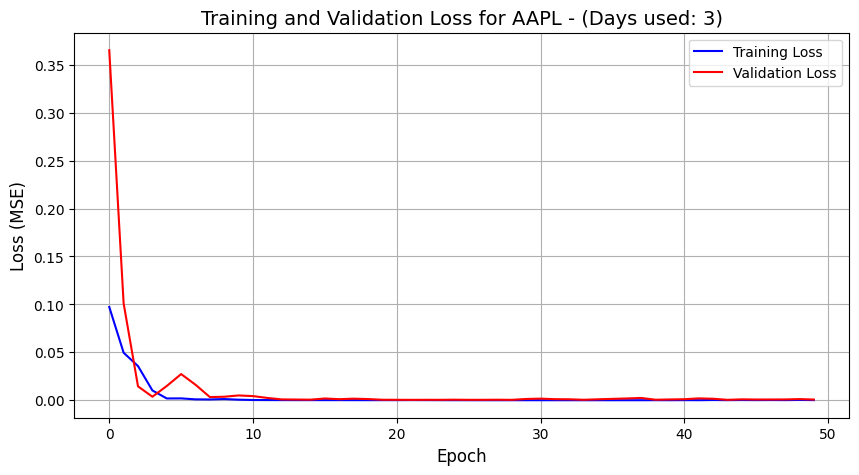

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  4.8528
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  39.700557
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 6.3008
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.18%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


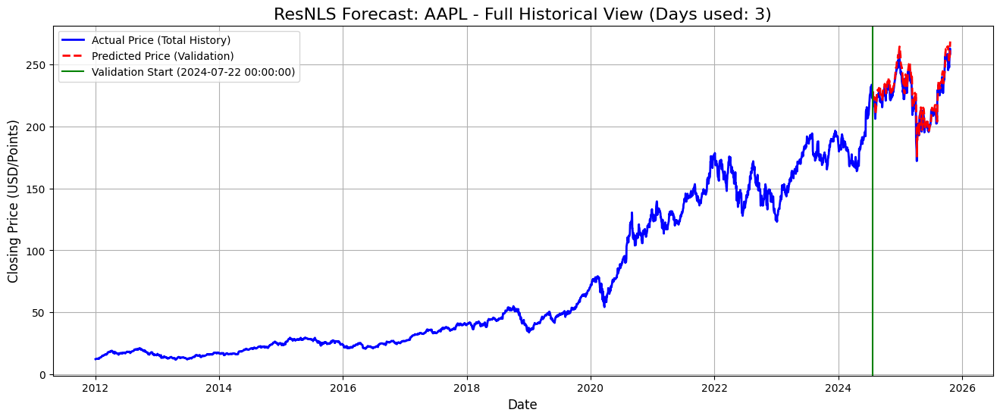

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


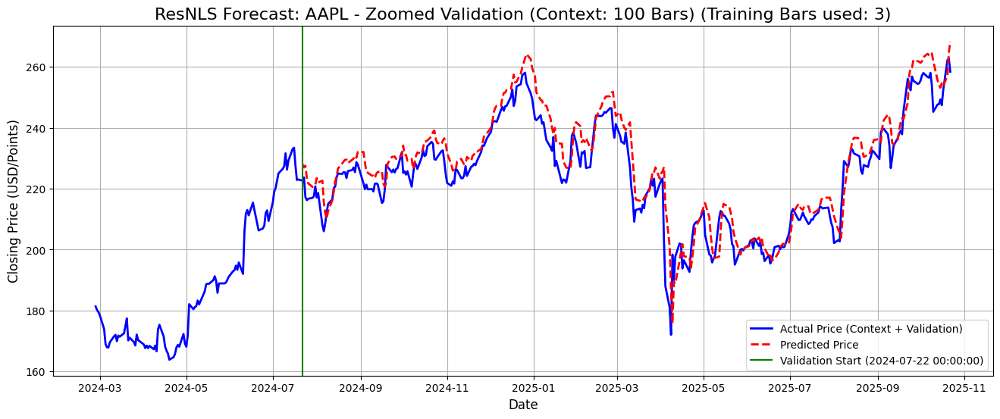

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 225.70 (Pred. Ret: 2.21%)
👋 2025-01-29 00:00: SELL @ 233.29 (Pred. Ret: -0.01%)
🛒 2025-01-30 00:00: BUY @ 237.83 (Pred. Ret: 1.12%)
👋 2025-04-10 00:00: SELL @ 188.61 (Pred. Ret: -4.49%)
🛒 2025-04-16 00:00: BUY @ 197.88 (Pred. Ret: 0.08%)
👋 2025-04-23 00:00: SELL @ 205.50 (Pred. Ret: -0.88%)
🛒 2025-04-28 00:00: BUY @ 209.49 (Pred. Ret: 0.48%)
👋 2025-05-12 00:00: SELL @ 210.73 (Pred. Ret: -0.18%)
🛒 2025-05-15 00:00: BUY @ 210.71 (Pred. Ret: 1.39%)
👋 2025-05-28 00:00: SELL @ 200.36 (Pred. Ret: -0.07%)
🛒 2025-05-30 00:00: BUY @ 199.14 (Pred. Ret: 0.45%)
👋 2025-06-23 00:00: SELL @ 201.40 (Pred. Ret: -0.78%)
🛒 2025-06-25 00:00: BUY @ 201.22 (Pred. Ret: 0.63%)
👋 2025-07-01 00:00: SELL @ 206.44 (Pred. Ret: -0.28%)
🛒 2025-07-07 00:00: BUY @ 212.44 (Pred. Ret: 0.79%)
👋 2025-08-

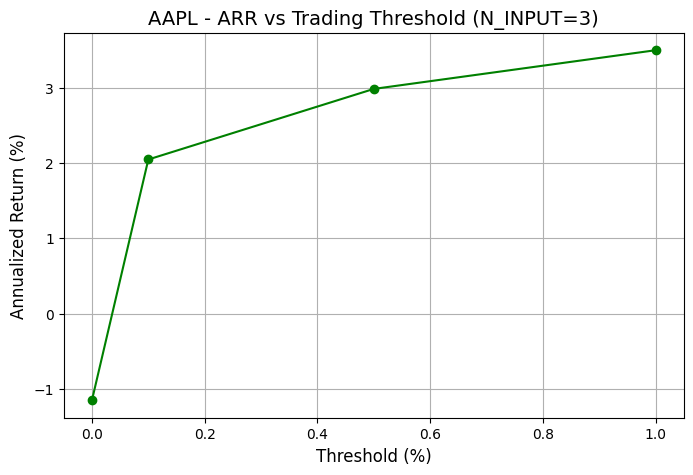

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on train

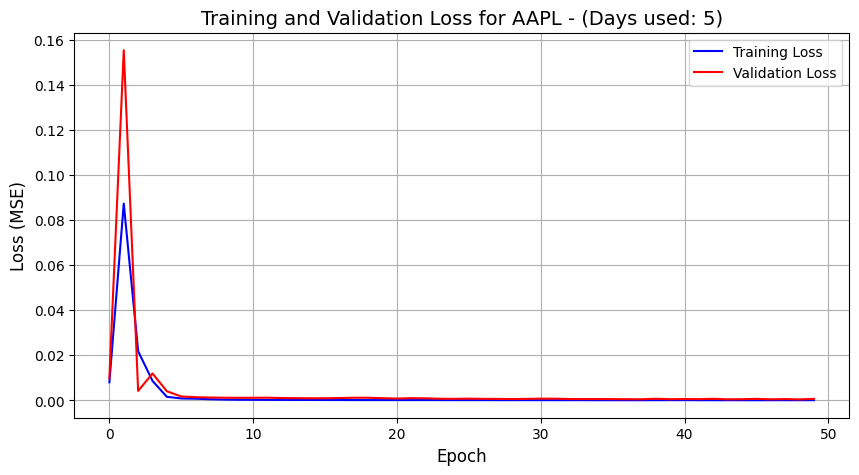

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  4.6563
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  33.279671
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 5.7689
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.08%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


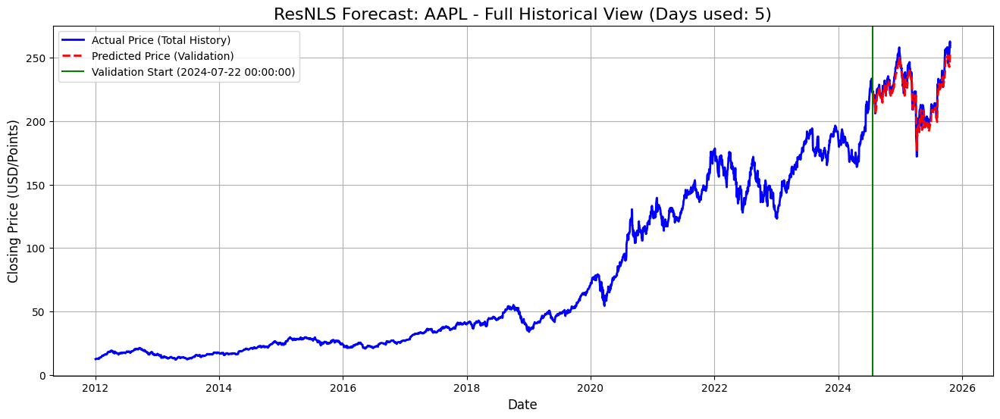

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


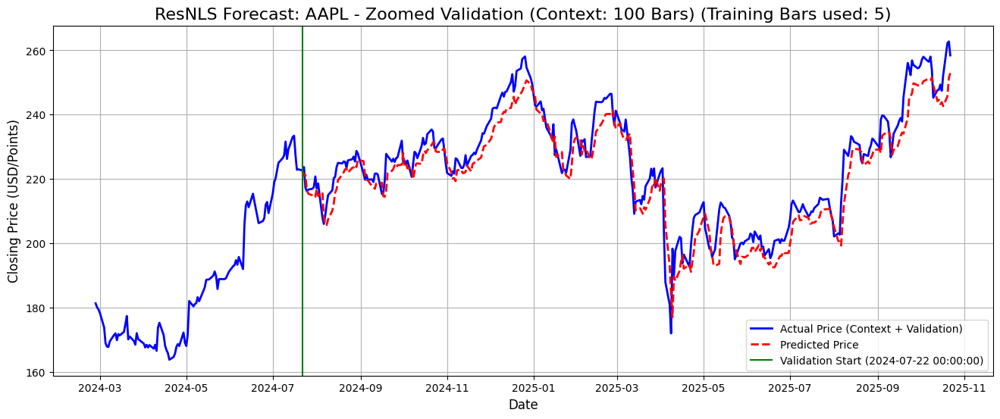

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-08-06 00:00: BUY @ 204.11 (Pred. Ret: 0.10%)
👋 2024-08-07 00:00: SELL @ 205.70 (Pred. Ret: -0.18%)
🛒 2024-11-01 00:00: BUY @ 219.95 (Pred. Ret: 0.04%)
👋 2024-11-05 00:00: SELL @ 220.77 (Pred. Ret: -0.38%)
🛒 2025-01-22 00:00: BUY @ 219.01 (Pred. Ret: 0.25%)
👋 2025-01-23 00:00: SELL @ 223.95 (Pred. Ret: -0.38%)
🛒 2025-02-04 00:00: BUY @ 226.45 (Pred. Ret: 0.17%)
👋 2025-02-05 00:00: SELL @ 227.72 (Pred. Ret: -0.74%)
🛒 2025-03-11 00:00: BUY @ 223.26 (Pred. Ret: 0.04%)
👋 2025-03-17 00:00: SELL @ 212.79 (Pred. Ret: -0.95%)
🛒 2025-04-04 00:00: BUY @ 193.42 (Pred. Ret: 1.48%)
👋 2025-04-10 00:00: SELL @ 188.61 (Pred. Ret: -4.37%)
🛒 2025-09-11 00:00: BUY @ 226.88 (Pred. Ret: 0.35%)
👋 2025-09-12 00:00: SELL @ 229.22 (Pred. Ret: -0.44%)
✅ Threshold None (0.00%) → ARR: -1.86%, Total Return: -2.33%, 

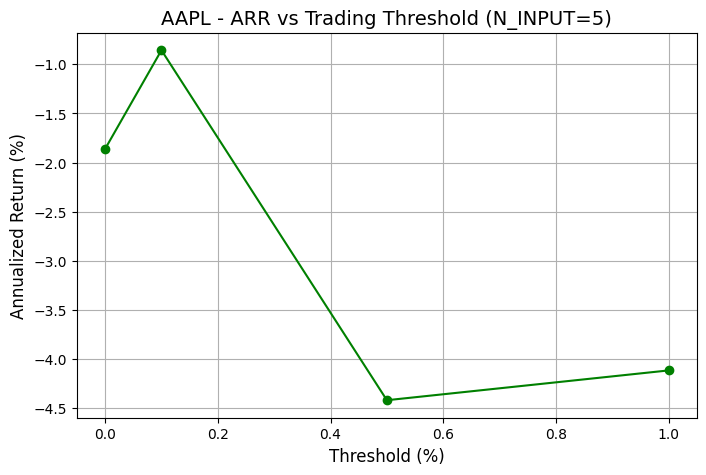

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on tr

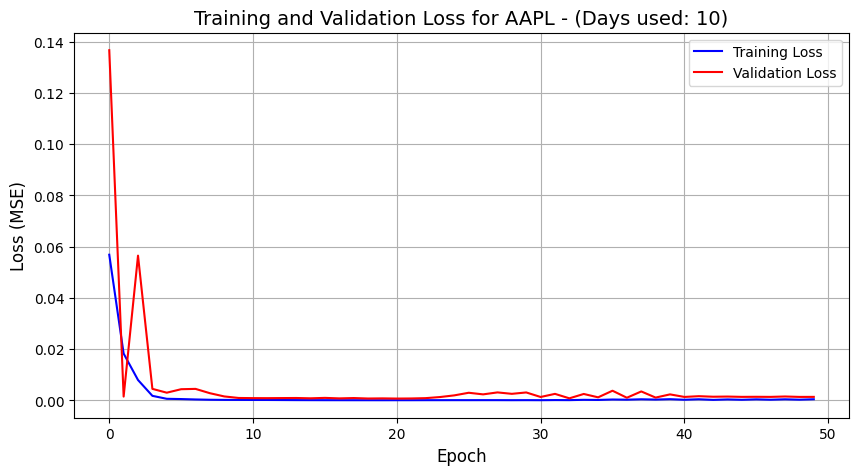

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  6.7687
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  69.186292
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 8.3178
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.96%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


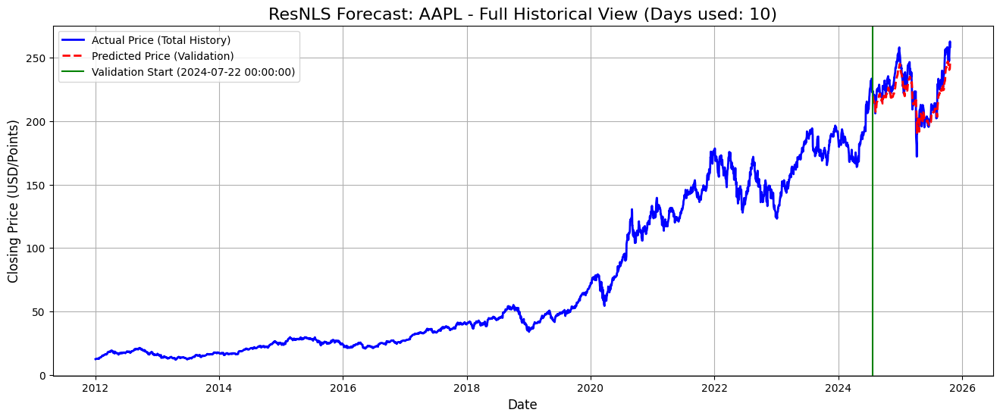

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


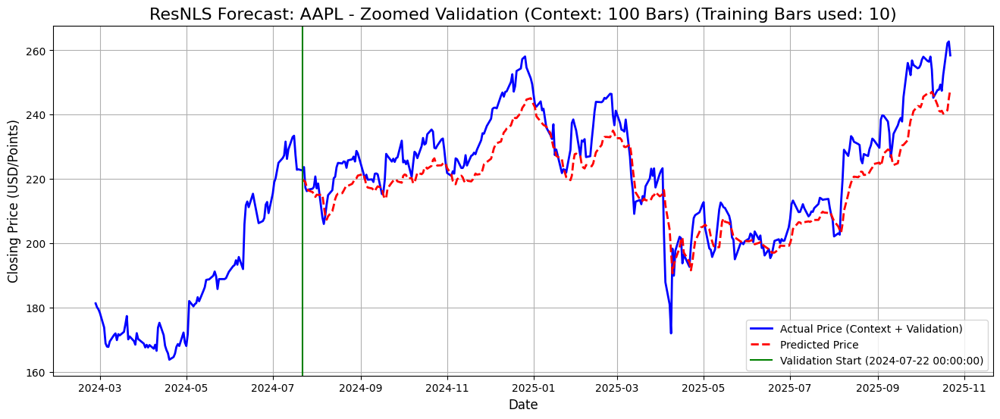

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-26 00:00: BUY @ 217.44 (Pred. Ret: 0.10%)
👋 2024-07-29 00:00: SELL @ 215.71 (Pred. Ret: -0.35%)
🛒 2024-08-06 00:00: BUY @ 204.11 (Pred. Ret: 1.77%)
👋 2024-08-08 00:00: SELL @ 211.88 (Pred. Ret: -0.60%)
🛒 2025-01-22 00:00: BUY @ 219.01 (Pred. Ret: 0.69%)
👋 2025-01-23 00:00: SELL @ 223.95 (Pred. Ret: -0.40%)
🛒 2025-03-11 00:00: BUY @ 223.26 (Pred. Ret: 0.26%)
👋 2025-03-18 00:00: SELL @ 213.64 (Pred. Ret: -0.14%)
🛒 2025-03-19 00:00: BUY @ 213.70 (Pred. Ret: 0.51%)
👋 2025-03-20 00:00: SELL @ 213.47 (Pred. Ret: -0.37%)
🛒 2025-04-04 00:00: BUY @ 193.42 (Pred. Ret: 4.52%)
👋 2025-04-10 00:00: SELL @ 188.61 (Pred. Ret: -2.48%)
🛒 2025-04-11 00:00: BUY @ 185.65 (Pred. Ret: 2.60%)
👋 2025-04-15 00:00: SELL @ 201.37 (Pred. Ret: -0.51%)
🛒 2025-04-16 00:00: BUY @ 197.88 (Pred. Ret: 0.09%)
👋 2025-04-

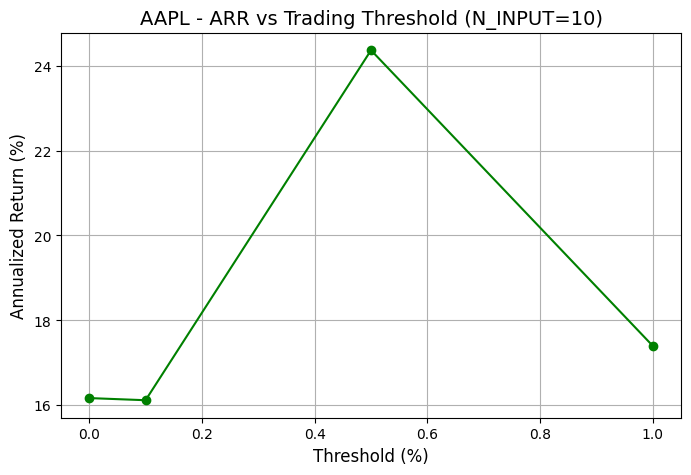

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on t

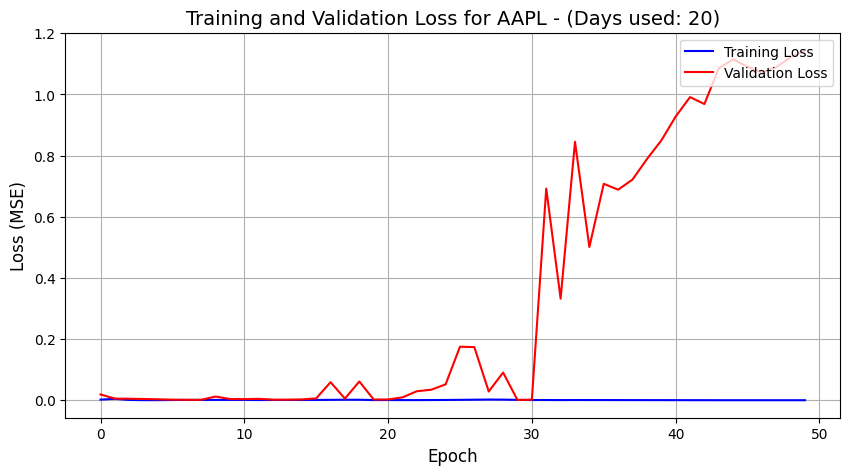

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  234.9549
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  56194.761855
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 237.0543
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 104.42%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


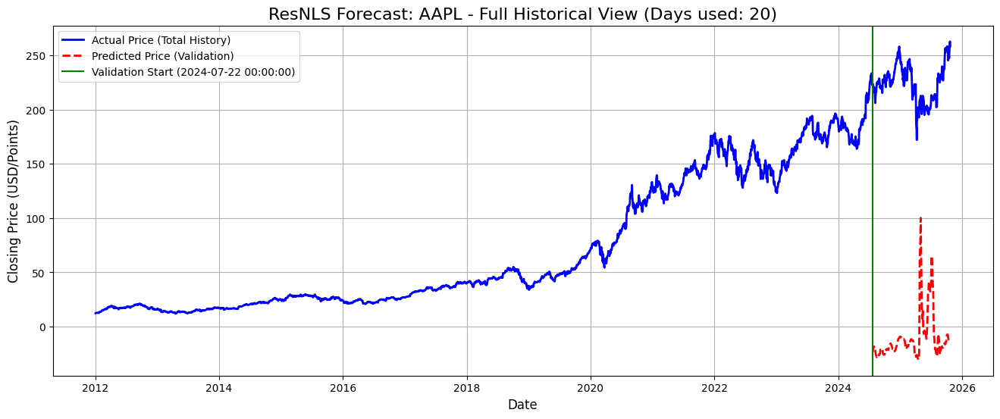

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


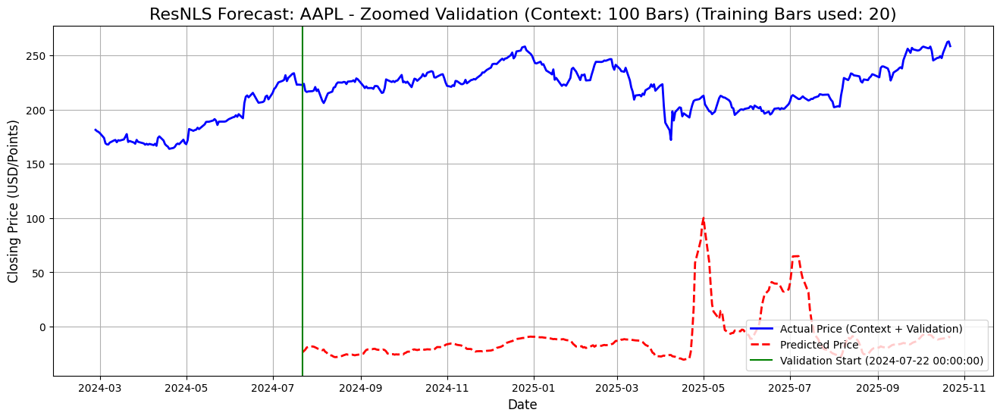

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

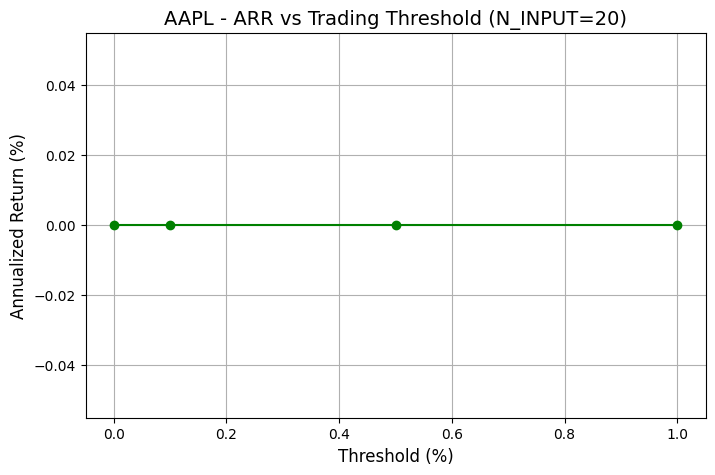

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on t

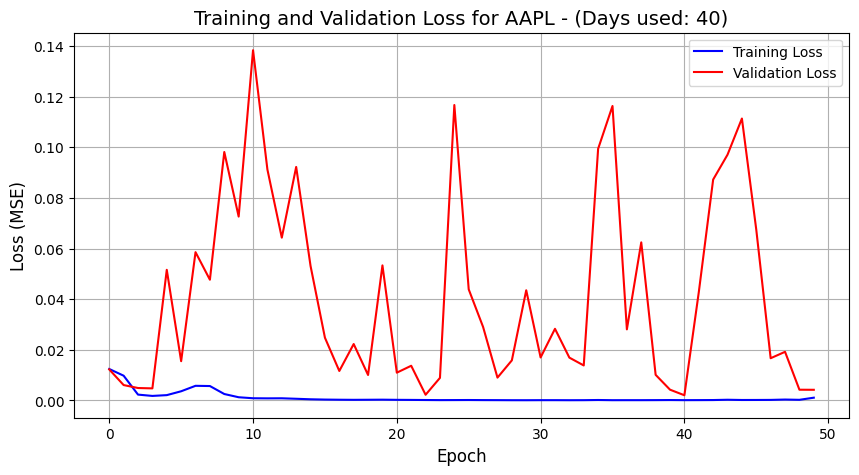

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  12.0940
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  206.916610
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 14.3846
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 5.25%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


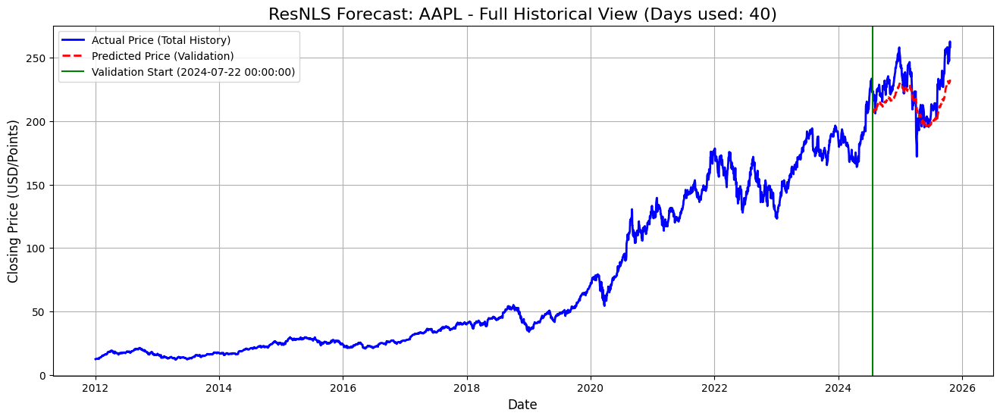

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


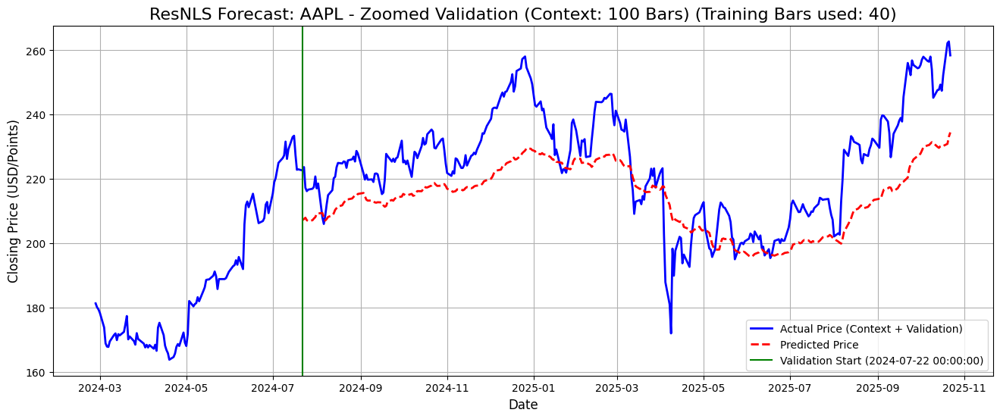

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-08-07 00:00: BUY @ 205.70 (Pred. Ret: 0.51%)
👋 2024-08-08 00:00: SELL @ 211.88 (Pred. Ret: -0.50%)
🛒 2025-01-22 00:00: BUY @ 219.01 (Pred. Ret: 0.97%)
👋 2025-01-28 00:00: SELL @ 230.03 (Pred. Ret: -2.28%)
🛒 2025-03-12 00:00: BUY @ 219.60 (Pred. Ret: 0.08%)
👋 2025-03-24 00:00: SELL @ 220.46 (Pred. Ret: -0.79%)
🛒 2025-04-04 00:00: BUY @ 193.42 (Pred. Ret: 6.15%)
👋 2025-04-25 00:00: SELL @ 205.87 (Pred. Ret: -1.67%)
🛒 2025-05-06 00:00: BUY @ 197.73 (Pred. Ret: 1.60%)
👋 2025-05-13 00:00: SELL @ 210.19 (Pred. Ret: -5.01%)
🛒 2025-05-27 00:00: BUY @ 198.08 (Pred. Ret: 0.96%)
👋 2025-05-28 00:00: SELL @ 200.36 (Pred. Ret: -1.39%)
🛒 2025-06-16 00:00: BUY @ 197.08 (Pred. Ret: 0.26%)
👋 2025-06-17 00:00: SELL @ 196.98 (Pred. Ret: -0.76%)
🛒 2025-06-18 00:00: BUY @ 195.72 (Pred. Ret: 0.51%)
👋 2025-06-

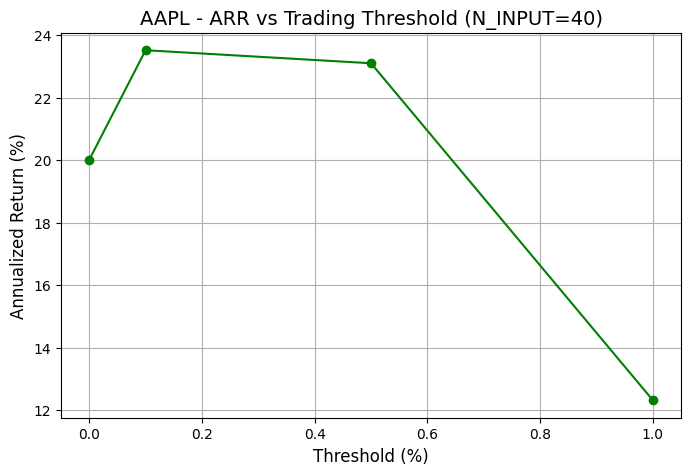

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AAPL (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for AAPL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AAPL...
⚖️ Scaler fitted on t

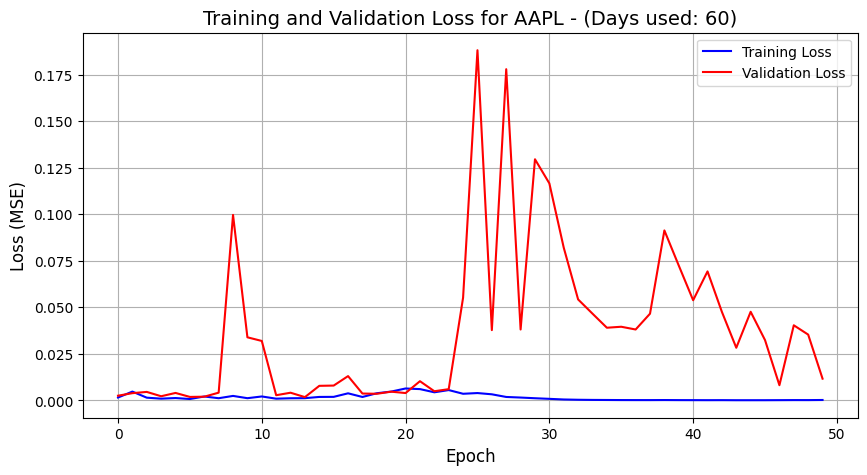

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AAPL
     📏 MAE:  22.1266
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  574.281559
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 23.9642
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 9.89%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


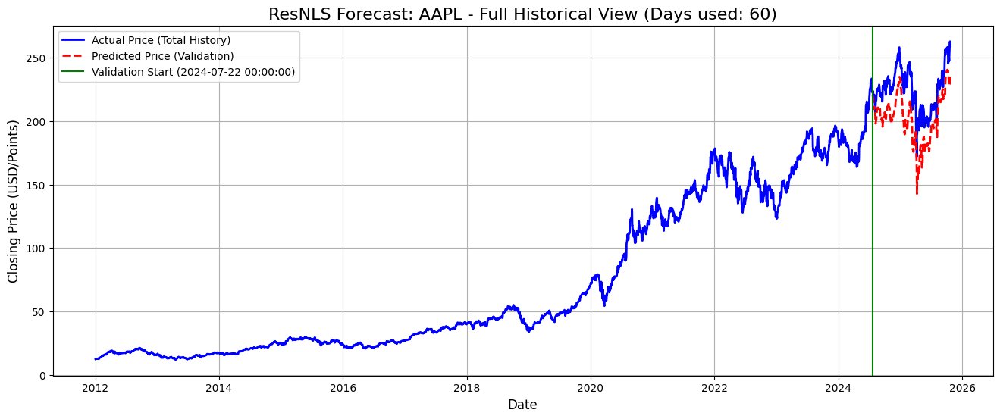

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


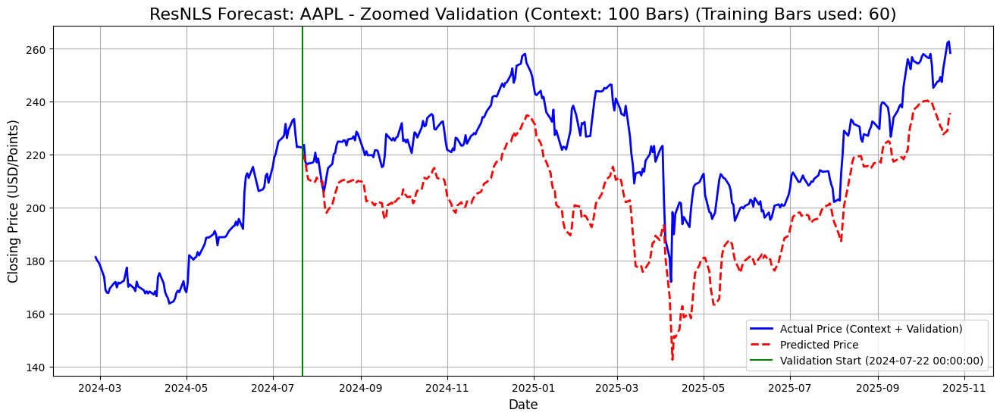

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 12.48% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

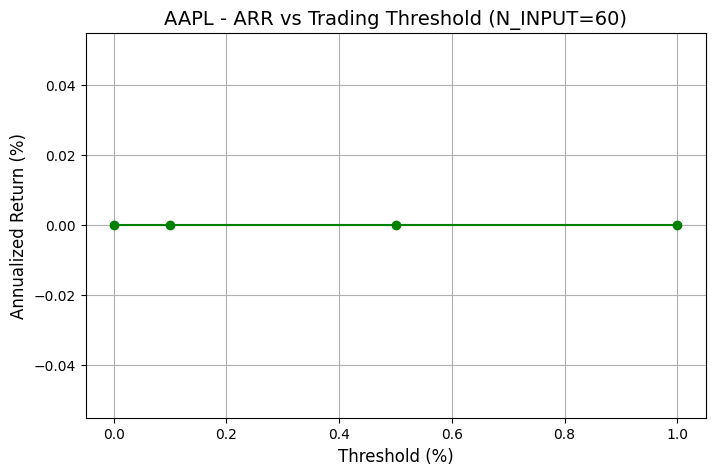

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for AAPL.


In [12]:
all_n_forecasts('AAPL')

# GOOGLE

🔥 Starting all N-input forecast experiments for Ticker: GOOGL...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted on tra

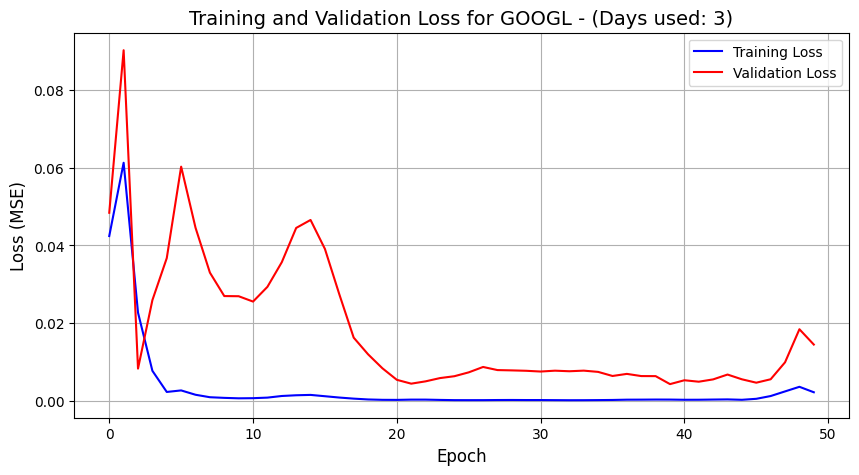

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  20.2429
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  448.942530
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 21.1883
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 10.94%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


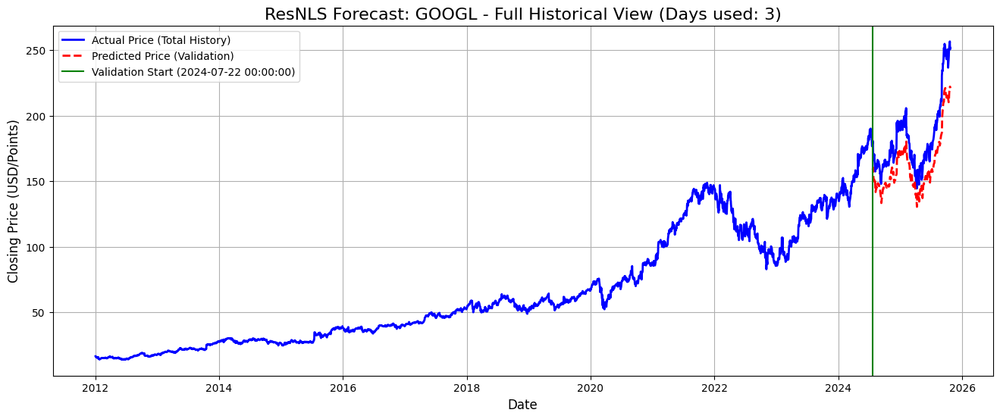

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


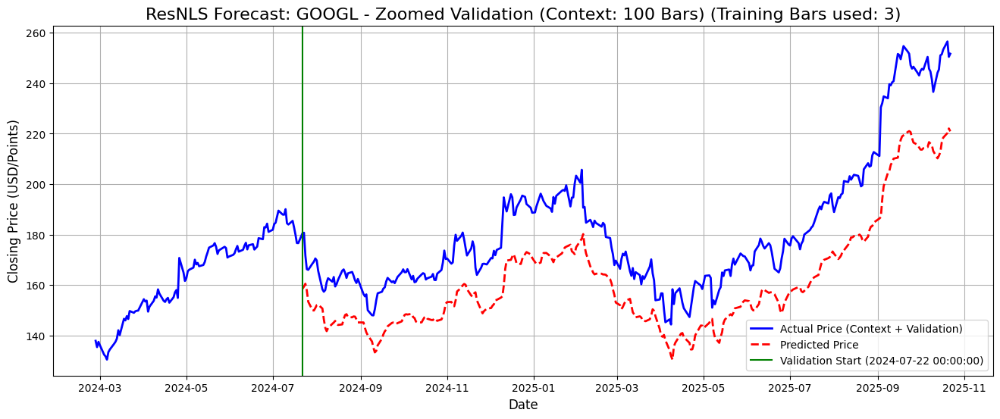

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

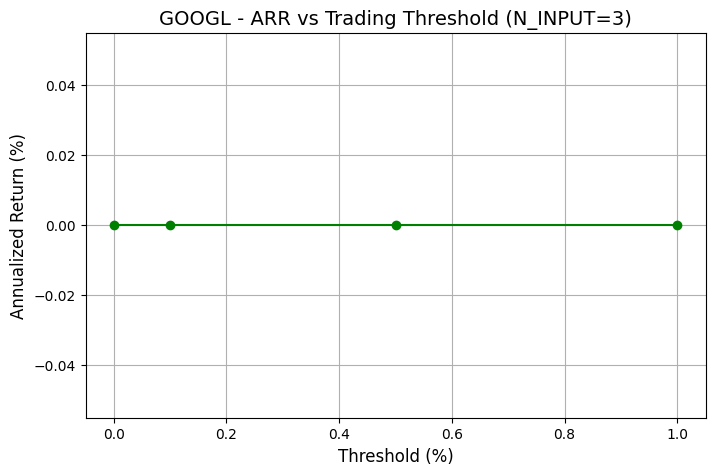

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted on tr

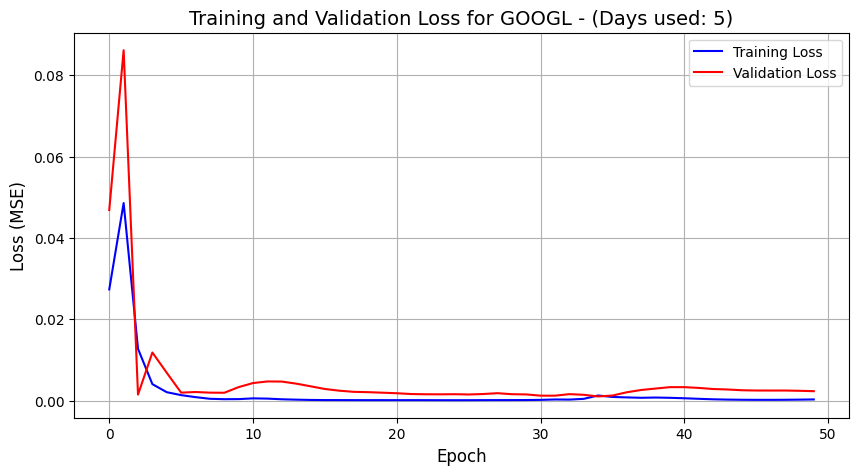

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  7.2745
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  72.376111
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 8.5074
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 3.90%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


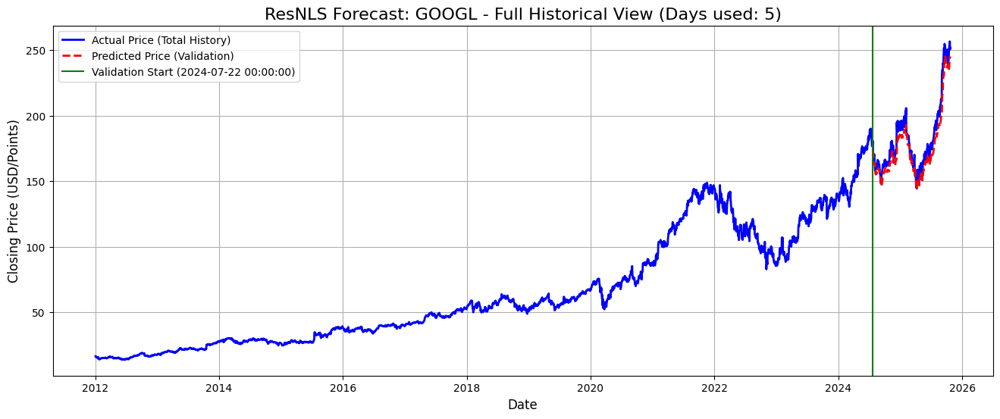

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


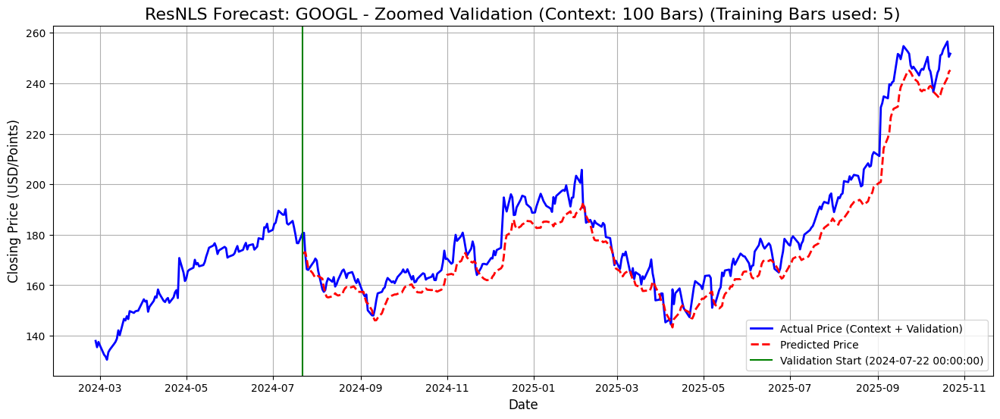

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-26 00:00: BUY @ 166.20 (Pred. Ret: 0.25%)
👋 2024-07-29 00:00: SELL @ 167.87 (Pred. Ret: -0.70%)
🛒 2024-08-06 00:00: BUY @ 158.42 (Pred. Ret: 0.57%)
👋 2024-08-07 00:00: SELL @ 160.33 (Pred. Ret: -0.34%)
🛒 2024-09-09 00:00: BUY @ 151.84 (Pred. Ret: 0.00%)
👋 2024-09-10 00:00: SELL @ 149.79 (Pred. Ret: -0.56%)
🛒 2025-03-31 00:00: BUY @ 152.79 (Pred. Ret: 1.31%)
👋 2025-04-01 00:00: SELL @ 153.30 (Pred. Ret: -0.39%)
🛒 2025-04-07 00:00: BUY @ 141.25 (Pred. Ret: 0.72%)
👋 2025-04-08 00:00: SELL @ 150.90 (Pred. Ret: -0.88%)
🛒 2025-05-08 00:00: BUY @ 154.67 (Pred. Ret: 1.75%)
👋 2025-05-09 00:00: SELL @ 153.85 (Pred. Ret: -1.08%)
✅ Threshold None (0.00%) → ARR: 5.95%, Total Return: 7.51%, Buys: 6
🚀 Running backtest for threshold = 0.10%
🛒 2024-07-26 00:00: BUY @ 166.20 (Pred. Ret: 0.25%)
👋 2024-

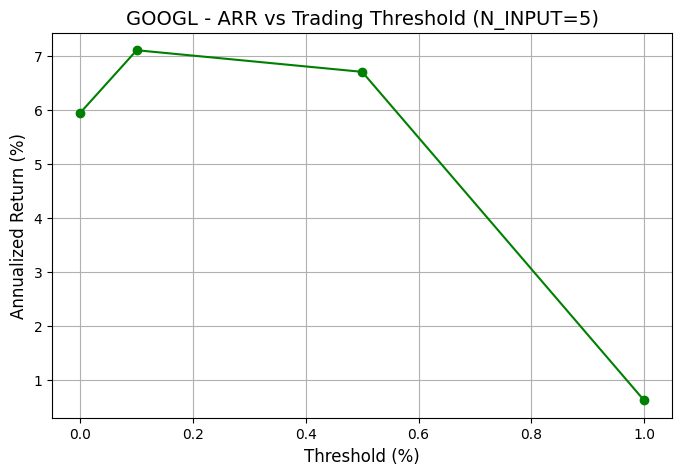

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted on

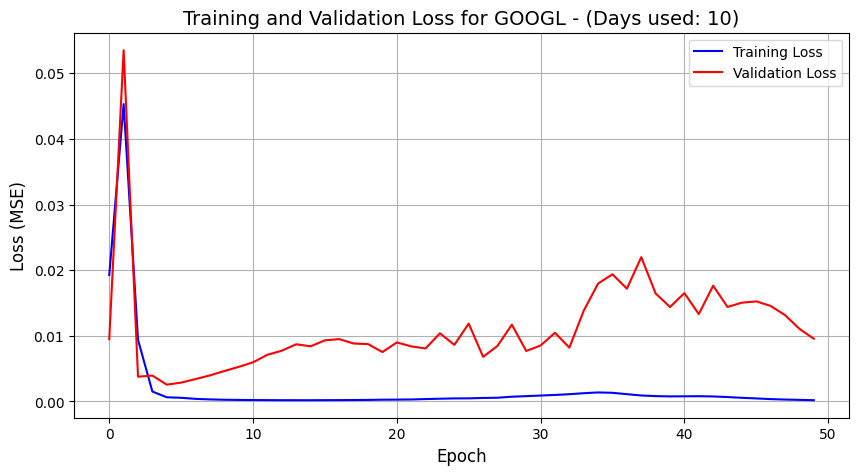

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  14.0006
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  296.491262
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 17.2189
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 7.15%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


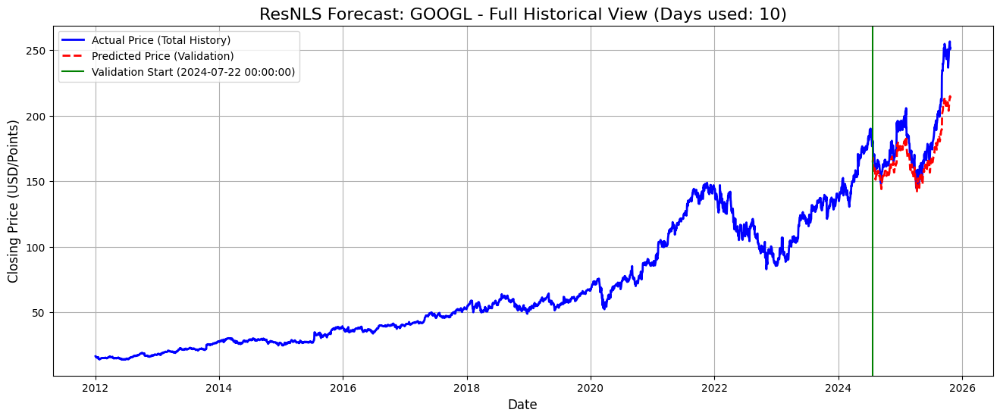

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


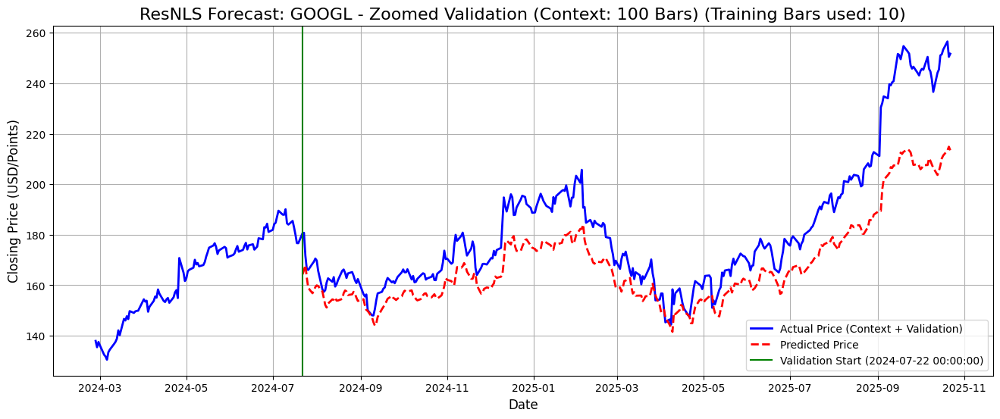

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-05-08 00:00: BUY @ 154.67 (Pred. Ret: 0.01%)
👋 2025-05-09 00:00: SELL @ 153.85 (Pred. Ret: -3.22%)
✅ Threshold None (0.00%) → ARR: -0.43%, Total Return: -0.54%, Buys: 1
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    1         -0.54               -0.43     
0.10           0         0.00                0.00  

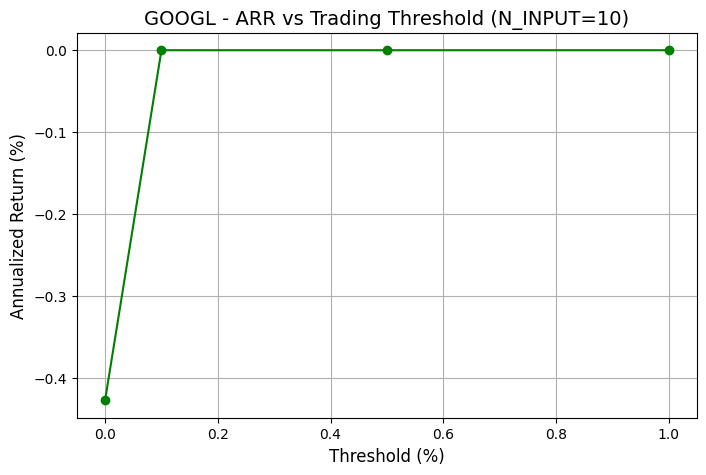

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted o

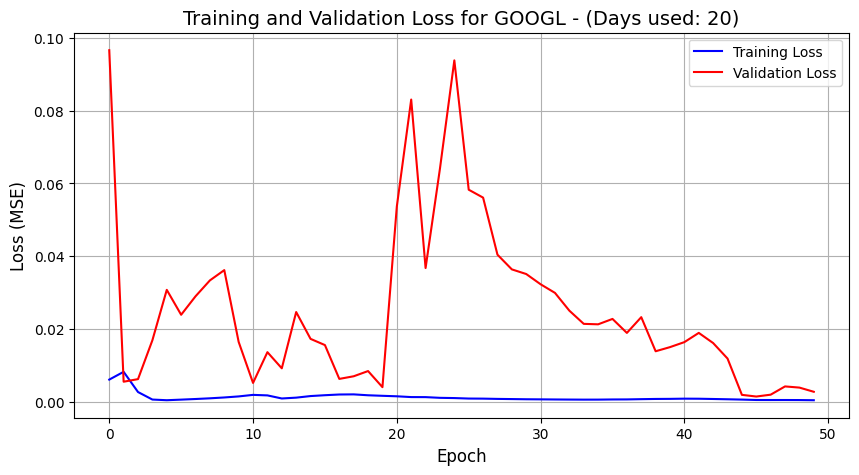

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  7.5217
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  85.710410
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 9.2580
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 4.23%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


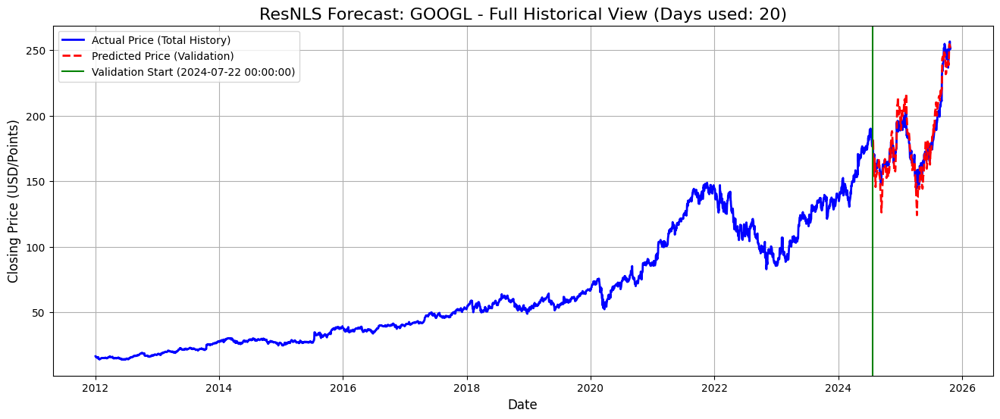

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


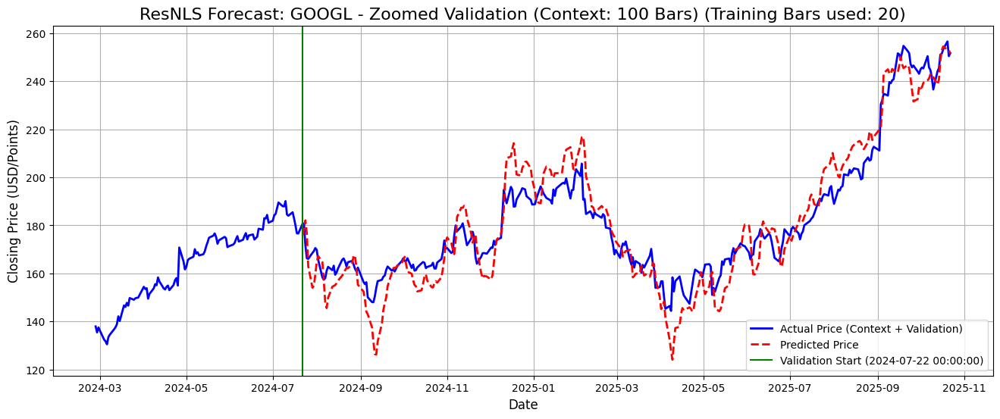

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-24 00:00: BUY @ 172.61 (Pred. Ret: 0.75%)
👋 2024-07-26 00:00: SELL @ 166.20 (Pred. Ret: -1.97%)
🛒 2024-08-27 00:00: BUY @ 164.89 (Pred. Ret: 1.33%)
👋 2024-08-30 00:00: SELL @ 161.69 (Pred. Ret: -3.43%)
🛒 2024-09-24 00:00: BUY @ 162.31 (Pred. Ret: 0.65%)
👋 2024-10-03 00:00: SELL @ 163.69 (Pred. Ret: -0.65%)
🛒 2024-11-01 00:00: BUY @ 169.32 (Pred. Ret: 2.70%)
👋 2024-11-06 00:00: SELL @ 173.04 (Pred. Ret: -0.58%)
🛒 2024-11-08 00:00: BUY @ 179.86 (Pred. Ret: 1.95%)
👋 2024-11-19 00:00: SELL @ 172.96 (Pred. Ret: -0.98%)
🛒 2024-11-21 00:00: BUY @ 173.14 (Pred. Ret: 0.60%)
👋 2024-11-25 00:00: SELL @ 165.36 (Pred. Ret: -2.31%)
🛒 2024-12-06 00:00: BUY @ 171.27 (Pred. Ret: 1.20%)
👋 2025-01-06 00:00: SELL @ 193.35 (Pred. Ret: -1.05%)
🛒 2025-01-08 00:00: BUY @ 191.94 (Pred. Ret: 3.44%)
👋 2025-02-

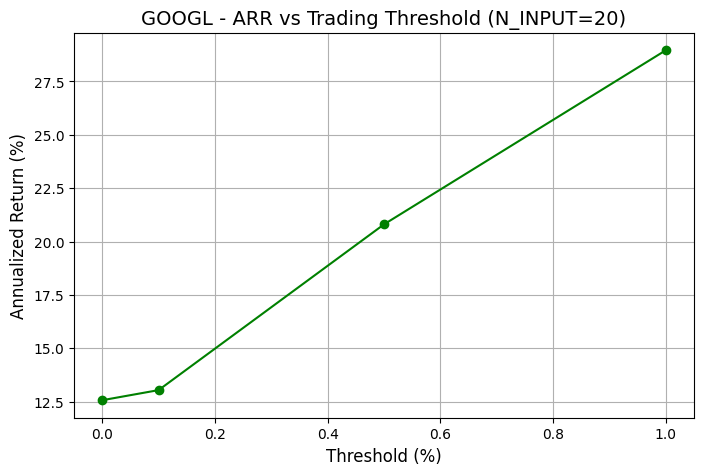

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted o

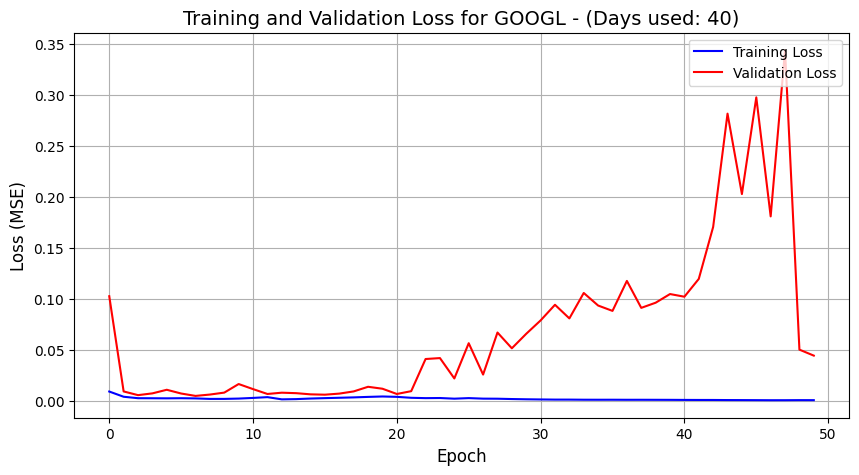

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  33.2349
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  1381.813911
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 37.1728
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 18.45%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


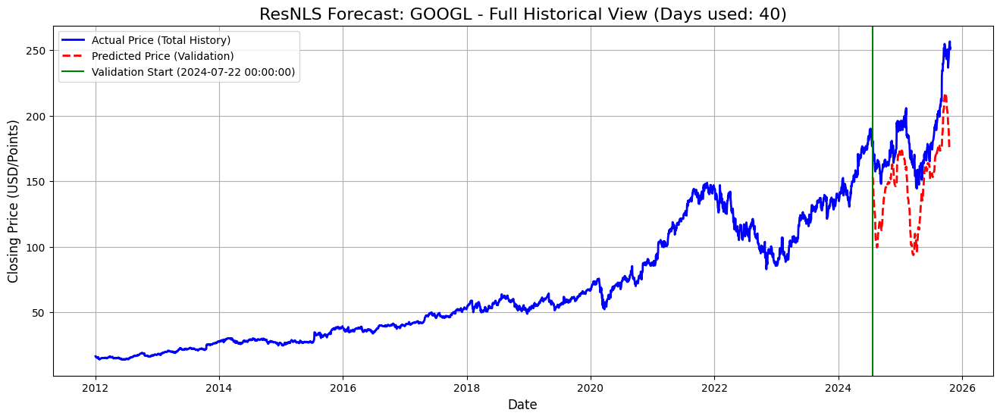

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


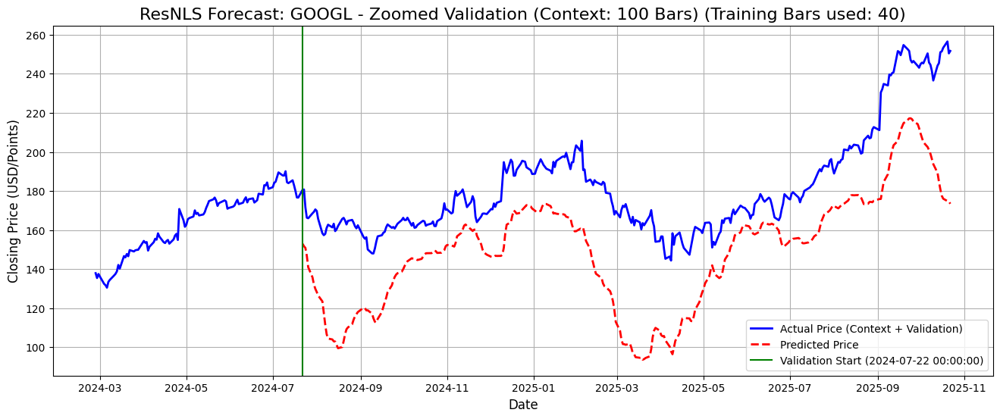

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

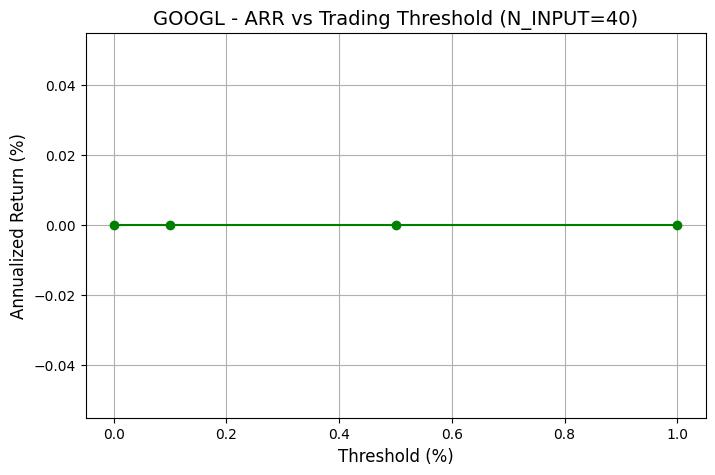

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GOOGL (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for GOOGL (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GOOGL...
⚖️ Scaler fitted o

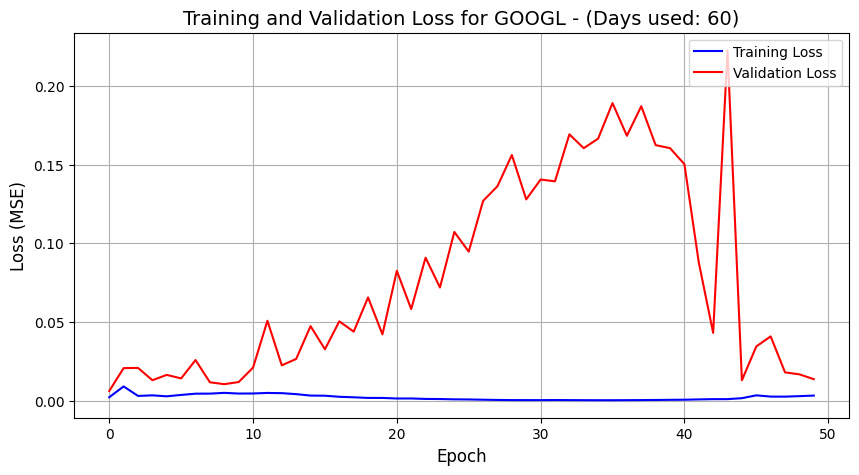

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GOOGL
     📏 MAE:  15.0097
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  423.394940
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 20.5766
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 7.71%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


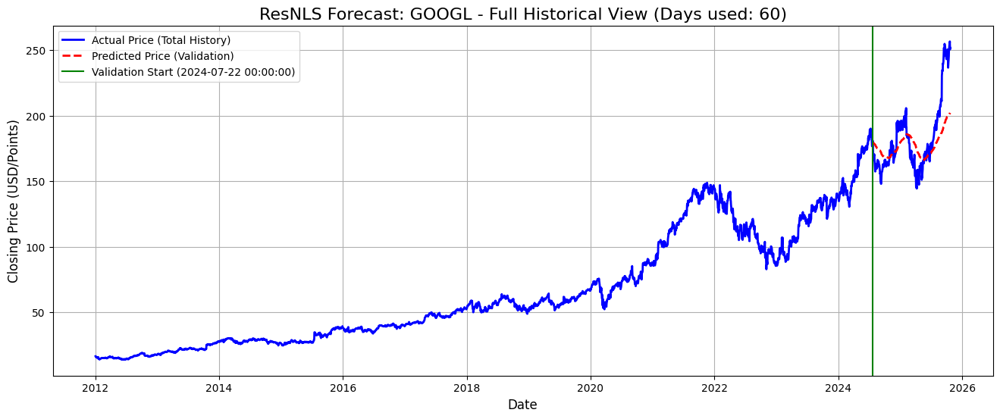

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


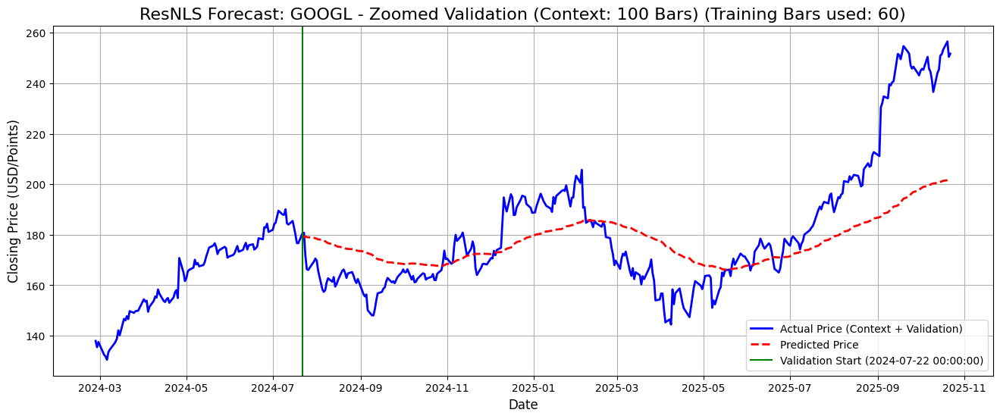

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 32.62% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 179.56 (Pred. Ret: 1.37%)
👋 2024-07-23 00:00: SELL @ 181.01 (Pred. Ret: -0.79%)
🛒 2024-07-25 00:00: BUY @ 171.53 (Pred. Ret: 4.34%)
👋 2024-10-30 00:00: SELL @ 179.89 (Pred. Ret: -0.62%)
🛒 2024-11-05 00:00: BUY @ 168.69 (Pred. Ret: 0.29%)
👋 2024-11-07 00:00: SELL @ 176.63 (Pred. Ret: -3.53%)
🛒 2024-11-18 00:00: BUY @ 172.66 (Pred. Ret: 0.10%)
👋 2024-11-19 00:00: SELL @ 172.96 (Pred. Ret: -1.39%)
🛒 2024-11-22 00:00: BUY @ 165.12 (Pred. Ret: 3.30%)
👋 2024-12-05 00:00: SELL @ 174.59 (Pred. Ret: -0.37%)
🛒 2024-12-06 00:00: BUY @ 171.27 (Pred. Ret: 0.66%)
👋 2024-12-09 00:00: SELL @ 173.39 (Pred. Ret: -0.46%)
🛒 2025-02-10 00:00: BUY @ 186.74 (Pred. Ret: 0.51%)
👋 2025-02-11 00:00: SELL @ 184.43 (Pred. Ret: -0.10%)
🛒 2025-02-12 00:00: BUY @ 182.62 (Pred. Ret: 0.47%)
👋 2025-02-

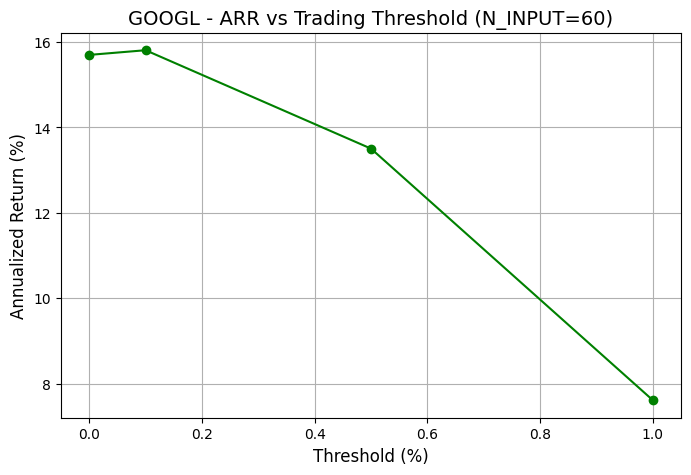

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for GOOGL.


In [13]:
all_n_forecasts('GOOGL')

# AMAZON

🔥 Starting all N-input forecast experiments for Ticker: AMZN...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on trainin

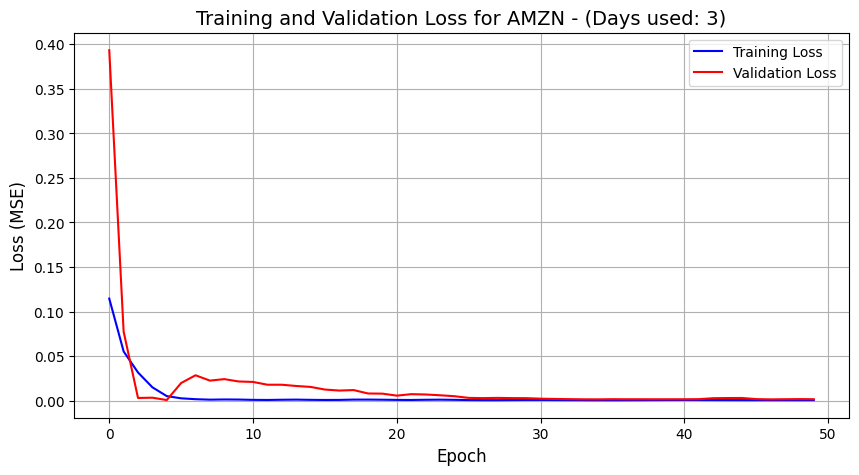

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  5.7413
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  56.416554
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 7.5111
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.72%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


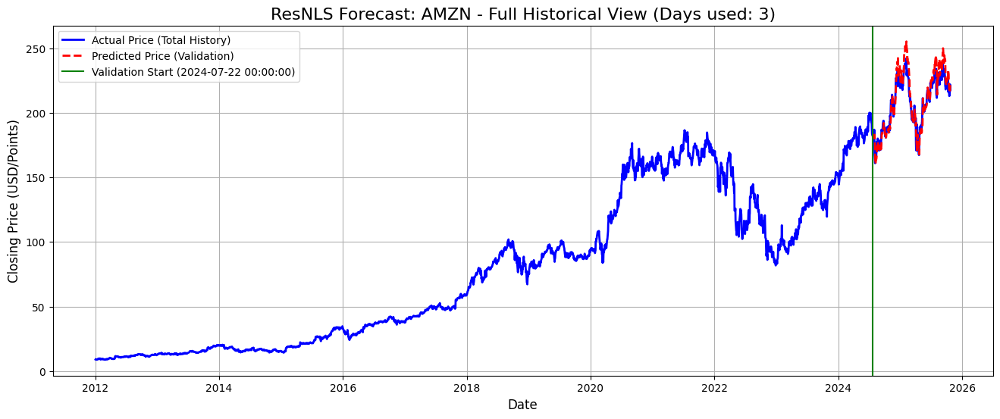

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


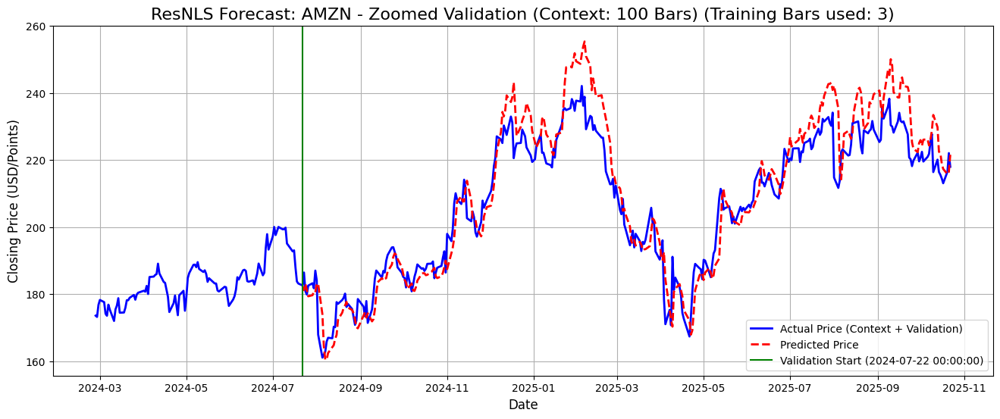

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-25 00:00: BUY @ 182.91 (Pred. Ret: 0.17%)
👋 2024-07-26 00:00: SELL @ 180.39 (Pred. Ret: -0.30%)
🛒 2024-08-05 00:00: BUY @ 154.21 (Pred. Ret: 3.61%)
👋 2024-08-07 00:00: SELL @ 166.55 (Pred. Ret: -0.91%)
🛒 2024-09-09 00:00: BUY @ 174.53 (Pred. Ret: 0.26%)
👋 2024-09-10 00:00: SELL @ 177.49 (Pred. Ret: -1.68%)
🛒 2024-09-30 00:00: BUY @ 187.14 (Pred. Ret: 0.04%)
👋 2024-10-01 00:00: SELL @ 184.90 (Pred. Ret: -0.19%)
🛒 2024-10-08 00:00: BUY @ 181.92 (Pred. Ret: 0.15%)
👋 2024-10-09 00:00: SELL @ 182.82 (Pred. Ret: -0.99%)
🛒 2024-10-24 00:00: BUY @ 185.25 (Pred. Ret: 0.31%)
👋 2024-10-25 00:00: SELL @ 187.85 (Pred. Ret: -0.88%)
🛒 2024-11-01 00:00: BUY @ 199.00 (Pred. Ret: 0.56%)
👋 2024-11-04 00:00: SELL @ 196.45 (Pred. Ret: -2.92%)
🛒 2024-11-11 00:00: BUY @ 208.50 (Pred. Ret: 0.45%)
👋 2024-11-

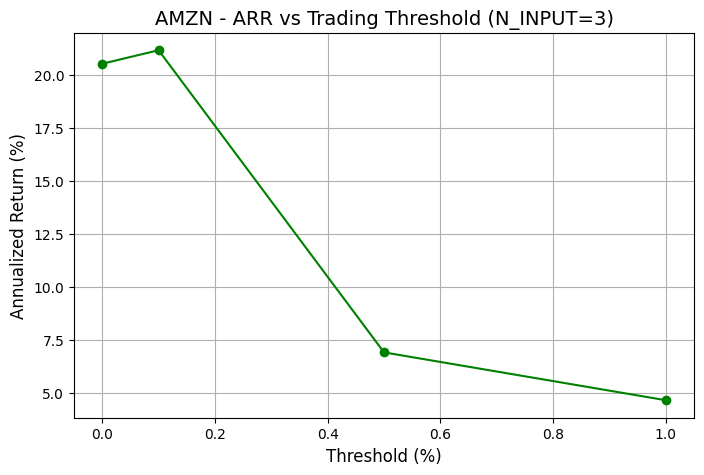

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on train

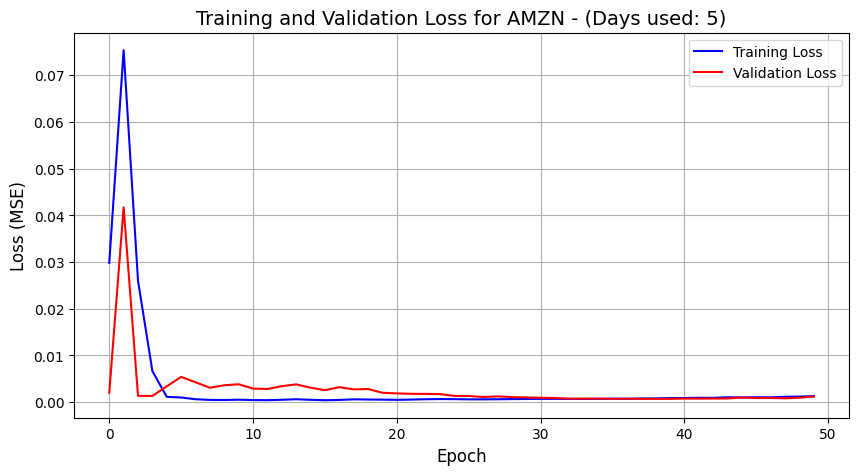

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  5.2383
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  43.773678
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 6.6162
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.61%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


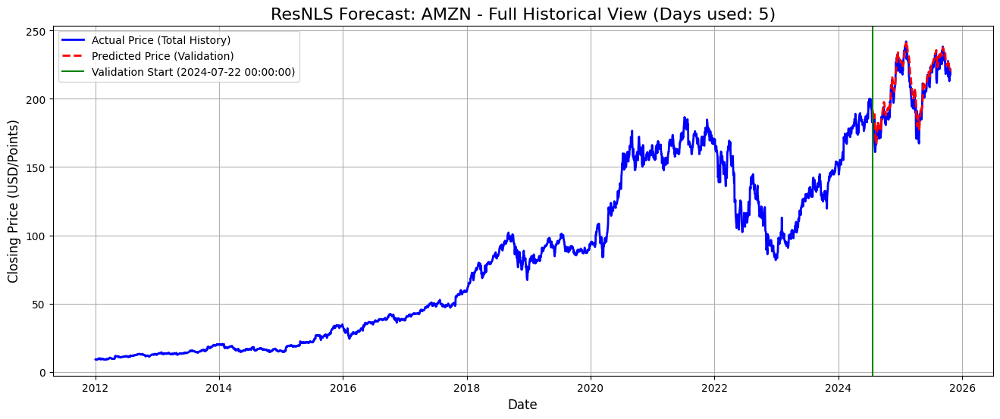

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


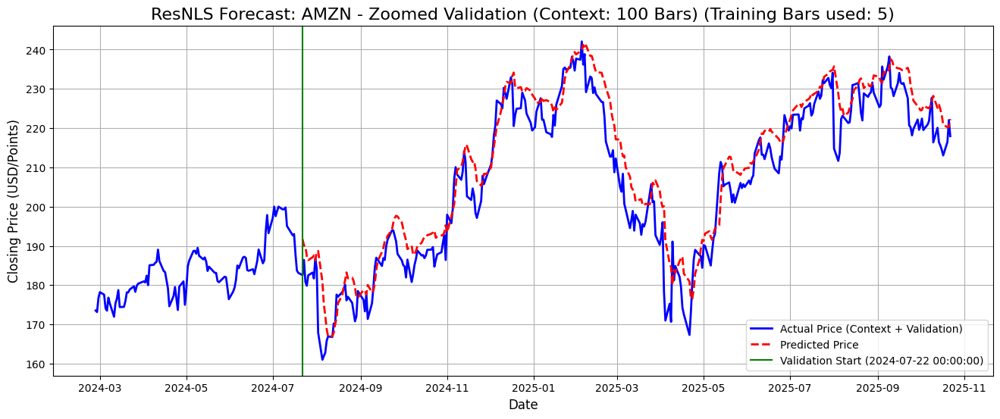

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 185.00 (Pred. Ret: 4.69%)
👋 2024-08-14 00:00: SELL @ 172.11 (Pred. Ret: -0.01%)
🛒 2024-08-15 00:00: BUY @ 174.86 (Pred. Ret: 0.83%)
👋 2024-08-16 00:00: SELL @ 177.04 (Pred. Ret: -1.23%)
🛒 2024-08-19 00:00: BUY @ 177.64 (Pred. Ret: 0.20%)
👋 2024-09-12 00:00: SELL @ 184.80 (Pred. Ret: -0.38%)
🛒 2024-09-16 00:00: BUY @ 185.29 (Pred. Ret: 1.05%)
👋 2024-11-04 00:00: SELL @ 196.45 (Pred. Ret: -0.21%)
🛒 2024-11-05 00:00: BUY @ 196.04 (Pred. Ret: 1.66%)
👋 2024-11-07 00:00: SELL @ 207.44 (Pred. Ret: -1.10%)
🛒 2024-11-11 00:00: BUY @ 208.50 (Pred. Ret: 0.99%)
👋 2024-12-05 00:00: SELL @ 218.03 (Pred. Ret: -0.23%)
🛒 2024-12-10 00:00: BUY @ 226.09 (Pred. Ret: 0.14%)
👋 2025-01-22 00:00: SELL @ 232.02 (Pred. Ret: -0.65%)
🛒 2025-01-27 00:00: BUY @ 226.21 (Pred. Ret: 0.53%)
👋 2025-02-

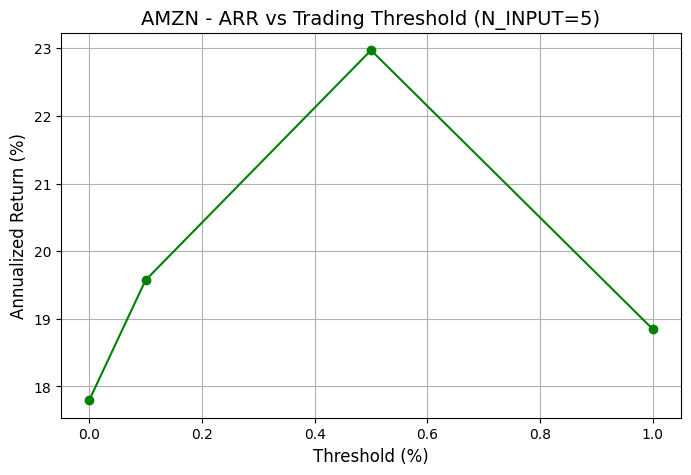

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on tr

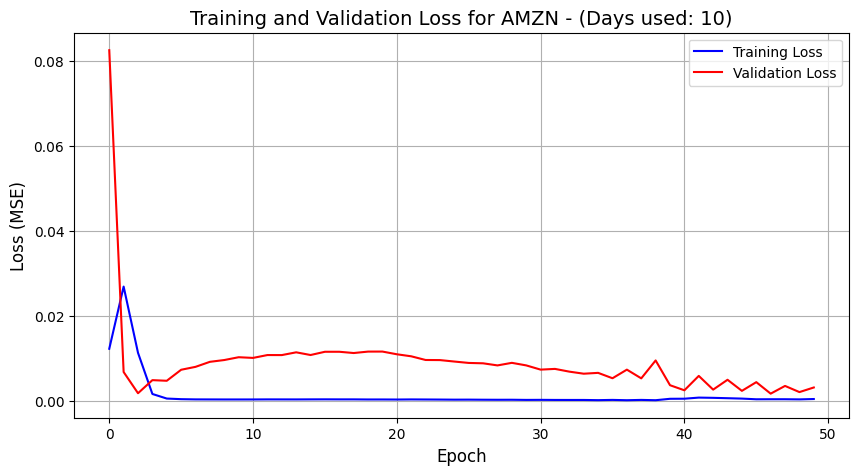

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  9.2801
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  117.934317
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 10.8598
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 4.35%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


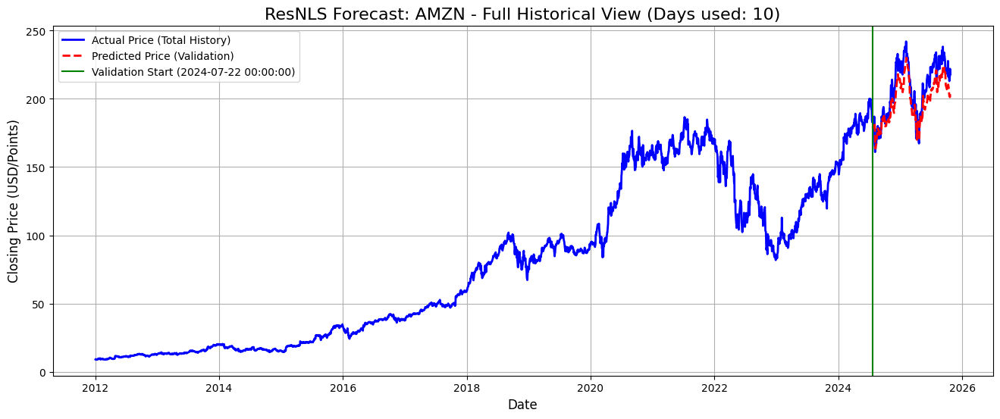

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


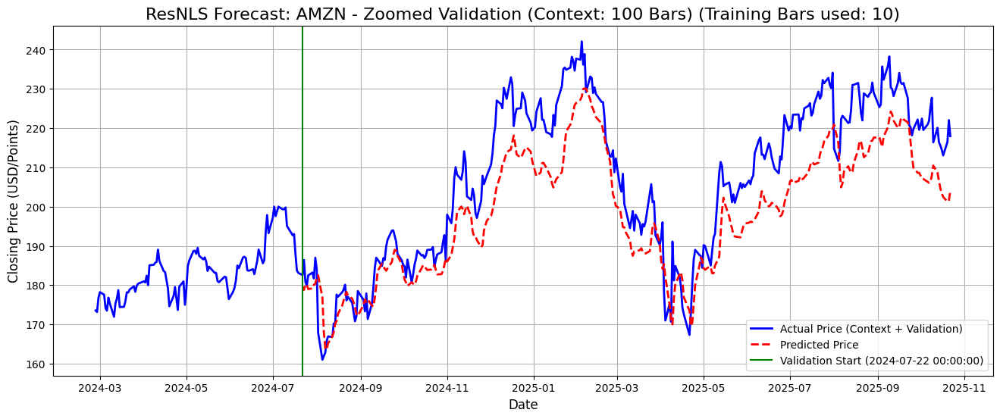

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-08-05 00:00: BUY @ 154.21 (Pred. Ret: 5.31%)
👋 2024-08-09 00:00: SELL @ 166.40 (Pred. Ret: -0.35%)
🛒 2024-08-12 00:00: BUY @ 168.14 (Pred. Ret: 0.02%)
👋 2024-08-14 00:00: SELL @ 172.11 (Pred. Ret: -0.06%)
🛒 2024-08-15 00:00: BUY @ 174.86 (Pred. Ret: 0.43%)
👋 2024-08-16 00:00: SELL @ 177.04 (Pred. Ret: -2.76%)
🛒 2024-08-23 00:00: BUY @ 177.34 (Pred. Ret: 0.73%)
👋 2024-08-26 00:00: SELL @ 176.70 (Pred. Ret: -0.26%)
🛒 2024-08-27 00:00: BUY @ 174.15 (Pred. Ret: 0.06%)
👋 2024-09-03 00:00: SELL @ 177.55 (Pred. Ret: -1.98%)
🛒 2024-09-04 00:00: BUY @ 174.48 (Pred. Ret: 0.06%)
👋 2024-09-06 00:00: SELL @ 177.24 (Pred. Ret: -0.88%)
🛒 2024-09-09 00:00: BUY @ 174.53 (Pred. Ret: 1.99%)
👋 2024-09-10 00:00: SELL @ 177.49 (Pred. Ret: -0.47%)
🛒 2025-04-04 00:00: BUY @ 167.15 (Pred. Ret: 2.03%)
👋 2025-04-

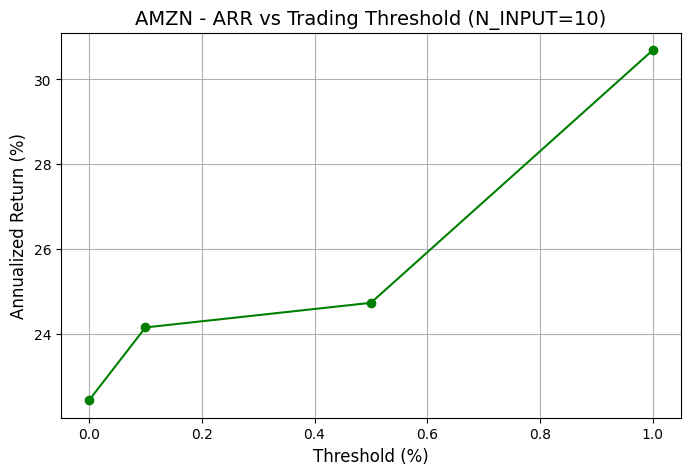

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on t

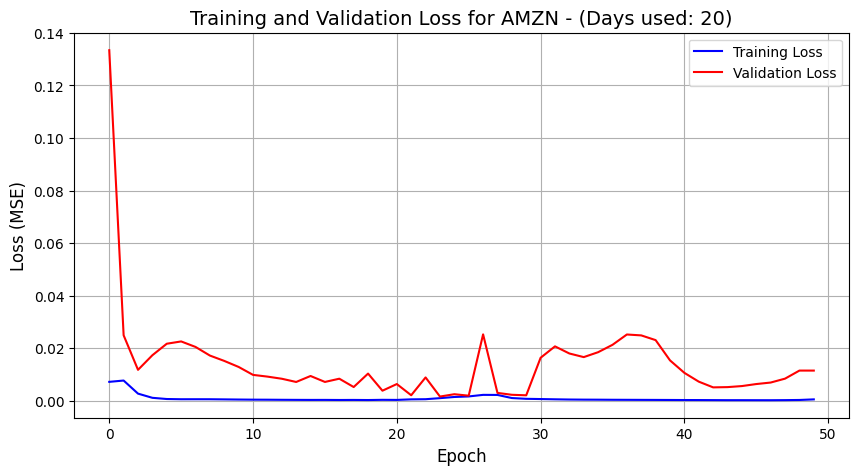

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  19.3472
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  418.649634
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 20.4609
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 9.18%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


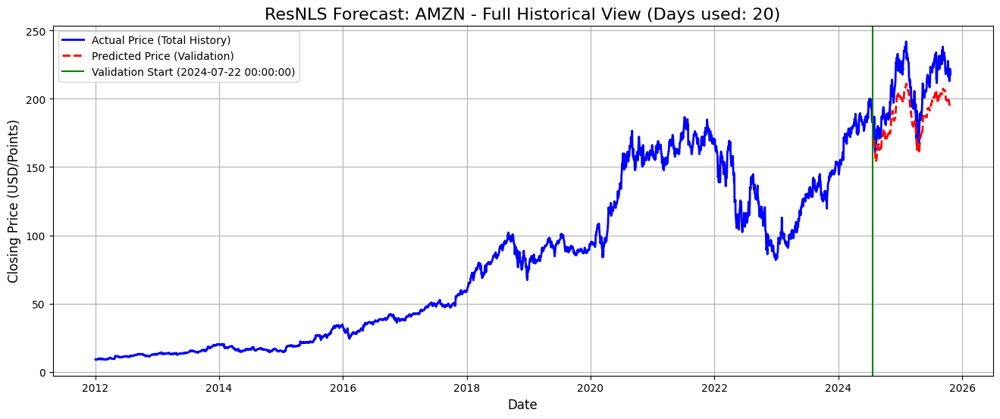

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


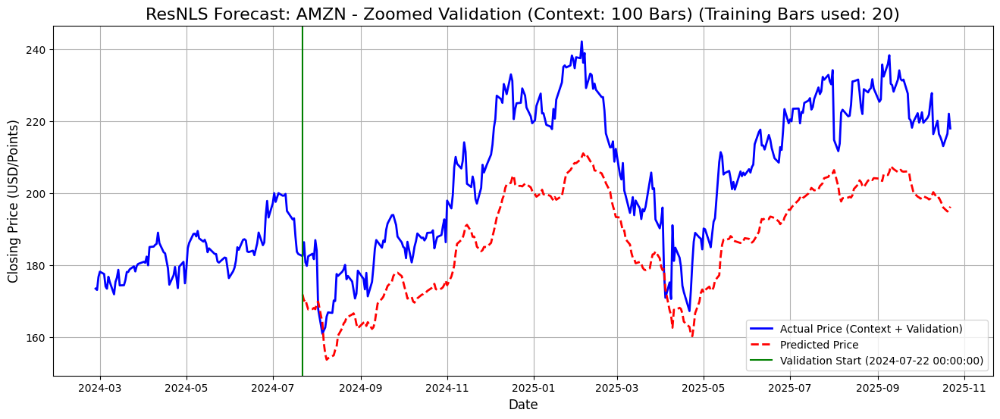

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

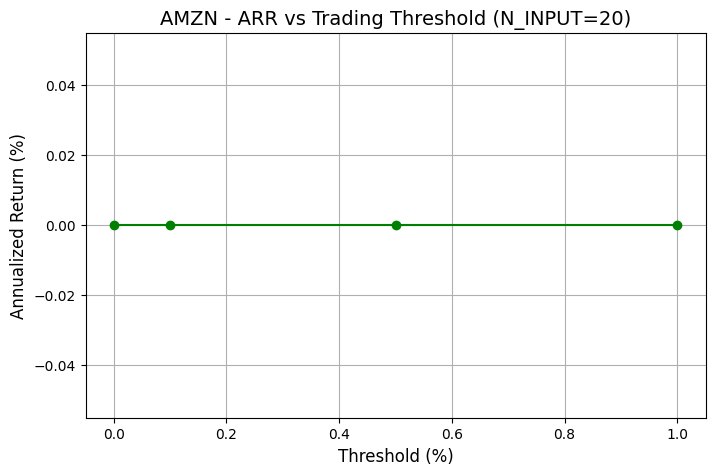

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on t

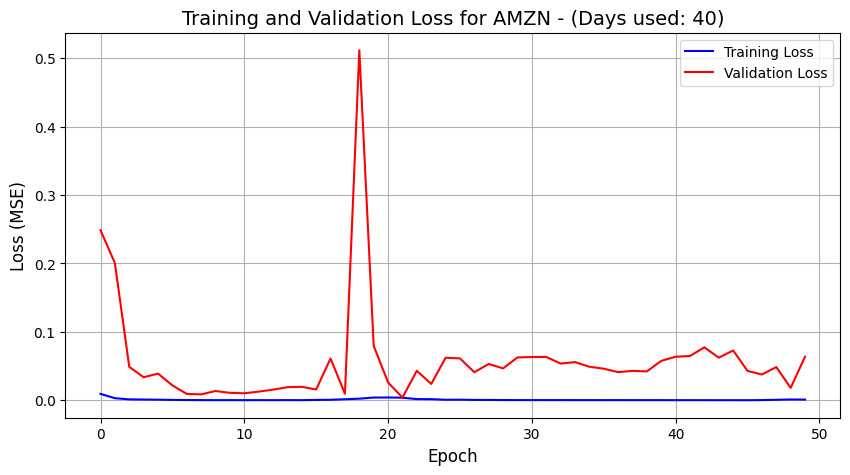

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  43.0764
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  2334.271184
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 48.3143
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 20.55%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


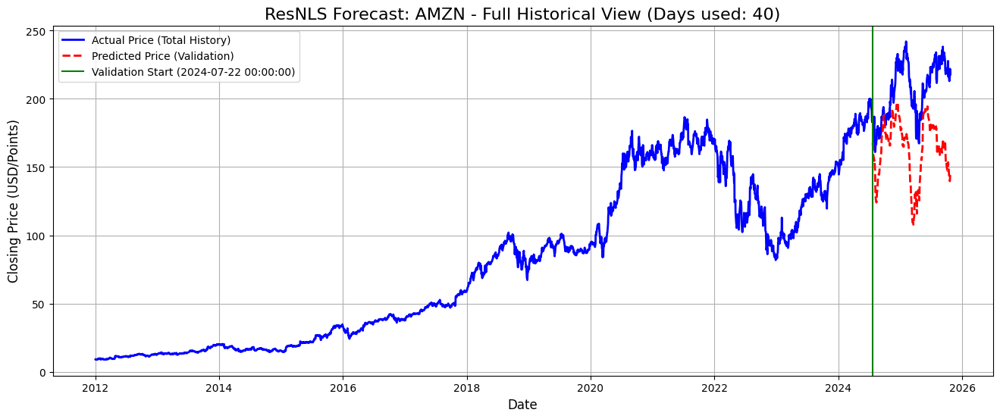

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


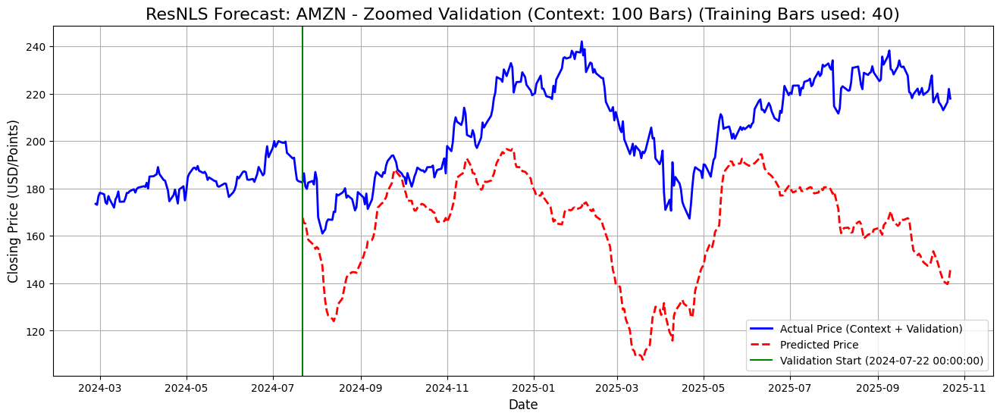

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

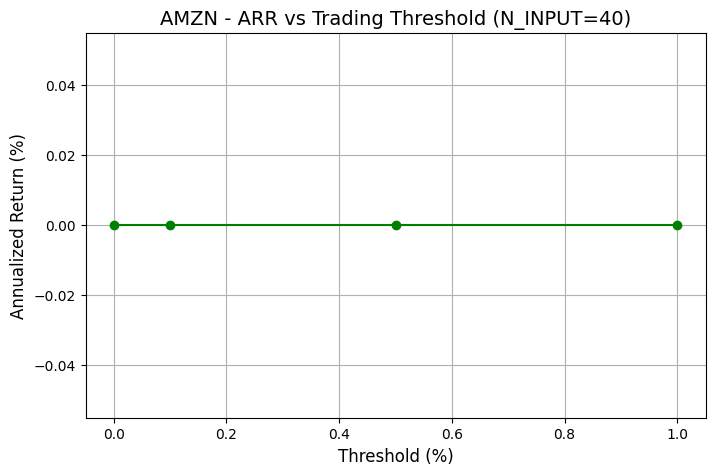

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: AMZN (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for AMZN (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for AMZN...
⚖️ Scaler fitted on t

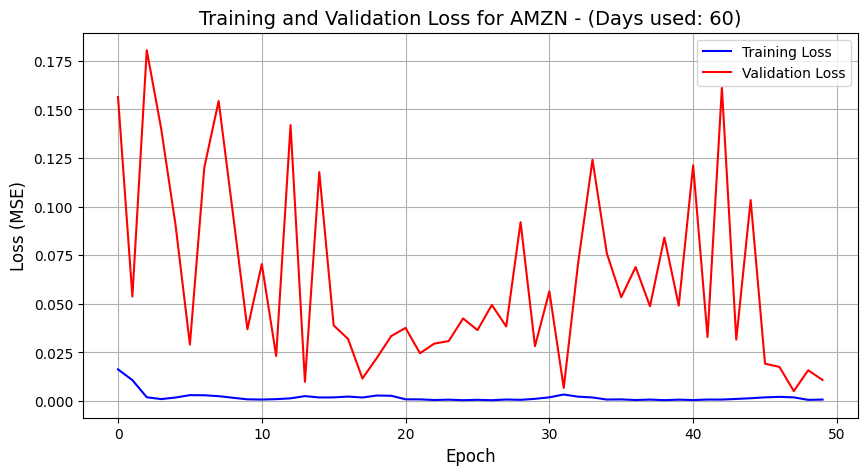

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: AMZN
     📏 MAE:  17.6025
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  397.499978
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 19.9374
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 8.17%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


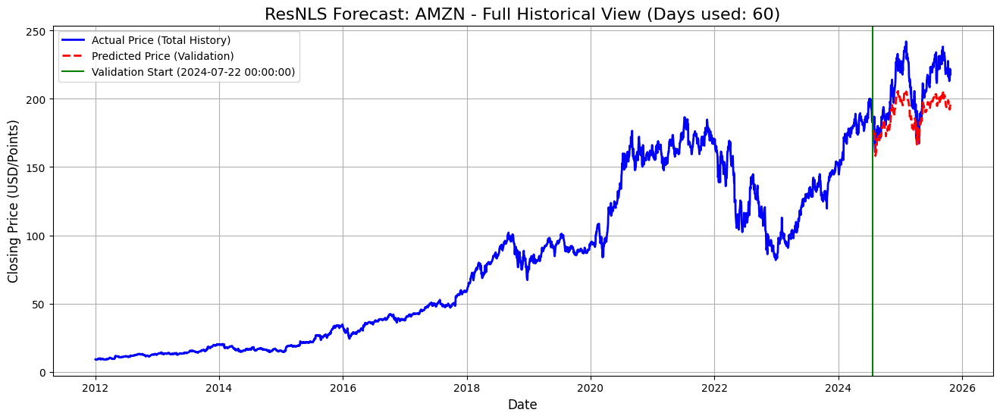

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


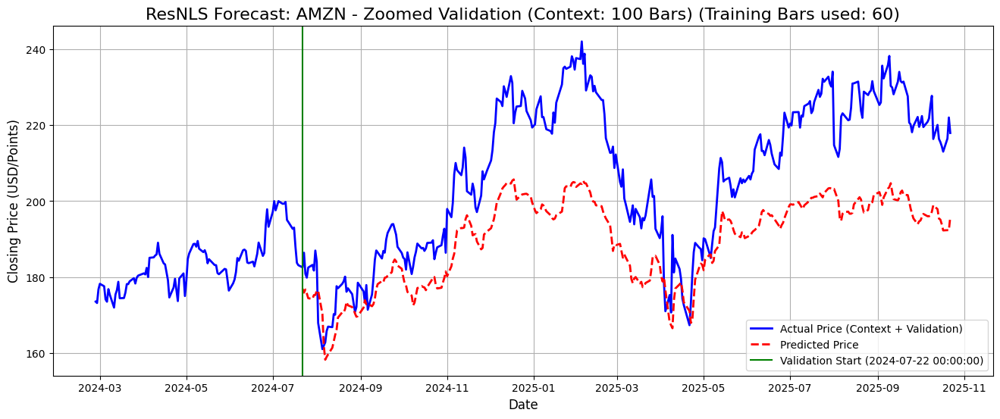

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 14.89% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-08-05 00:00: BUY @ 154.21 (Pred. Ret: 1.41%)
👋 2024-08-07 00:00: SELL @ 166.55 (Pred. Ret: -2.28%)
🛒 2024-09-09 00:00: BUY @ 174.53 (Pred. Ret: 0.54%)
👋 2024-09-10 00:00: SELL @ 177.49 (Pred. Ret: -1.44%)
🛒 2025-04-22 00:00: BUY @ 169.85 (Pred. Ret: 0.36%)
👋 2025-04-23 00:00: SELL @ 183.45 (Pred. Ret: -2.66%)
✅ Threshold None (0.00%) → ARR: 14.59%, Total Return: 18.63%, Buys: 3
🚀 Running backtest for threshold = 0.10%
🛒 2024-08-05 00:00: BUY @ 154.21 (Pred. Ret: 1.41%)
👋 2024-08-07 00:00: SELL @ 166.55 (Pred. Ret: -2.28%)
🛒 2024-09-09 00:00: BUY @ 174.53 (Pred. Ret: 0.54%)
👋 2024-09-10 00:00: SELL @ 177.49 (Pred. Ret: -1.44%)
🛒 2025-04-22 00:00: BUY @ 169.85 (Pred. Ret: 0.36%)
👋 2025-04-23 00:00: SELL @ 183.45 (Pred. Ret: -2.66%)
✅ Threshold 0.10% → ARR: 14.59%, Total Return: 18.63%, Bu

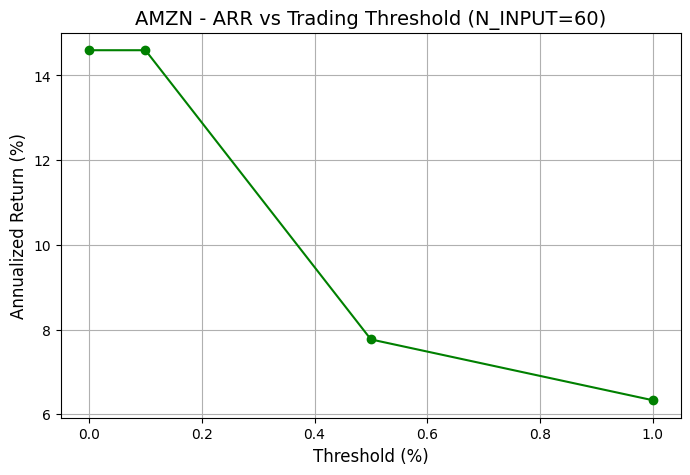

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for AMZN.


In [14]:
all_n_forecasts('AMZN')

# MICROSOFT

🔥 Starting all N-input forecast experiments for Ticker: MSFT...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on trainin

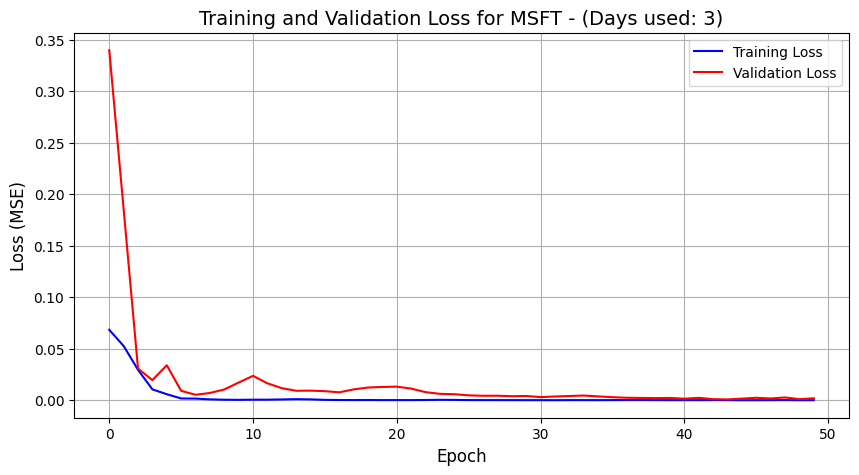

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  17.0741
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  387.088151
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 19.6746
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 3.79%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


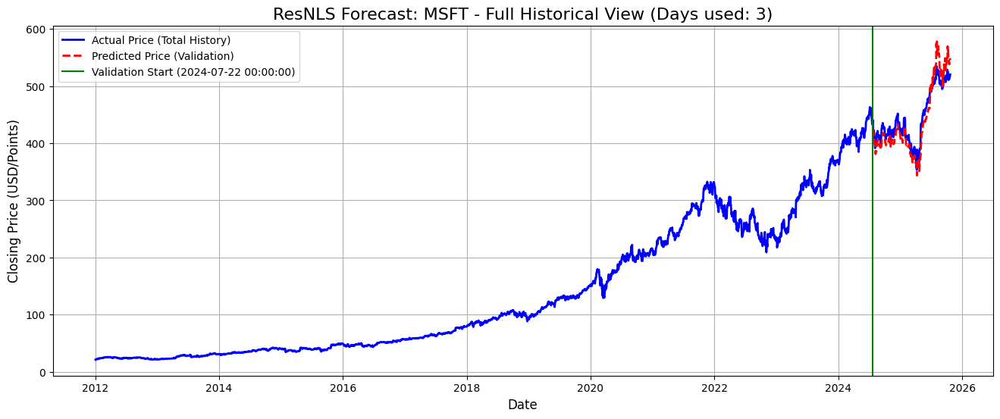

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


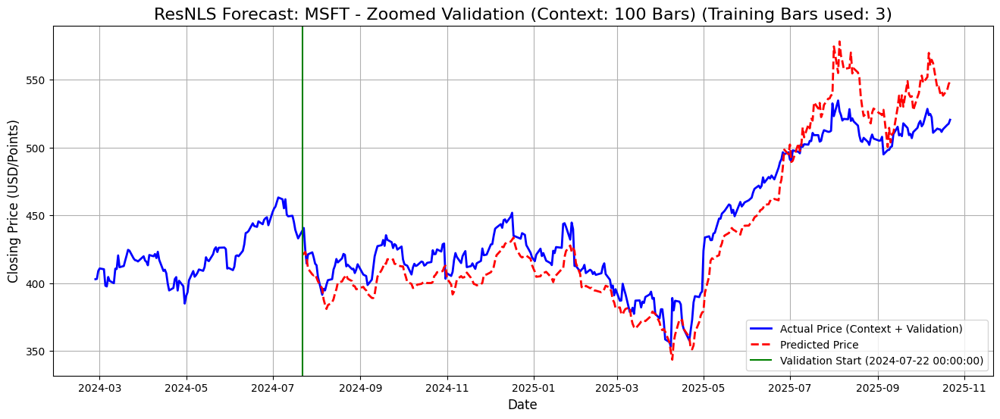

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-11-01 00:00: BUY @ 405.96 (Pred. Ret: 0.09%)
👋 2024-11-04 00:00: SELL @ 406.75 (Pred. Ret: -2.03%)
🛒 2025-01-31 00:00: BUY @ 416.69 (Pred. Ret: 0.53%)
👋 2025-02-03 00:00: SELL @ 409.35 (Pred. Ret: -1.46%)
🛒 2025-06-27 00:00: BUY @ 496.73 (Pred. Ret: 0.38%)
👋 2025-06-30 00:00: SELL @ 496.22 (Pred. Ret: -0.01%)
🛒 2025-07-01 00:00: BUY @ 495.66 (Pred. Ret: 1.14%)
👋 2025-07-02 00:00: SELL @ 489.19 (Pred. Ret: -0.37%)
🛒 2025-07-03 00:00: BUY @ 493.00 (Pred. Ret: 0.01%)
🔚 Last Bar: Close Out @ 520.54
✅ Threshold None (0.00%) → ARR: 1.96%, Total Return: 2.47%, Buys: 5
🚀 Running backtest for threshold = 0.10%
🛒 2025-01-31 00:00: BUY @ 416.69 (Pred. Ret: 0.53%)
👋 2025-02-03 00:00: SELL @ 409.35 (Pred. Ret: -1.46%)
🛒 2025-06-27 00:00: BUY @ 496.73 (Pred. Ret: 0.38%)
👋 2025-07-02 00:00: SELL @ 489

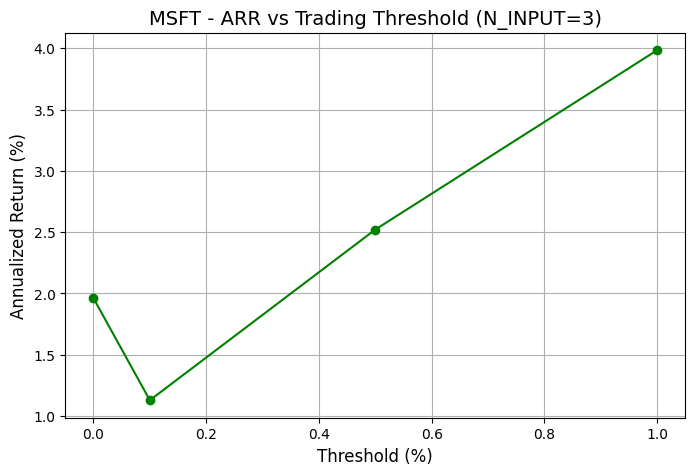

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on train

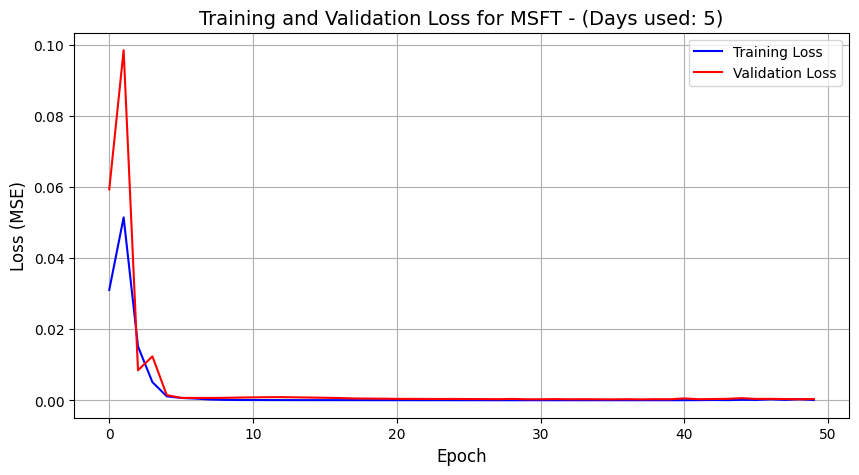

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  6.9589
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  78.319727
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 8.8498
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 1.60%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


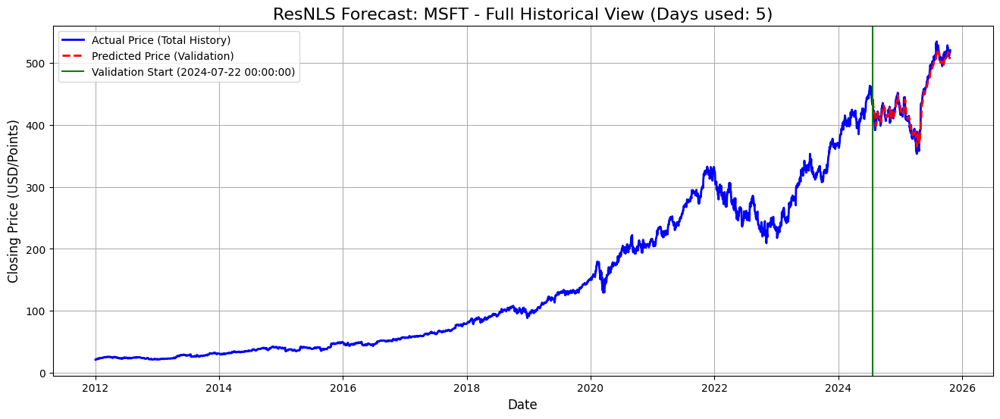

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


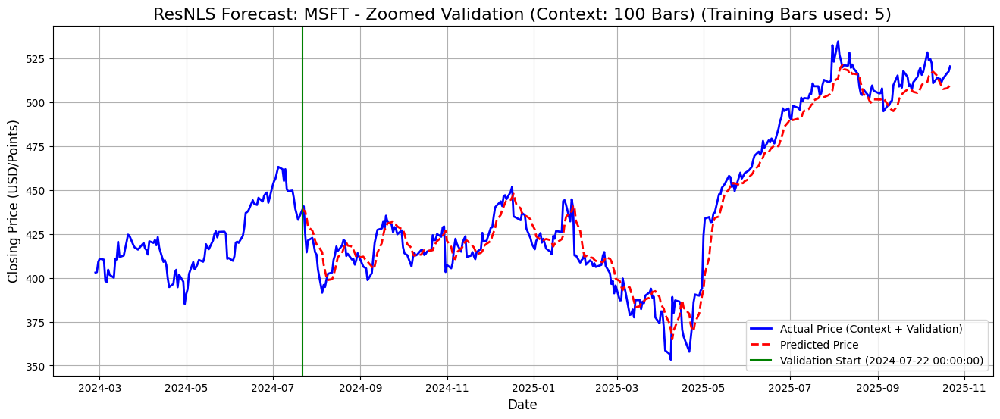

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 437.71 (Pred. Ret: 1.47%)
👋 2024-07-23 00:00: SELL @ 439.80 (Pred. Ret: -0.16%)
🛒 2024-07-25 00:00: BUY @ 424.84 (Pred. Ret: 2.19%)
👋 2024-08-09 00:00: SELL @ 400.30 (Pred. Ret: -0.06%)
🛒 2024-08-23 00:00: BUY @ 413.87 (Pred. Ret: 1.45%)
👋 2024-09-03 00:00: SELL @ 414.80 (Pred. Ret: -0.47%)
🛒 2024-09-04 00:00: BUY @ 402.89 (Pred. Ret: 1.09%)
👋 2024-09-11 00:00: SELL @ 412.40 (Pred. Ret: -1.09%)
🛒 2024-09-19 00:00: BUY @ 437.94 (Pred. Ret: 0.23%)
👋 2024-09-20 00:00: SELL @ 433.96 (Pred. Ret: -1.01%)
🛒 2024-09-24 00:00: BUY @ 429.77 (Pred. Ret: 0.34%)
👋 2024-10-10 00:00: SELL @ 412.14 (Pred. Ret: -0.30%)
🛒 2024-10-11 00:00: BUY @ 413.04 (Pred. Ret: 0.06%)
👋 2024-10-15 00:00: SELL @ 419.03 (Pred. Ret: -0.25%)
🛒 2024-10-16 00:00: BUY @ 412.08 (Pred. Ret: 0.01%)
👋 2024-10-

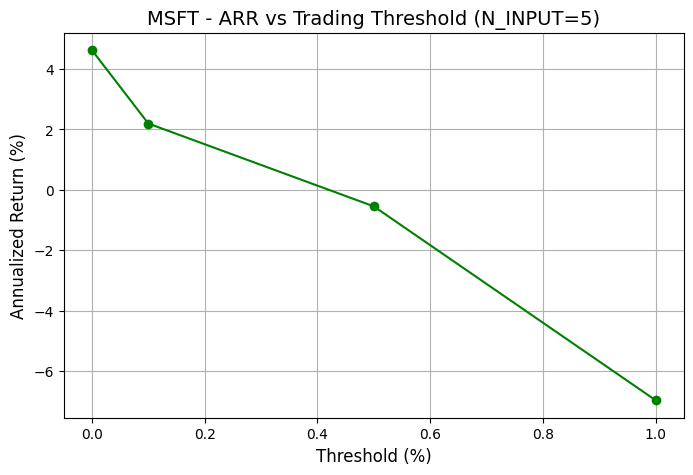

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on tr

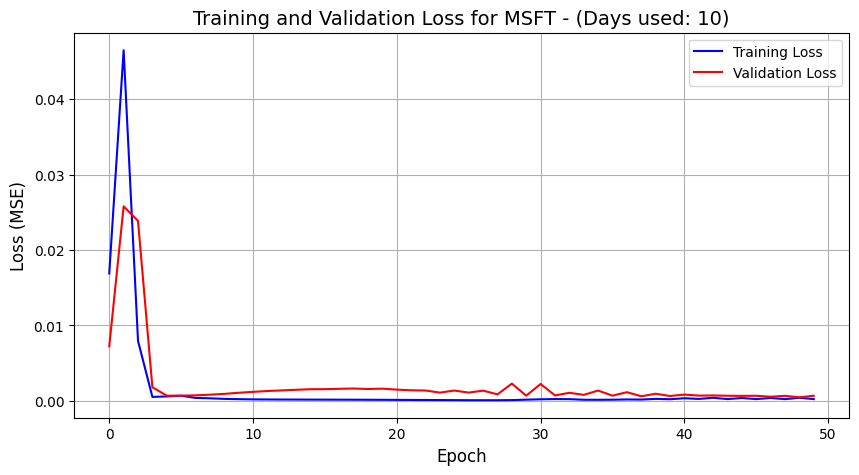

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  9.1952
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  133.222298
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 11.5422
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.15%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


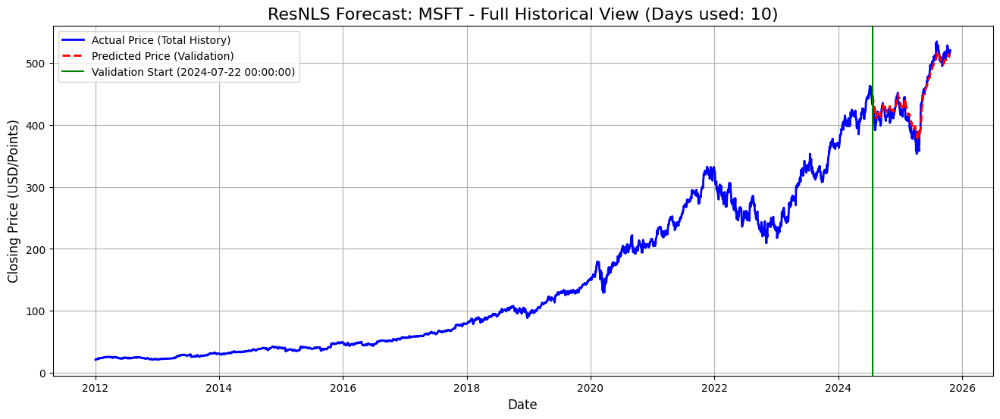

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


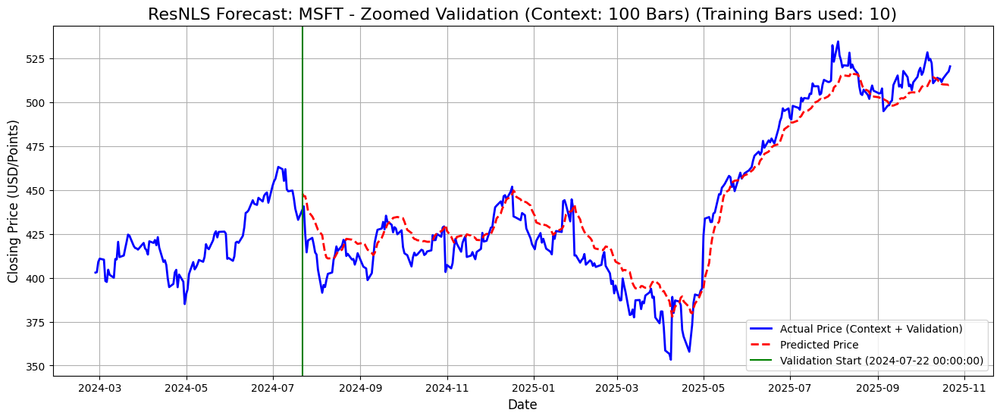

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 437.71 (Pred. Ret: 3.45%)
👋 2024-08-16 00:00: SELL @ 417.47 (Pred. Ret: -0.71%)
🛒 2024-08-19 00:00: BUY @ 415.84 (Pred. Ret: 0.17%)
👋 2024-08-20 00:00: SELL @ 418.56 (Pred. Ret: -0.07%)
🛒 2024-08-22 00:00: BUY @ 421.20 (Pred. Ret: 0.30%)
👋 2024-09-12 00:00: SELL @ 420.16 (Pred. Ret: -0.78%)
🛒 2024-09-19 00:00: BUY @ 437.94 (Pred. Ret: 0.21%)
👋 2024-09-20 00:00: SELL @ 433.96 (Pred. Ret: -1.11%)
🛒 2024-09-23 00:00: BUY @ 431.04 (Pred. Ret: 0.20%)
👋 2024-10-23 00:00: SELL @ 427.65 (Pred. Ret: -0.22%)
🛒 2024-10-24 00:00: BUY @ 422.16 (Pred. Ret: 0.75%)
👋 2024-10-30 00:00: SELL @ 434.18 (Pred. Ret: -0.05%)
🛒 2024-10-31 00:00: BUY @ 412.26 (Pred. Ret: 0.20%)
👋 2024-11-27 00:00: SELL @ 422.79 (Pred. Ret: -0.35%)
🛒 2024-11-29 00:00: BUY @ 417.79 (Pred. Ret: 1.03%)
👋 2024-12-

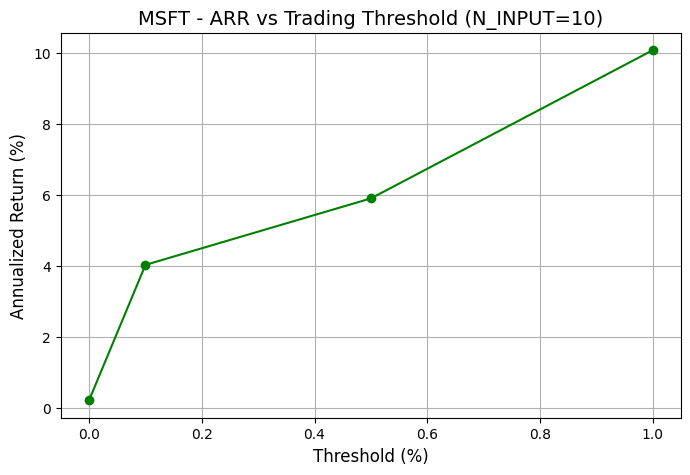

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on t

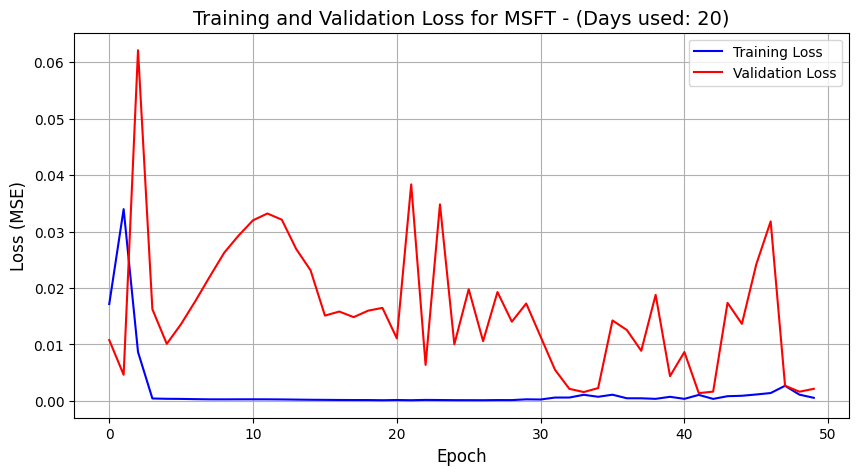

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  16.4270
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  420.151525
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 20.4976
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 3.90%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


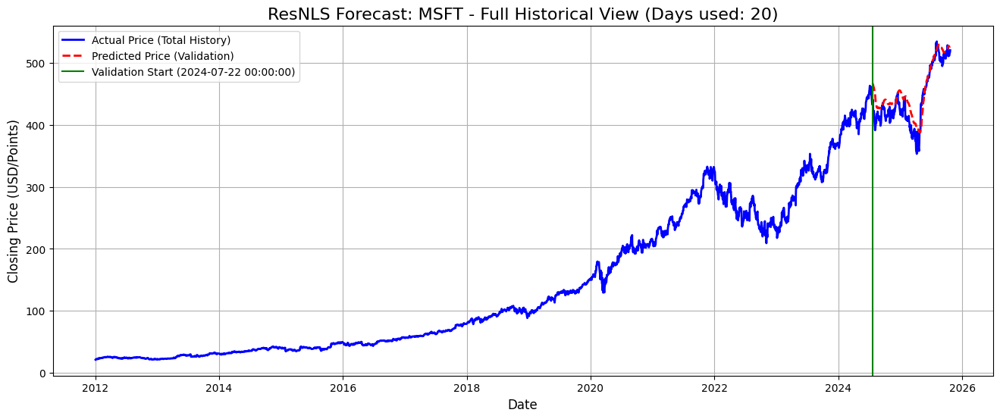

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


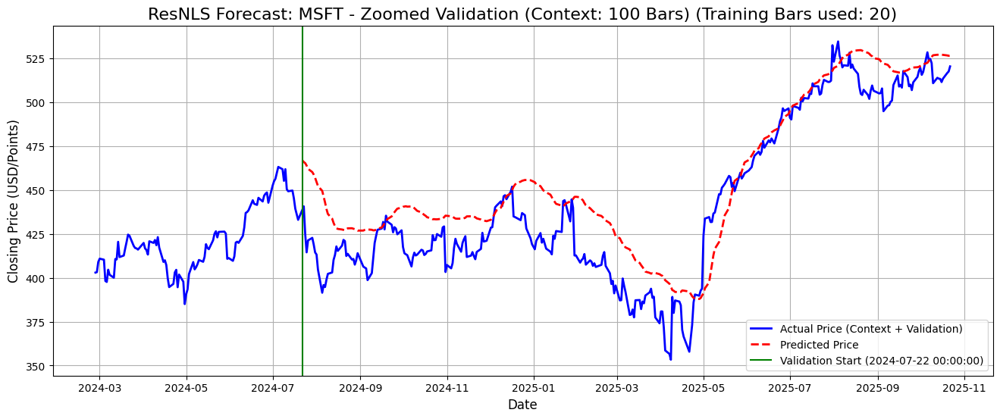

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 437.71 (Pred. Ret: 7.82%)
👋 2024-09-18 00:00: SELL @ 431.76 (Pred. Ret: -0.18%)
🛒 2024-09-19 00:00: BUY @ 437.94 (Pred. Ret: 1.07%)
👋 2024-09-20 00:00: SELL @ 433.96 (Pred. Ret: -0.44%)
🛒 2024-09-23 00:00: BUY @ 431.04 (Pred. Ret: 0.69%)
👋 2024-12-06 00:00: SELL @ 439.88 (Pred. Ret: -0.38%)
🛒 2024-12-11 00:00: BUY @ 441.62 (Pred. Ret: 0.57%)
👋 2024-12-12 00:00: SELL @ 446.66 (Pred. Ret: -0.32%)
🛒 2024-12-16 00:00: BUY @ 444.83 (Pred. Ret: 0.74%)
👋 2024-12-18 00:00: SELL @ 448.85 (Pred. Ret: -0.00%)
🛒 2024-12-19 00:00: BUY @ 439.21 (Pred. Ret: 4.16%)
👋 2025-01-23 00:00: SELL @ 439.58 (Pred. Ret: -0.50%)
🛒 2025-01-27 00:00: BUY @ 421.69 (Pred. Ret: 0.43%)
👋 2025-04-28 00:00: SELL @ 390.60 (Pred. Ret: -0.65%)
🛒 2025-05-22 00:00: BUY @ 454.20 (Pred. Ret: 0.09%)
👋 2025-06-

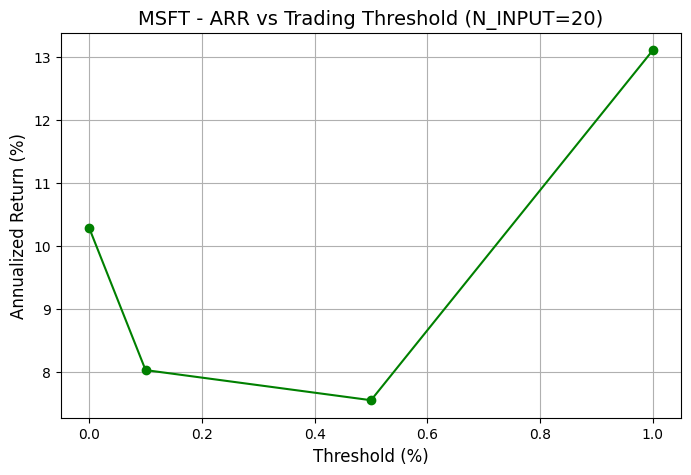

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on t

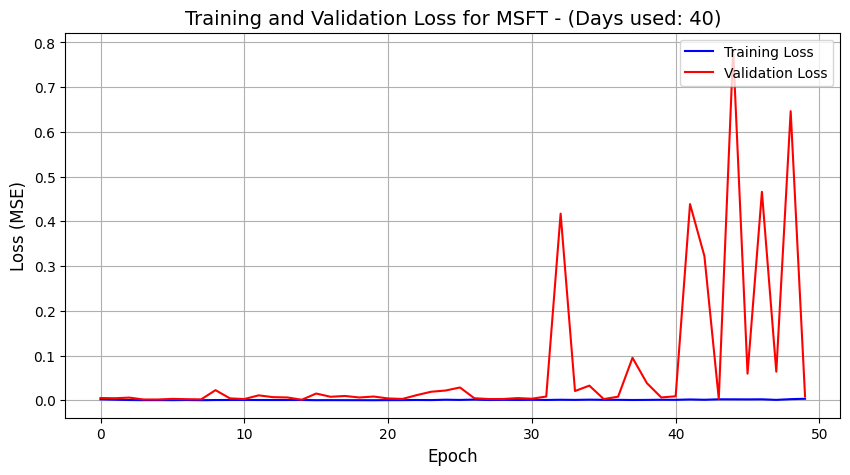

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  30.7099
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  1685.738293
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 41.0577
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 6.50%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


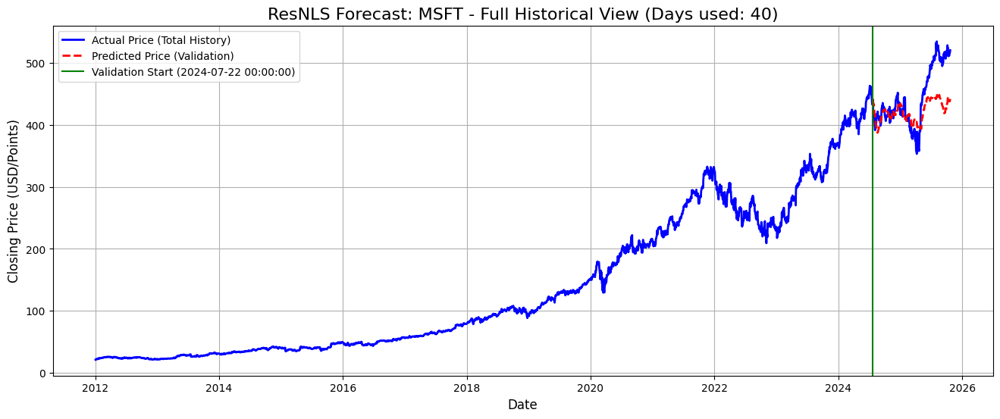

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


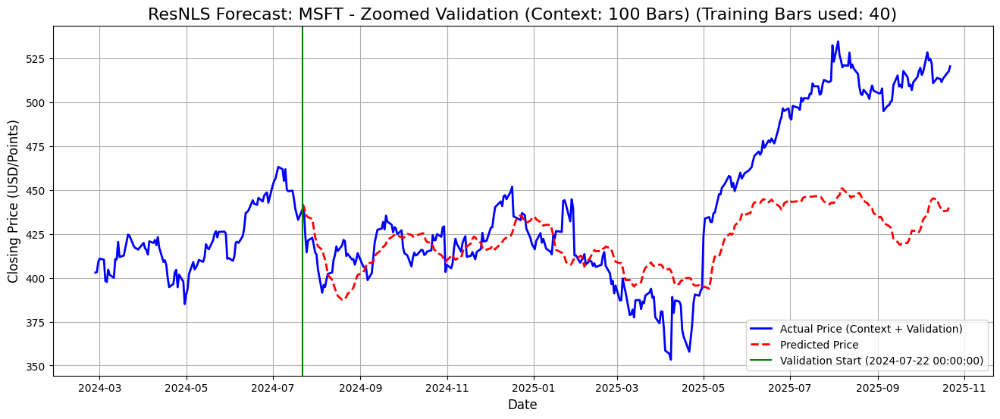

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 437.71 (Pred. Ret: 2.10%)
👋 2024-07-24 00:00: SELL @ 436.38 (Pred. Ret: -0.61%)
🛒 2024-07-25 00:00: BUY @ 424.84 (Pred. Ret: 2.41%)
👋 2024-08-12 00:00: SELL @ 403.30 (Pred. Ret: -0.87%)
🛒 2024-09-05 00:00: BUY @ 404.58 (Pred. Ret: 0.26%)
👋 2024-09-12 00:00: SELL @ 420.16 (Pred. Ret: -1.53%)
🛒 2024-10-02 00:00: BUY @ 419.43 (Pred. Ret: 1.33%)
👋 2024-10-23 00:00: SELL @ 427.65 (Pred. Ret: -1.93%)
🛒 2024-11-01 00:00: BUY @ 405.96 (Pred. Ret: 1.68%)
👋 2024-11-07 00:00: SELL @ 418.14 (Pred. Ret: -1.62%)
🛒 2024-11-18 00:00: BUY @ 411.78 (Pred. Ret: 1.89%)
👋 2024-11-27 00:00: SELL @ 422.79 (Pred. Ret: -2.29%)
🛒 2024-12-23 00:00: BUY @ 434.35 (Pred. Ret: 0.33%)
👋 2024-12-26 00:00: SELL @ 436.68 (Pred. Ret: -1.14%)
🛒 2024-12-30 00:00: BUY @ 423.73 (Pred. Ret: 1.04%)
👋 2025-01-

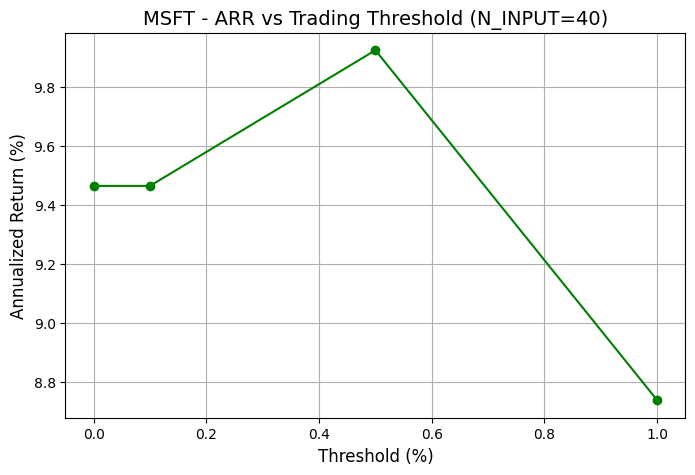

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: MSFT (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for MSFT (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for MSFT...
⚖️ Scaler fitted on t

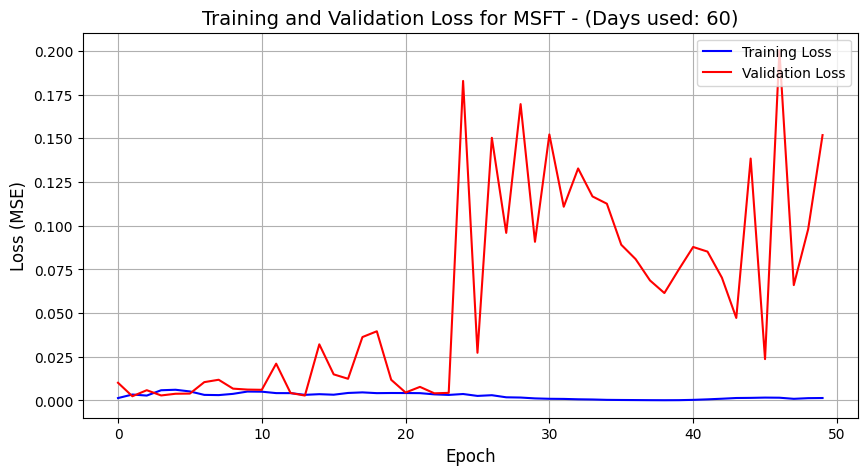

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: MSFT
     📏 MAE:  164.6654
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  29701.551664
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 172.3414
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 37.19%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


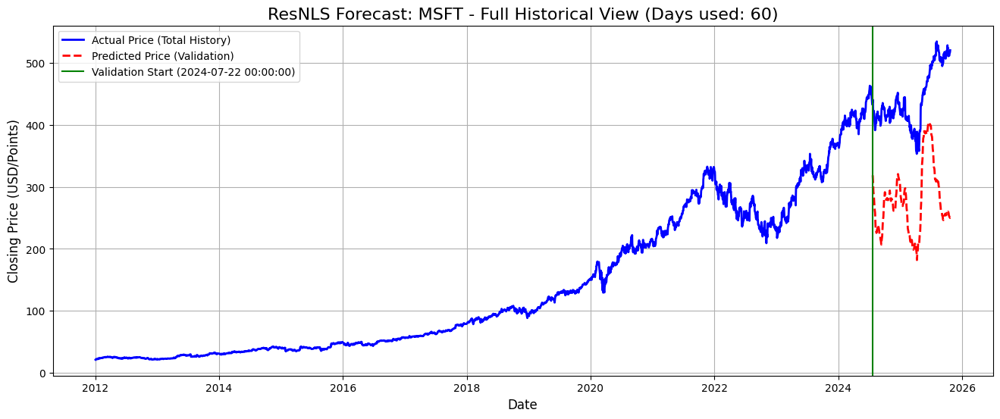

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


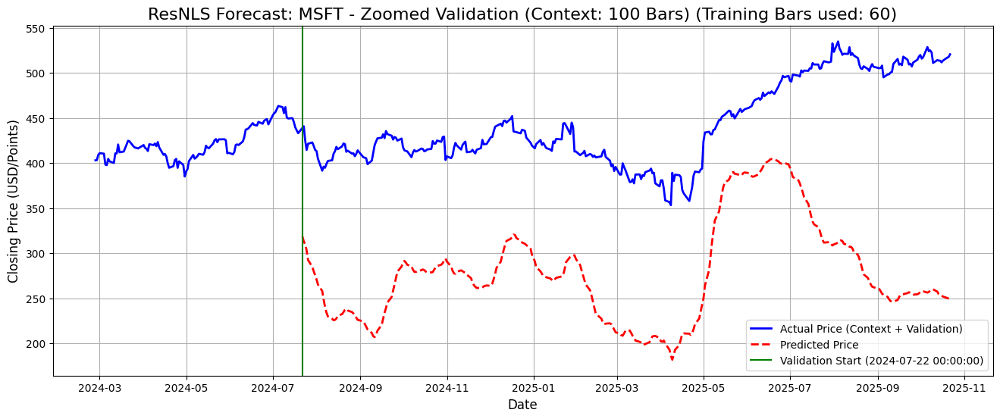

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.80% over 316 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

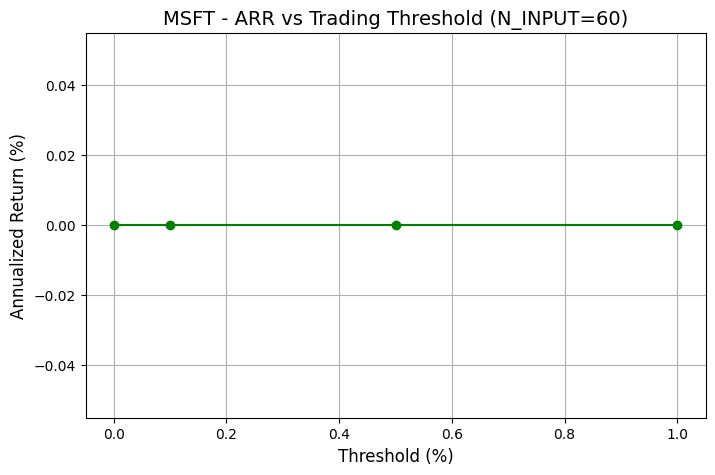

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for MSFT.


In [15]:
all_n_forecasts('MSFT')

# EURUSD

🔥 Starting all N-input forecast experiments for Ticker: EURUSD=X...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler f

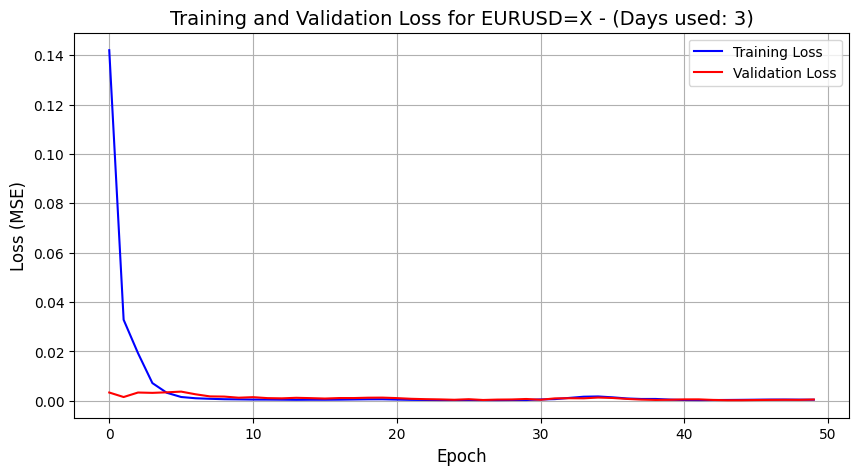

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0077
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000096
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0098
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.68%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


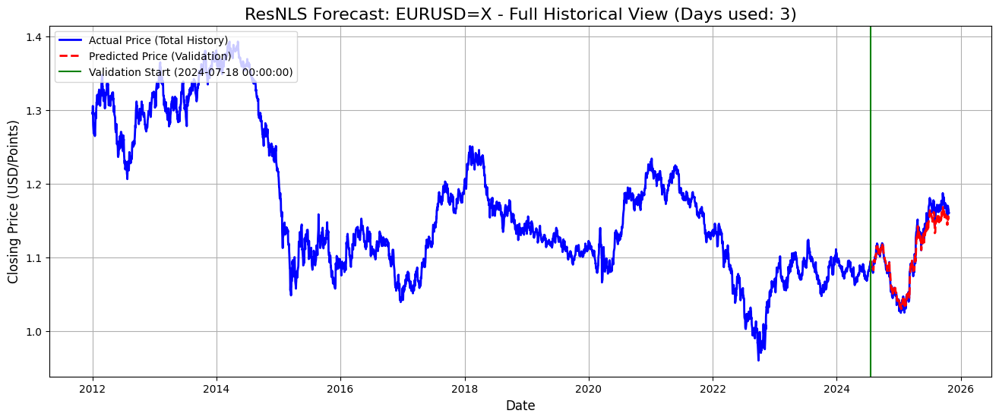

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


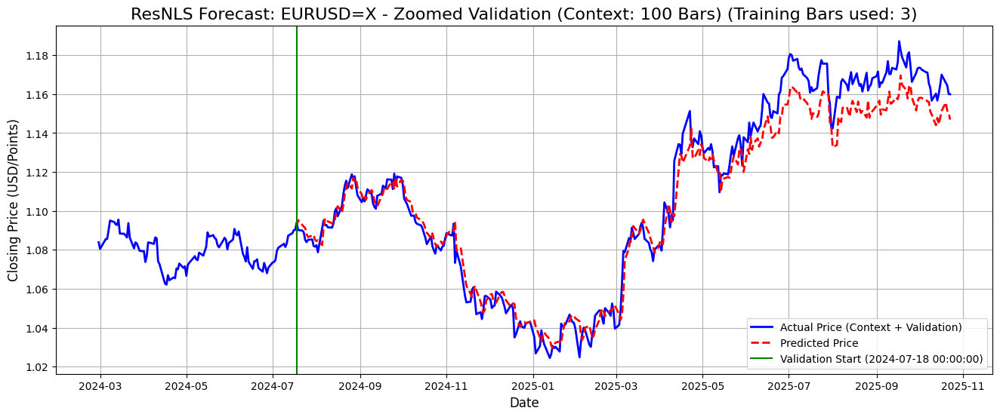

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.88% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.09 (Pred. Ret: 0.19%)
👋 2024-08-06 00:00: SELL @ 1.10 (Pred. Ret: -0.02%)
🛒 2024-08-07 00:00: BUY @ 1.09 (Pred. Ret: 0.10%)
👋 2024-08-21 00:00: SELL @ 1.11 (Pred. Ret: -0.03%)
🛒 2024-09-02 00:00: BUY @ 1.10 (Pred. Ret: 0.04%)
👋 2024-09-09 00:00: SELL @ 1.11 (Pred. Ret: -0.04%)
🛒 2024-09-10 00:00: BUY @ 1.10 (Pred. Ret: 0.02%)
👋 2024-09-16 00:00: SELL @ 1.11 (Pred. Ret: -0.02%)
🛒 2024-09-17 00:00: BUY @ 1.11 (Pred. Ret: 0.00%)
👋 2024-09-18 00:00: SELL @ 1.11 (Pred. Ret: -0.07%)
🛒 2024-10-03 00:00: BUY @ 1.10 (Pred. Ret: 0.08%)
👋 2024-11-20 00:00: SELL @ 1.06 (Pred. Ret: -0.06%)
🛒 2024-11-21 00:00: BUY @ 1.05 (Pred. Ret: 0.08%)
👋 2024-11-28 00:00: SELL @ 1.06 (Pred. Ret: -0.01%)
🛒 2024-12-02 00:00: BUY @ 1.05 (Pred. Ret: 0.07%)
👋 2024-12-09 00:00: SELL @ 1.06 (Pred. Re

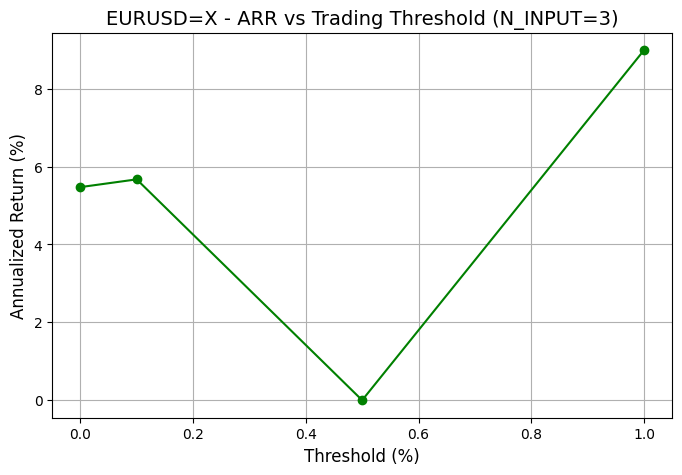

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler fit

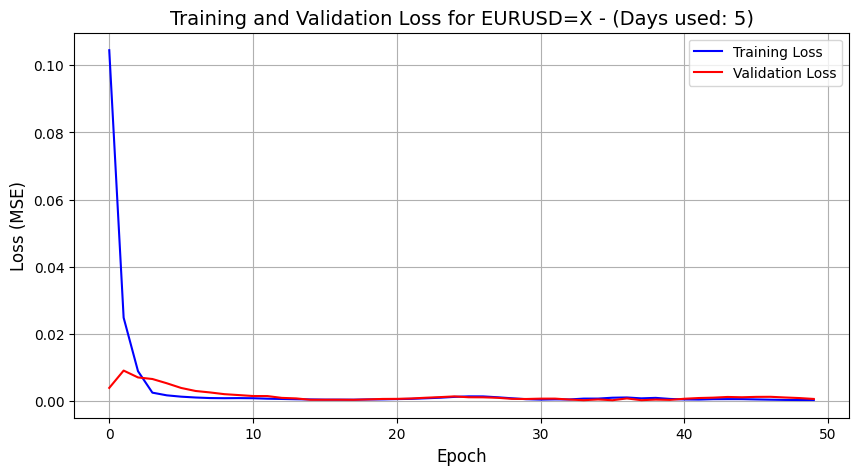

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0083
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000108
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0104
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.74%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


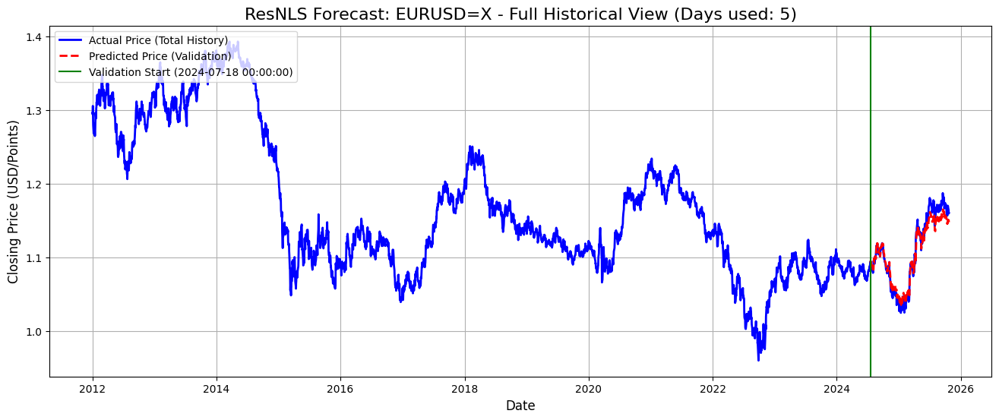

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


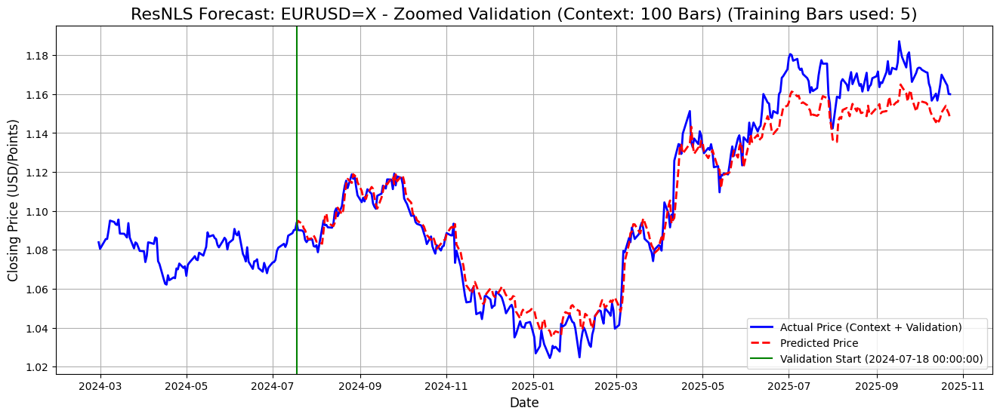

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.88% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.09 (Pred. Ret: 0.24%)
👋 2024-08-06 00:00: SELL @ 1.10 (Pred. Ret: -0.14%)
🛒 2024-08-07 00:00: BUY @ 1.09 (Pred. Ret: 0.19%)
👋 2024-08-15 00:00: SELL @ 1.10 (Pred. Ret: -0.05%)
🛒 2024-08-16 00:00: BUY @ 1.10 (Pred. Ret: 0.03%)
👋 2024-08-20 00:00: SELL @ 1.11 (Pred. Ret: -0.17%)
🛒 2024-08-22 00:00: BUY @ 1.12 (Pred. Ret: 0.10%)
👋 2024-09-16 00:00: SELL @ 1.11 (Pred. Ret: -0.08%)
🛒 2024-09-17 00:00: BUY @ 1.11 (Pred. Ret: 0.11%)
👋 2024-09-26 00:00: SELL @ 1.11 (Pred. Ret: -0.03%)
🛒 2024-09-27 00:00: BUY @ 1.12 (Pred. Ret: 0.19%)
👋 2024-10-09 00:00: SELL @ 1.10 (Pred. Ret: -0.04%)
🛒 2024-10-11 00:00: BUY @ 1.09 (Pred. Ret: 0.08%)
👋 2024-10-14 00:00: SELL @ 1.09 (Pred. Ret: -0.00%)
🛒 2024-10-15 00:00: BUY @ 1.09 (Pred. Ret: 0.03%)
👋 2024-10-22 00:00: SELL @ 1.08 (Pred. Re

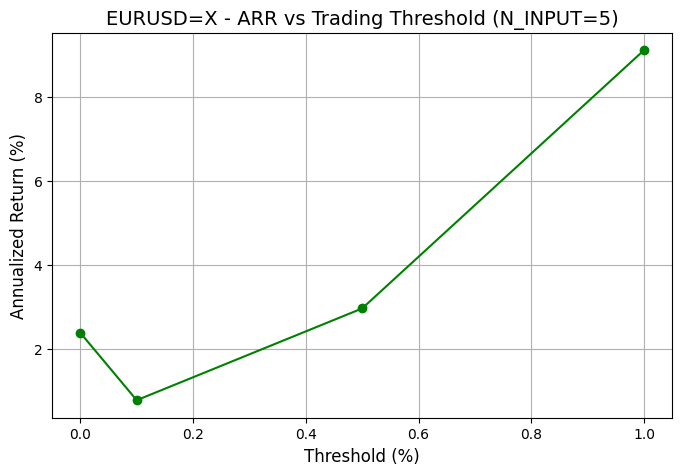

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler 

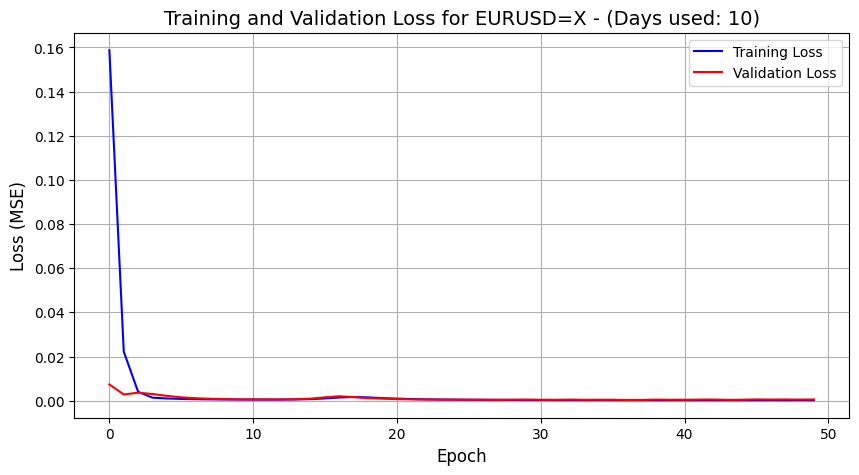

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0084
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000104
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0102
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.75%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


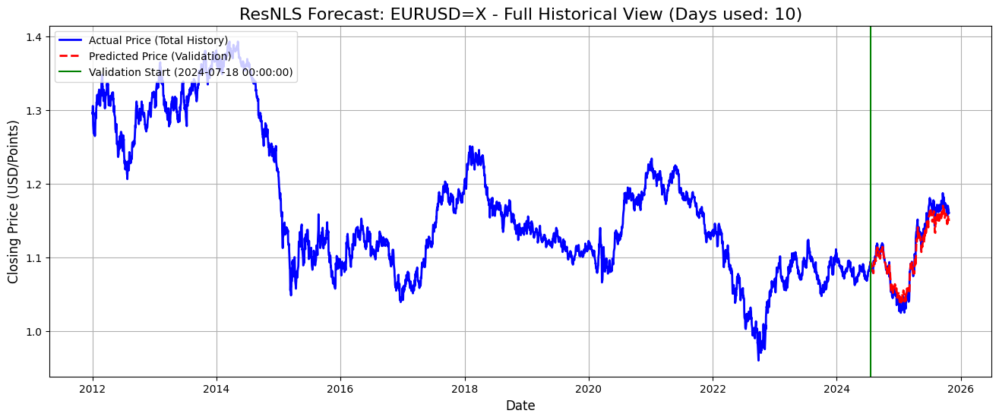

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


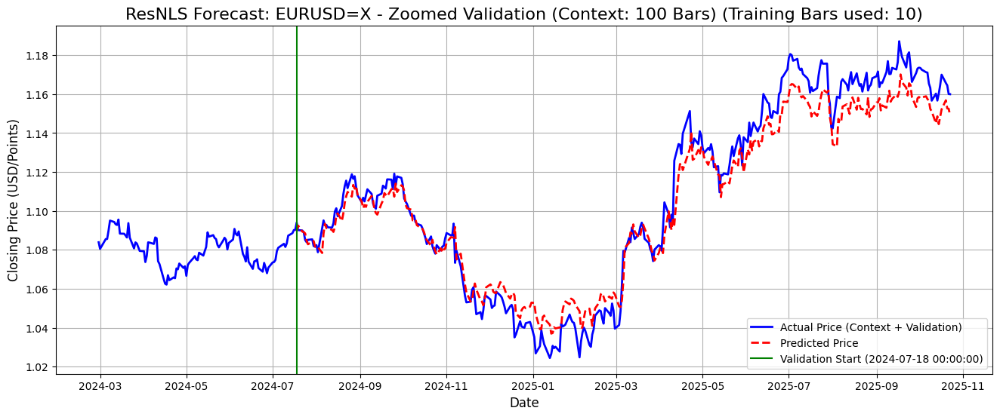

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.88% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-11-08 00:00: BUY @ 1.08 (Pred. Ret: 0.16%)
👋 2024-11-11 00:00: SELL @ 1.07 (Pred. Ret: -0.14%)
🛒 2024-11-12 00:00: BUY @ 1.07 (Pred. Ret: 0.10%)
👋 2024-11-20 00:00: SELL @ 1.06 (Pred. Ret: -0.06%)
🛒 2024-11-21 00:00: BUY @ 1.05 (Pred. Ret: 0.18%)
👋 2025-03-18 00:00: SELL @ 1.09 (Pred. Ret: -0.06%)
🛒 2025-03-24 00:00: BUY @ 1.08 (Pred. Ret: 0.00%)
👋 2025-03-25 00:00: SELL @ 1.08 (Pred. Ret: -0.07%)
🛒 2025-03-28 00:00: BUY @ 1.08 (Pred. Ret: 0.03%)
👋 2025-03-31 00:00: SELL @ 1.08 (Pred. Ret: -0.17%)
✅ Threshold None (0.00%) → ARR: 1.63%, Total Return: 2.13%, Buys: 5
🚀 Running backtest for threshold = 0.10%
🛒 2024-11-08 00:00: BUY @ 1.08 (Pred. Ret: 0.16%)
👋 2024-11-11 00:00: SELL @ 1.07 (Pred. Ret: -0.14%)
🛒 2024-11-12 00:00: BUY @ 1.07 (Pred. Ret: 0.10%)
👋 2025-03-31 00:00: SELL @ 1.08 (P

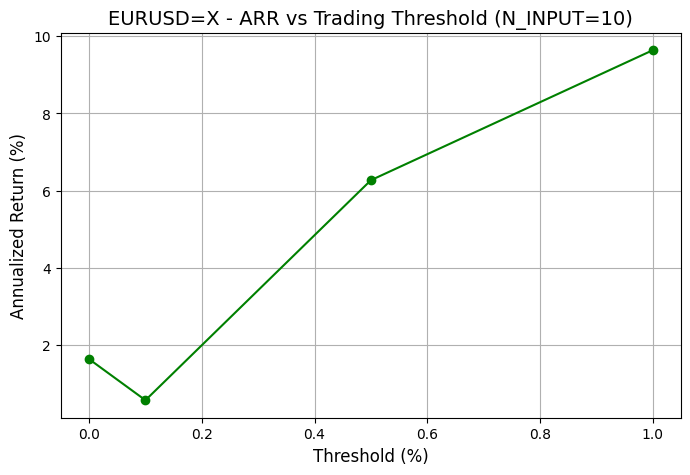

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler

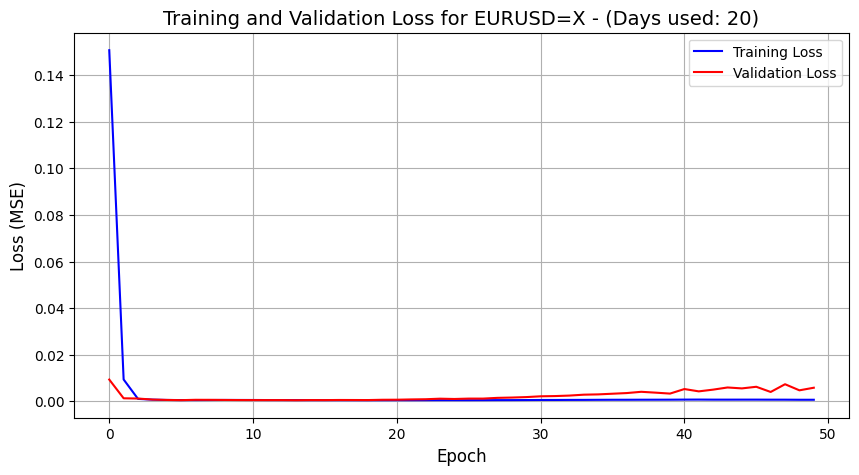

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0257
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.001096
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0331
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.25%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


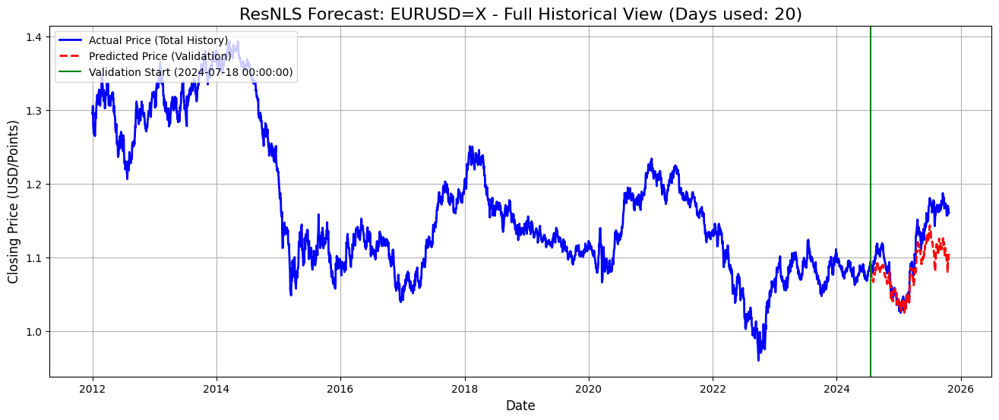

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


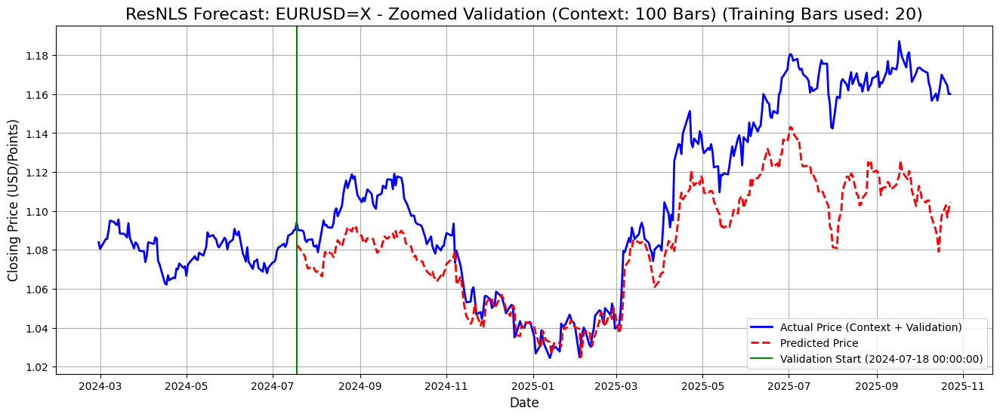

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.89% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-12-03 00:00: BUY @ 1.05 (Pred. Ret: 0.01%)
👋 2024-12-05 00:00: SELL @ 1.05 (Pred. Ret: -0.10%)
🛒 2024-12-10 00:00: BUY @ 1.06 (Pred. Ret: 0.03%)
👋 2024-12-11 00:00: SELL @ 1.05 (Pred. Ret: -0.04%)
🛒 2024-12-20 00:00: BUY @ 1.04 (Pred. Ret: 0.10%)
👋 2024-12-23 00:00: SELL @ 1.04 (Pred. Ret: -0.07%)
🛒 2024-12-26 00:00: BUY @ 1.04 (Pred. Ret: 0.10%)
👋 2024-12-30 00:00: SELL @ 1.04 (Pred. Ret: -0.01%)
🛒 2025-01-03 00:00: BUY @ 1.03 (Pred. Ret: 0.18%)
👋 2025-01-08 00:00: SELL @ 1.03 (Pred. Ret: -0.03%)
🛒 2025-01-09 00:00: BUY @ 1.03 (Pred. Ret: 0.20%)
👋 2025-01-22 00:00: SELL @ 1.04 (Pred. Ret: -0.43%)
🛒 2025-01-27 00:00: BUY @ 1.05 (Pred. Ret: 0.01%)
👋 2025-01-28 00:00: SELL @ 1.04 (Pred. Ret: -0.26%)
🛒 2025-02-04 00:00: BUY @ 1.03 (Pred. Ret: 0.02%)
👋 2025-02-05 00:00: SELL @ 1.04 (Pred. Re

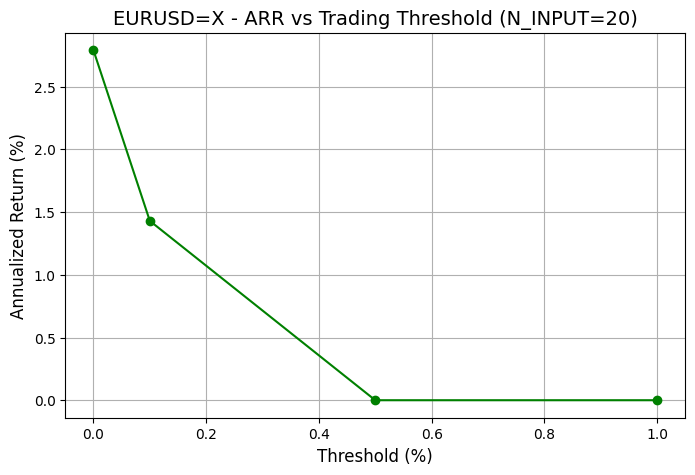

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler

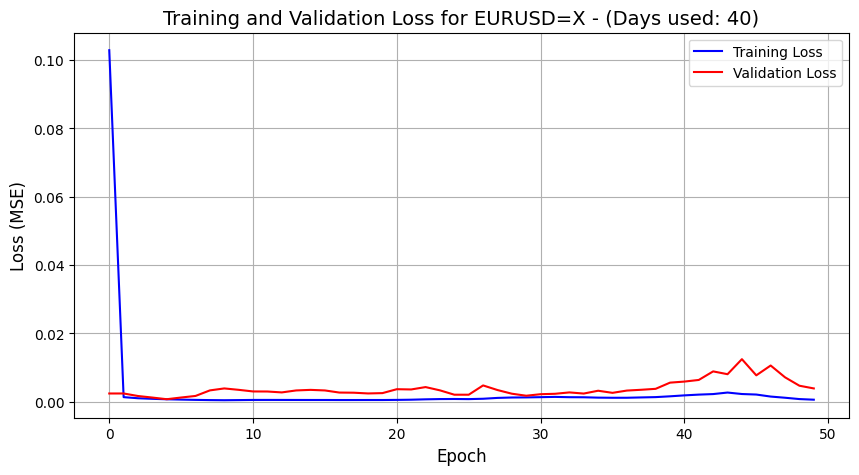

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0239
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000737
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0272
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.19%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


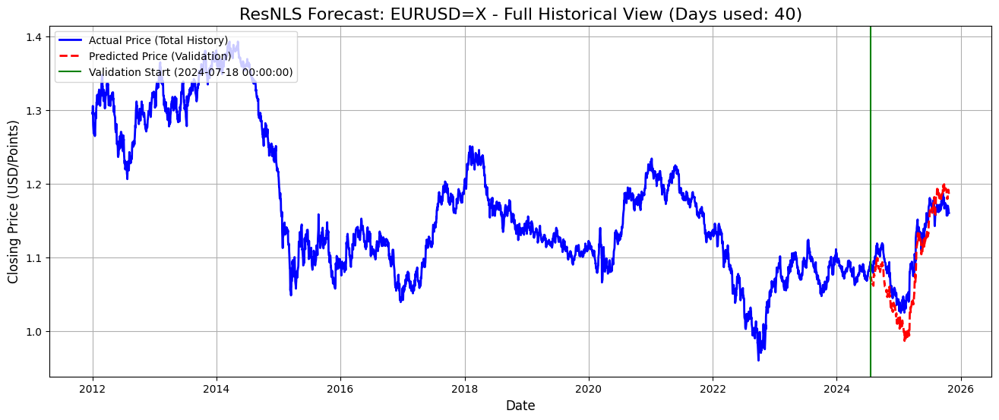

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


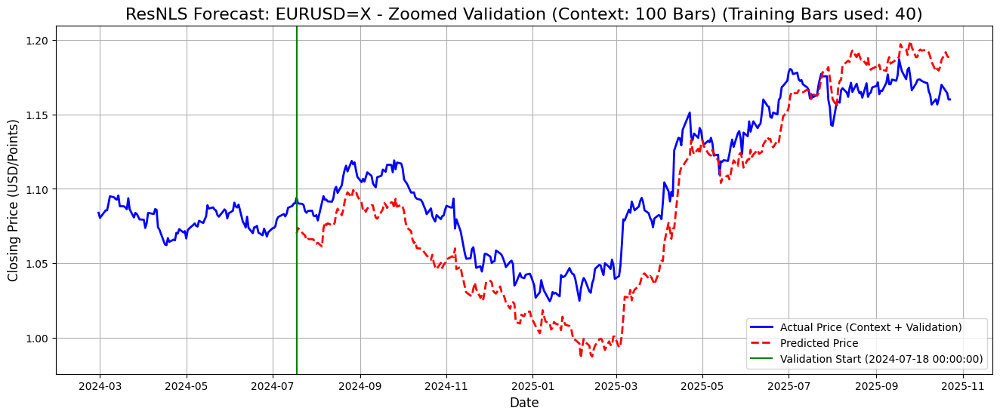

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.89% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-07-21 00:00: BUY @ 1.16 (Pred. Ret: 0.09%)
👋 2025-07-23 00:00: SELL @ 1.17 (Pred. Ret: -0.06%)
🛒 2025-07-24 00:00: BUY @ 1.18 (Pred. Ret: 0.03%)
🔚 Last Bar: Close Out @ 1.16
✅ Threshold None (0.00%) → ARR: -0.43%, Total Return: -0.55%, Buys: 2
🚀 Running backtest for threshold = 0.10%
🛒 2025-07-28 00:00: BUY @ 1.18 (Pred. Ret: 0.36%)
🔚 Last Bar: Close Out @ 1.16
✅ Threshold 0.10% → ARR: -1.02%, Total Return: -1.33%, Buys: 1
🚀 Running backtest for threshold = 0.50%
🛒 2025-07-29 00:00: BUY @ 1.16 (Pred. Ret: 0.52%)
🔚 Last Bar: Close Out @ 1.16
✅ Threshold 0.50% → ARR: 0.03%, Total Return: 0.04%, Buys: 1
🚀 Running backtest for threshold = 1.00%
🛒 2025-07-30 00:00: BUY @ 1.16 (Pred. Ret: 1.31%)
🔚 Last Bar: Close Out @ 1.16
✅ Threshold 1.00% → ARR: 0.33%, Total Return: 0.43%, Buys: 1

📈 BACKTE

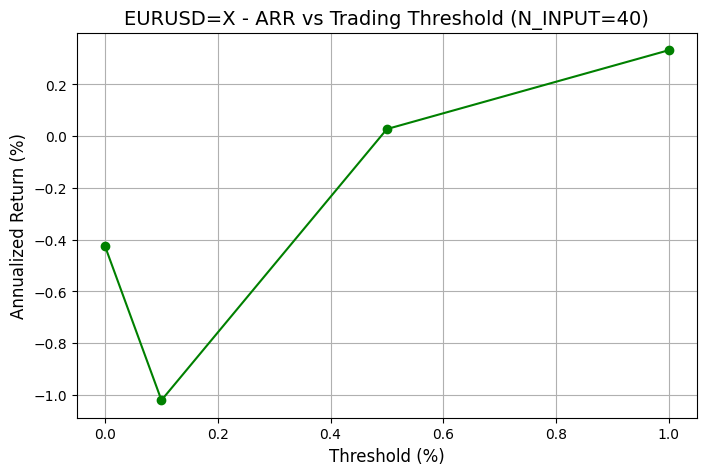

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: EURUSD=X (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for EURUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for EURUSD=X...
⚖️ Scaler

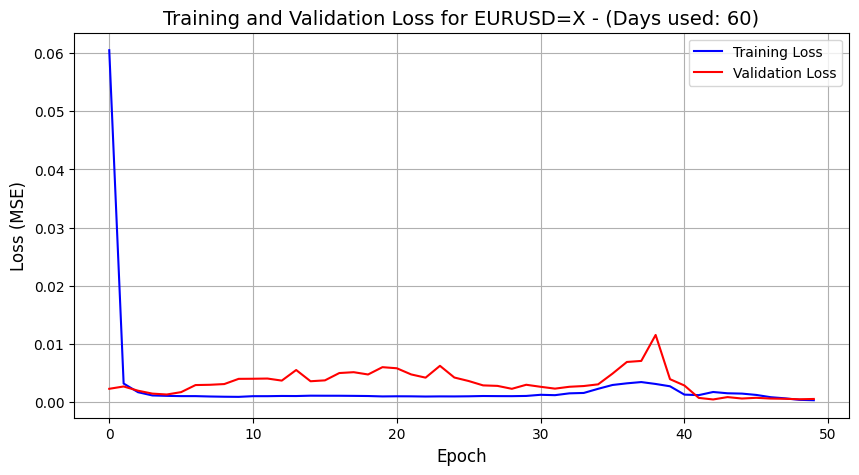

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: EURUSD=X
     📏 MAE:  0.0078
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000095
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0097
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.70%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


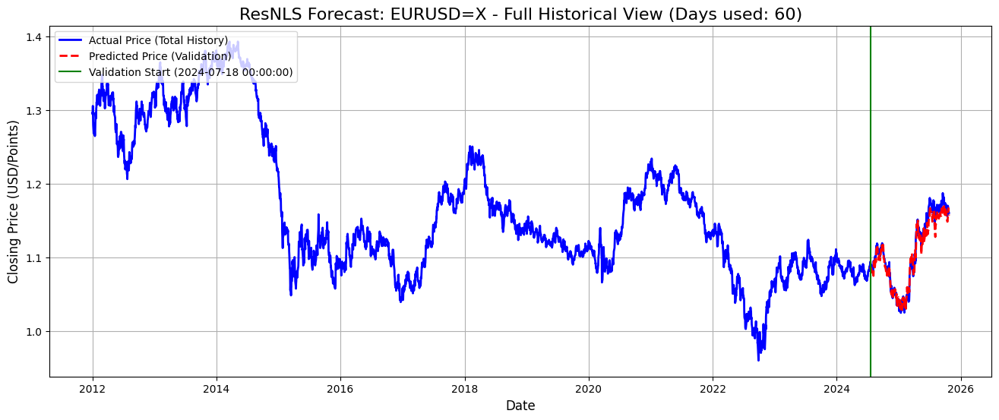

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


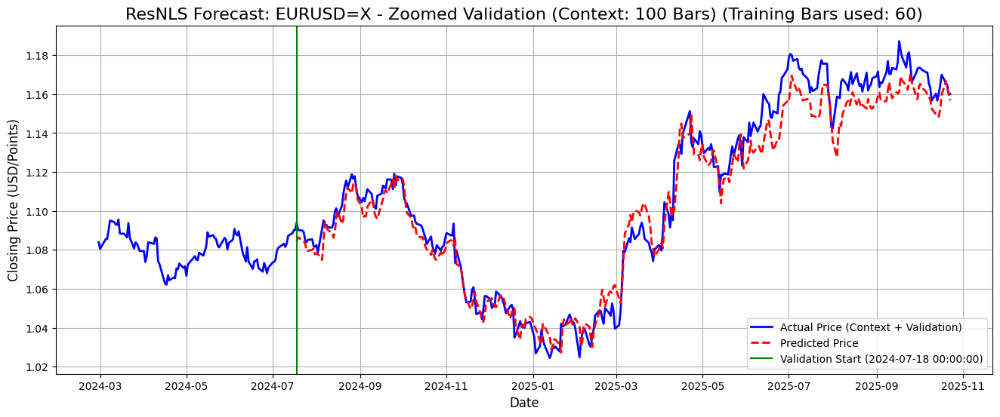

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 4.89% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-09-24 00:00: BUY @ 1.11 (Pred. Ret: 0.01%)
👋 2024-09-26 00:00: SELL @ 1.11 (Pred. Ret: -0.11%)
🛒 2024-09-27 00:00: BUY @ 1.12 (Pred. Ret: 0.23%)
👋 2024-09-30 00:00: SELL @ 1.12 (Pred. Ret: -0.07%)
🛒 2024-11-25 00:00: BUY @ 1.05 (Pred. Ret: 0.05%)
👋 2024-11-26 00:00: SELL @ 1.04 (Pred. Ret: -0.40%)
🛒 2024-12-03 00:00: BUY @ 1.05 (Pred. Ret: 0.06%)
👋 2024-12-05 00:00: SELL @ 1.05 (Pred. Ret: -0.01%)
🛒 2024-12-10 00:00: BUY @ 1.06 (Pred. Ret: 0.01%)
👋 2024-12-16 00:00: SELL @ 1.05 (Pred. Ret: -0.25%)
🛒 2024-12-19 00:00: BUY @ 1.04 (Pred. Ret: 0.05%)
👋 2024-12-23 00:00: SELL @ 1.04 (Pred. Ret: -0.25%)
🛒 2024-12-25 00:00: BUY @ 1.04 (Pred. Ret: 0.10%)
👋 2024-12-26 00:00: SELL @ 1.04 (Pred. Ret: -0.08%)
🛒 2024-12-27 00:00: BUY @ 1.04 (Pred. Ret: 0.44%)
👋 2025-01-21 00:00: SELL @ 1.04 (Pred. Re

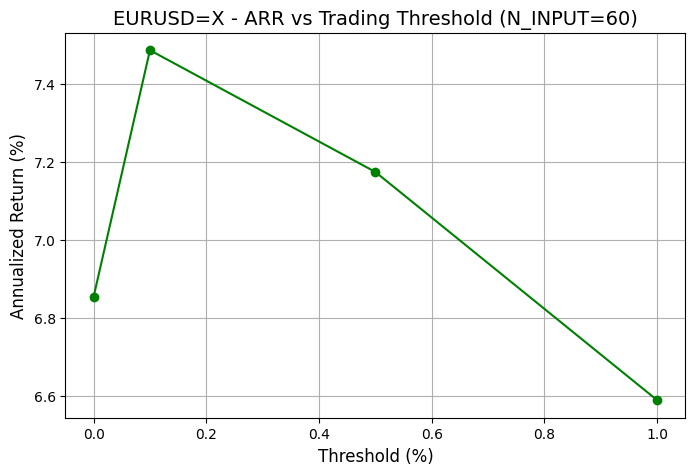

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for EURUSD=X.


In [16]:

TICKER = 'EURUSD=X'
all_n_forecasts(TICKER)

# GBPUSD

🔥 Starting all N-input forecast experiments for Ticker: GBPUSD=X...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler f

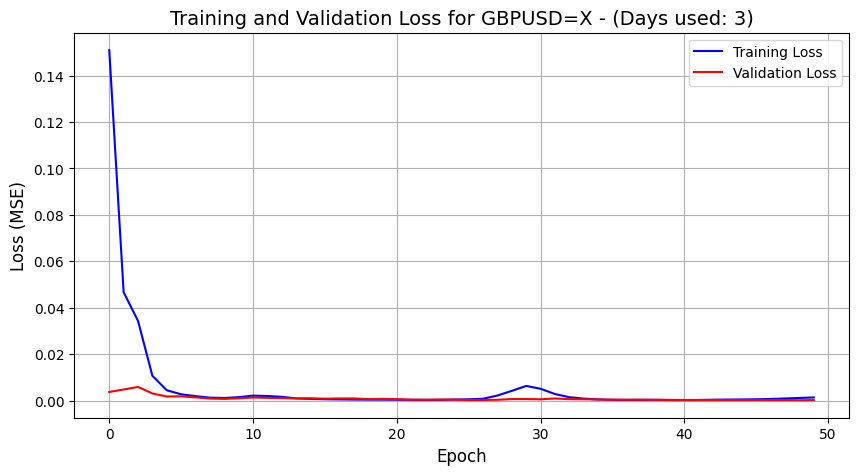

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0076
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000090
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0095
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.57%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


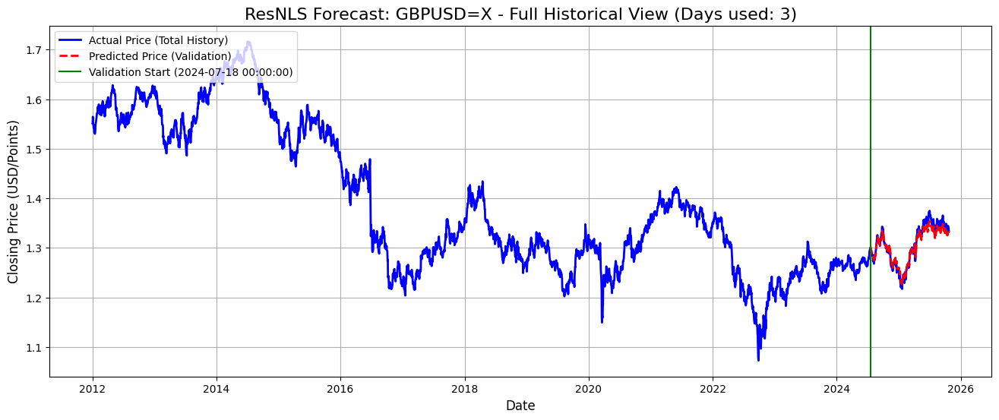

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


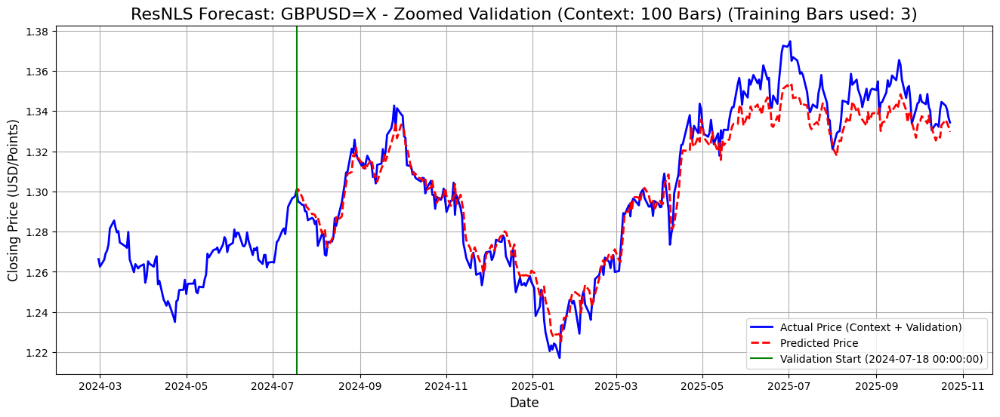

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.16% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.30 (Pred. Ret: 0.07%)
👋 2024-08-23 00:00: SELL @ 1.31 (Pred. Ret: -0.05%)
🛒 2024-09-13 00:00: BUY @ 1.31 (Pred. Ret: 0.07%)
👋 2024-09-16 00:00: SELL @ 1.31 (Pred. Ret: -0.14%)
🛒 2024-10-11 00:00: BUY @ 1.31 (Pred. Ret: 0.02%)
👋 2024-10-16 00:00: SELL @ 1.31 (Pred. Ret: -0.00%)
🛒 2024-10-17 00:00: BUY @ 1.30 (Pred. Ret: 0.02%)
👋 2024-10-22 00:00: SELL @ 1.30 (Pred. Ret: -0.00%)
🛒 2024-10-23 00:00: BUY @ 1.30 (Pred. Ret: 0.14%)
👋 2024-11-07 00:00: SELL @ 1.29 (Pred. Ret: -0.05%)
🛒 2024-11-08 00:00: BUY @ 1.30 (Pred. Ret: 0.40%)
👋 2025-01-22 00:00: SELL @ 1.23 (Pred. Ret: -0.04%)
🛒 2025-01-23 00:00: BUY @ 1.23 (Pred. Ret: 0.28%)
👋 2025-04-04 00:00: SELL @ 1.31 (Pred. Ret: -0.09%)
🛒 2025-04-08 00:00: BUY @ 1.27 (Pred. Ret: 0.40%)
👋 2025-04-14 00:00: SELL @ 1.31 (Pred. Re

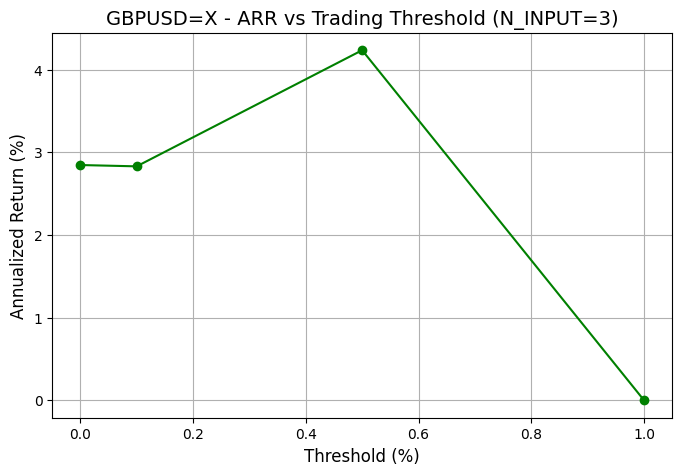

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler fit

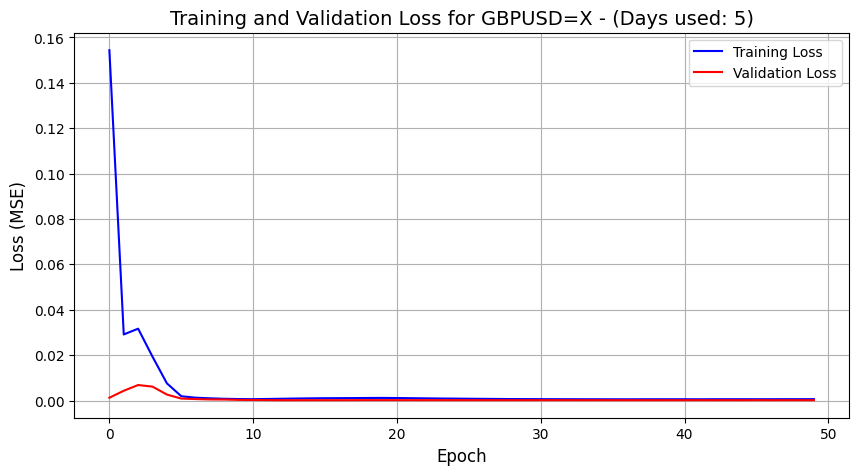

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0056
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000051
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0072
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.43%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


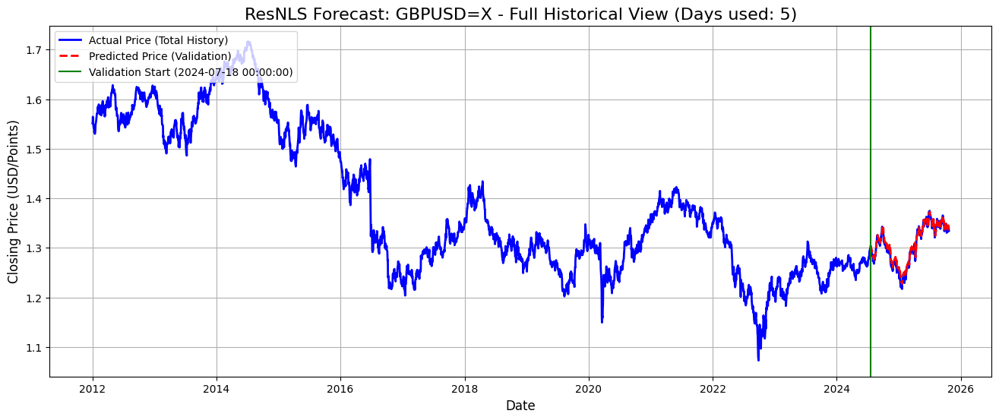

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


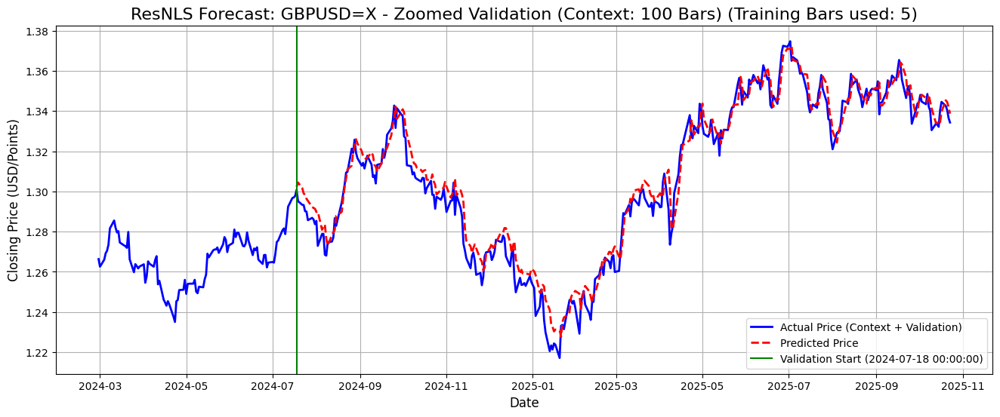

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.16% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.30 (Pred. Ret: 0.35%)
👋 2024-08-27 00:00: SELL @ 1.32 (Pred. Ret: -0.13%)
🛒 2024-08-28 00:00: BUY @ 1.33 (Pred. Ret: 0.22%)
👋 2024-09-18 00:00: SELL @ 1.32 (Pred. Ret: -0.01%)
🛒 2024-09-19 00:00: BUY @ 1.32 (Pred. Ret: 0.29%)
👋 2024-09-23 00:00: SELL @ 1.33 (Pred. Ret: -0.01%)
🛒 2024-09-24 00:00: BUY @ 1.33 (Pred. Ret: 0.12%)
👋 2024-09-26 00:00: SELL @ 1.33 (Pred. Ret: -0.03%)
🛒 2024-09-27 00:00: BUY @ 1.34 (Pred. Ret: 0.34%)
👋 2024-09-30 00:00: SELL @ 1.34 (Pred. Ret: -0.14%)
🛒 2024-10-01 00:00: BUY @ 1.34 (Pred. Ret: 0.19%)
👋 2025-03-07 00:00: SELL @ 1.29 (Pred. Ret: -0.08%)
🛒 2025-03-10 00:00: BUY @ 1.29 (Pred. Ret: 0.24%)
👋 2025-04-14 00:00: SELL @ 1.31 (Pred. Ret: -0.00%)
🛒 2025-04-22 00:00: BUY @ 1.34 (Pred. Ret: 0.15%)
👋 2025-04-23 00:00: SELL @ 1.33 (Pred. Re

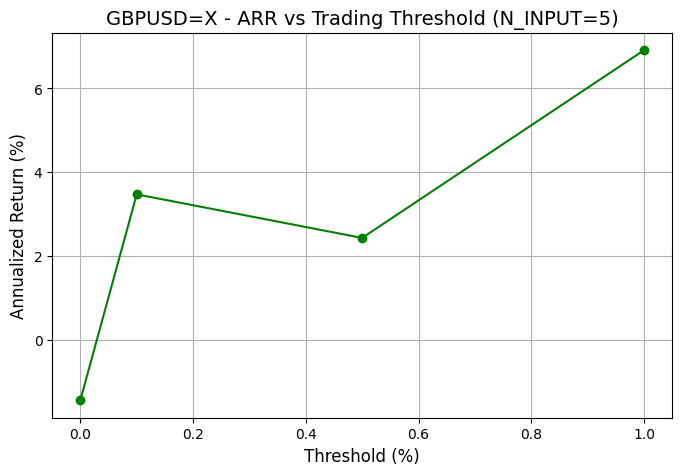

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler 

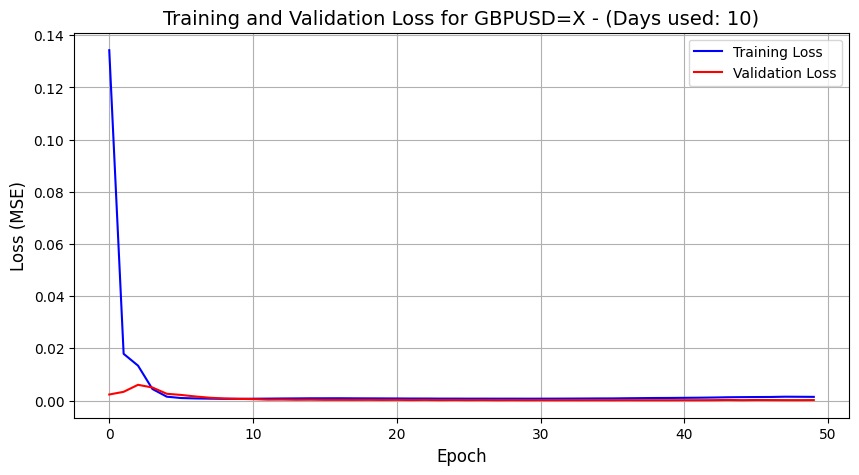

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0068
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000072
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0085
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.51%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


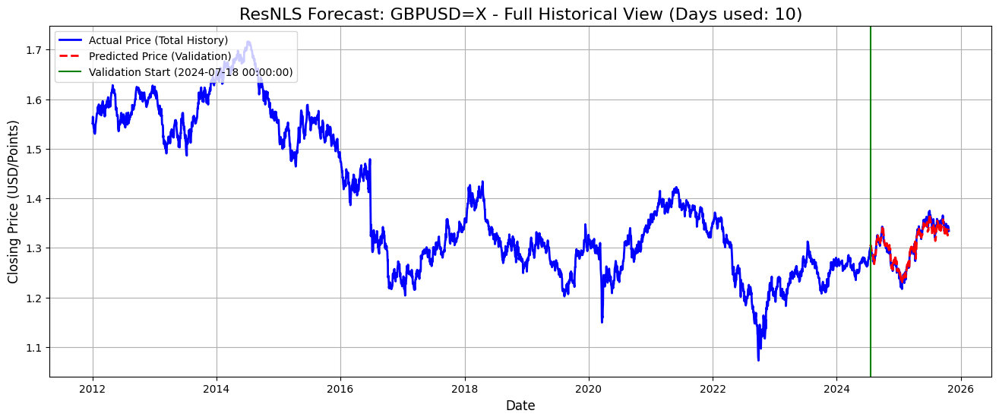

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


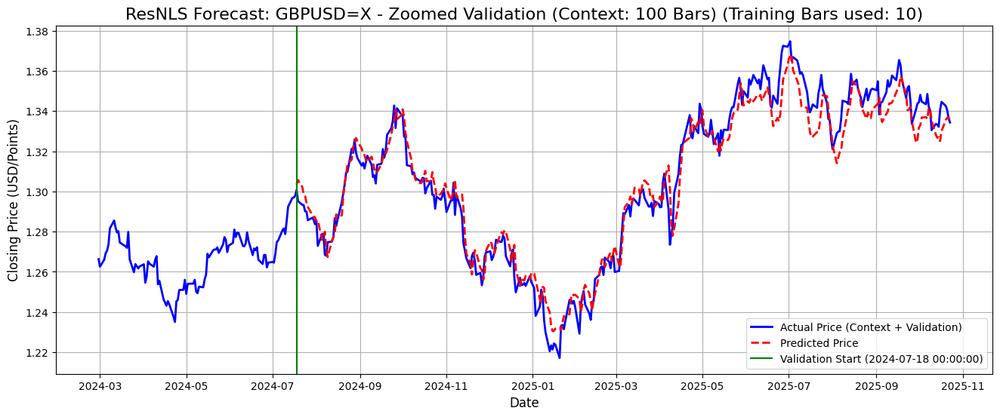

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.16% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.30 (Pred. Ret: 0.44%)
👋 2024-08-06 00:00: SELL @ 1.28 (Pred. Ret: -0.15%)
🛒 2024-08-07 00:00: BUY @ 1.27 (Pred. Ret: 0.08%)
👋 2024-08-09 00:00: SELL @ 1.27 (Pred. Ret: -0.05%)
🛒 2024-08-12 00:00: BUY @ 1.27 (Pred. Ret: 0.06%)
👋 2024-09-09 00:00: SELL @ 1.31 (Pred. Ret: -0.03%)
🛒 2024-09-10 00:00: BUY @ 1.31 (Pred. Ret: 0.10%)
👋 2024-09-18 00:00: SELL @ 1.32 (Pred. Ret: -0.13%)
🛒 2024-09-19 00:00: BUY @ 1.32 (Pred. Ret: 0.16%)
👋 2024-09-25 00:00: SELL @ 1.34 (Pred. Ret: -0.02%)
🛒 2024-09-27 00:00: BUY @ 1.34 (Pred. Ret: 0.32%)
👋 2024-09-30 00:00: SELL @ 1.34 (Pred. Ret: -0.26%)
🛒 2024-10-01 00:00: BUY @ 1.34 (Pred. Ret: 0.19%)
👋 2024-10-02 00:00: SELL @ 1.33 (Pred. Ret: -0.03%)
🛒 2024-10-03 00:00: BUY @ 1.33 (Pred. Ret: 0.12%)
👋 2024-10-04 00:00: SELL @ 1.31 (Pred. Re

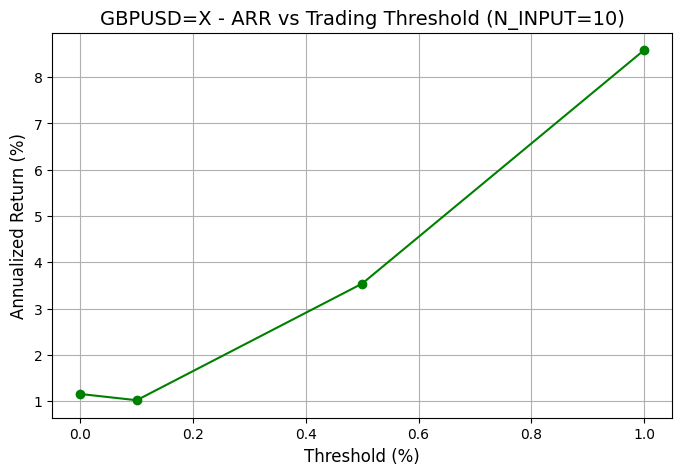

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler

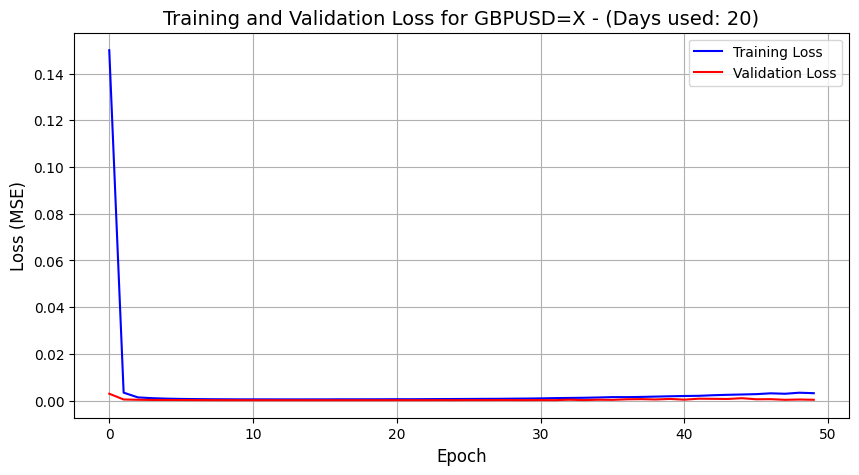

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0089
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000130
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0114
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.68%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


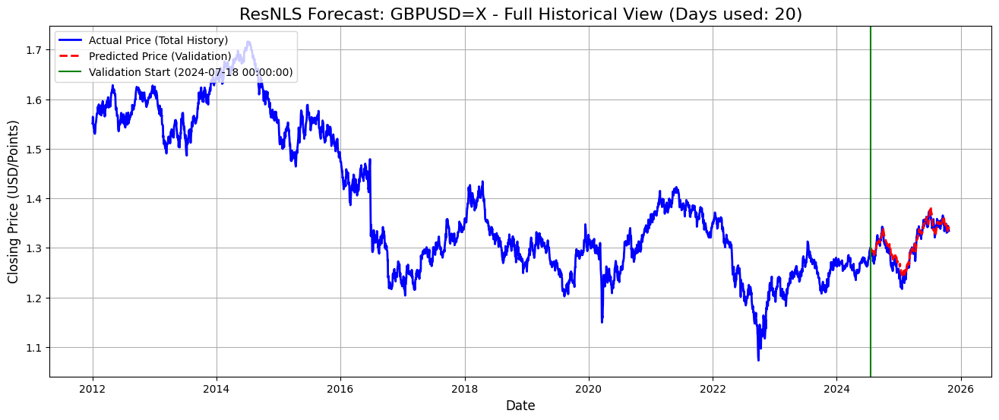

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


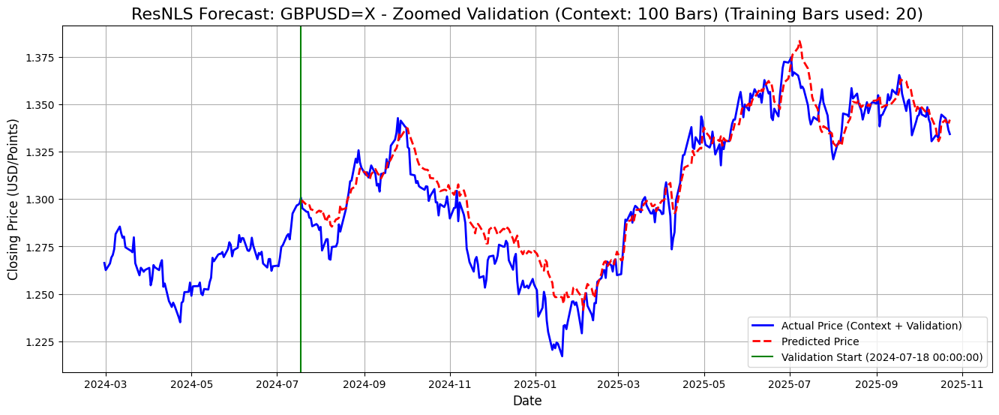

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.16% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 1.30 (Pred. Ret: 0.03%)
👋 2024-07-19 00:00: SELL @ 1.29 (Pred. Ret: -0.12%)
🛒 2024-07-22 00:00: BUY @ 1.29 (Pred. Ret: 0.13%)
👋 2024-08-22 00:00: SELL @ 1.31 (Pred. Ret: -0.06%)
🛒 2024-09-10 00:00: BUY @ 1.31 (Pred. Ret: 0.08%)
👋 2024-09-18 00:00: SELL @ 1.32 (Pred. Ret: -0.06%)
🛒 2024-09-19 00:00: BUY @ 1.32 (Pred. Ret: 0.23%)
👋 2024-09-23 00:00: SELL @ 1.33 (Pred. Ret: -0.18%)
🛒 2024-09-27 00:00: BUY @ 1.34 (Pred. Ret: 0.09%)
👋 2024-09-30 00:00: SELL @ 1.34 (Pred. Ret: -0.38%)
🛒 2024-10-03 00:00: BUY @ 1.33 (Pred. Ret: 0.49%)
👋 2025-03-07 00:00: SELL @ 1.29 (Pred. Ret: -0.08%)
🛒 2025-03-10 00:00: BUY @ 1.29 (Pred. Ret: 0.02%)
👋 2025-03-11 00:00: SELL @ 1.29 (Pred. Ret: -0.17%)
🛒 2025-03-12 00:00: BUY @ 1.29 (Pred. Ret: 0.09%)
👋 2025-03-13 00:00: SELL @ 1.30 (Pred. Re

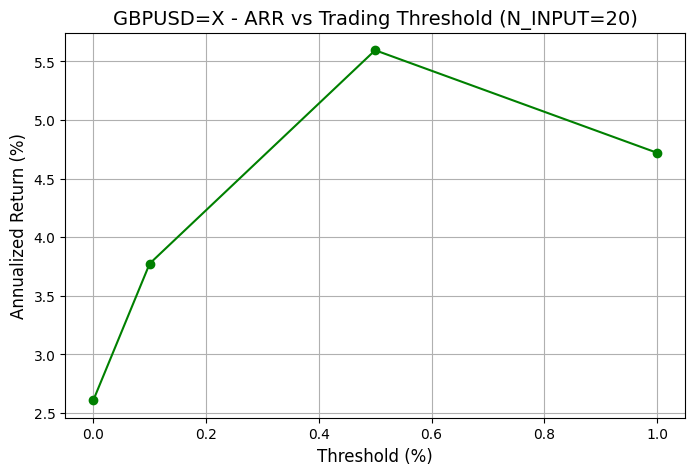

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler

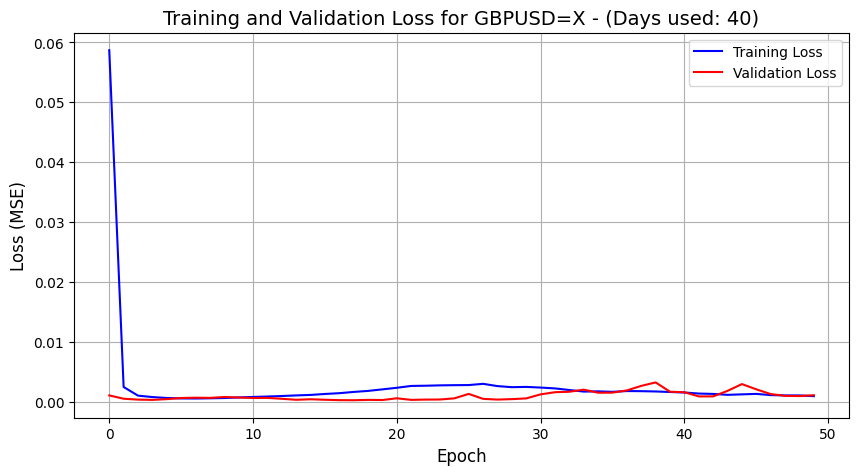

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0177
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000441
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0210
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 1.37%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


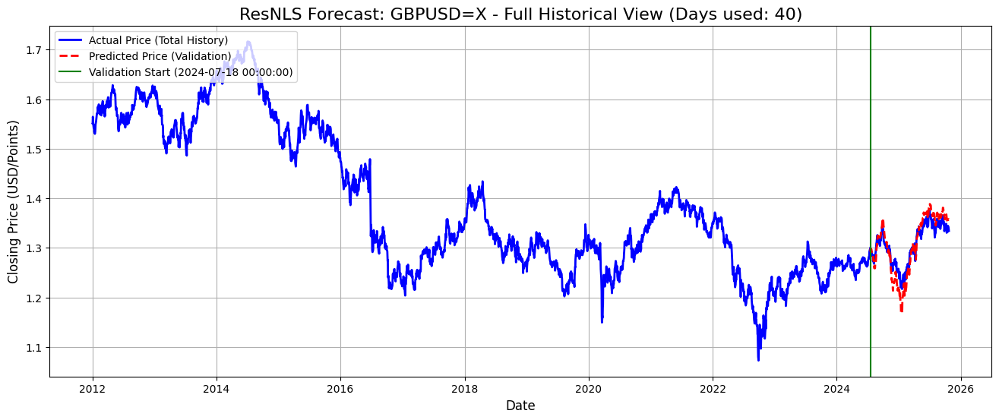

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


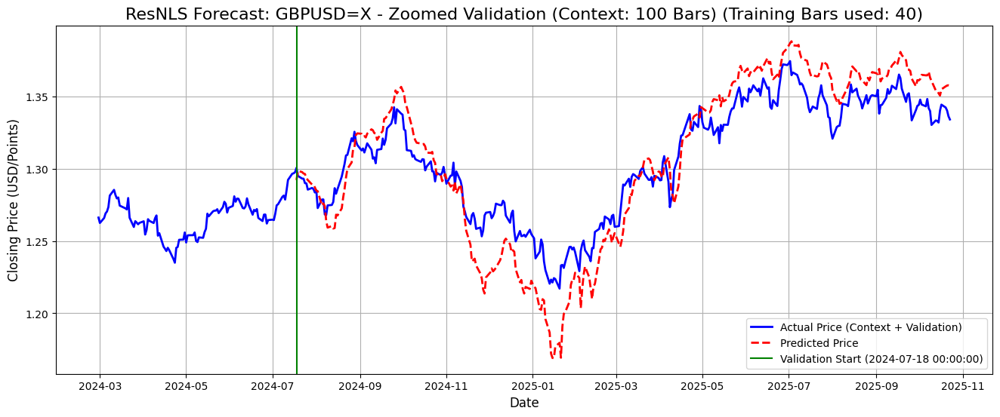

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.16% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-22 00:00: BUY @ 1.29 (Pred. Ret: 0.20%)
👋 2024-08-02 00:00: SELL @ 1.27 (Pred. Ret: -0.06%)
🛒 2024-08-05 00:00: BUY @ 1.28 (Pred. Ret: 0.14%)
👋 2024-08-06 00:00: SELL @ 1.28 (Pred. Ret: -0.21%)
🛒 2024-08-30 00:00: BUY @ 1.32 (Pred. Ret: 0.40%)
👋 2024-10-28 00:00: SELL @ 1.30 (Pred. Ret: -0.08%)
🛒 2025-03-18 00:00: BUY @ 1.30 (Pred. Ret: 0.15%)
👋 2025-03-19 00:00: SELL @ 1.30 (Pred. Ret: -0.07%)
🛒 2025-03-20 00:00: BUY @ 1.30 (Pred. Ret: 0.11%)
👋 2025-04-04 00:00: SELL @ 1.31 (Pred. Ret: -0.14%)
🛒 2025-04-08 00:00: BUY @ 1.27 (Pred. Ret: 0.65%)
👋 2025-04-11 00:00: SELL @ 1.30 (Pred. Ret: -0.50%)
🛒 2025-04-22 00:00: BUY @ 1.34 (Pred. Ret: 0.04%)
👋 2025-04-23 00:00: SELL @ 1.33 (Pred. Ret: -0.26%)
🛒 2025-04-24 00:00: BUY @ 1.33 (Pred. Ret: 0.52%)
👋 2025-04-30 00:00: SELL @ 1.34 (Pred. Re

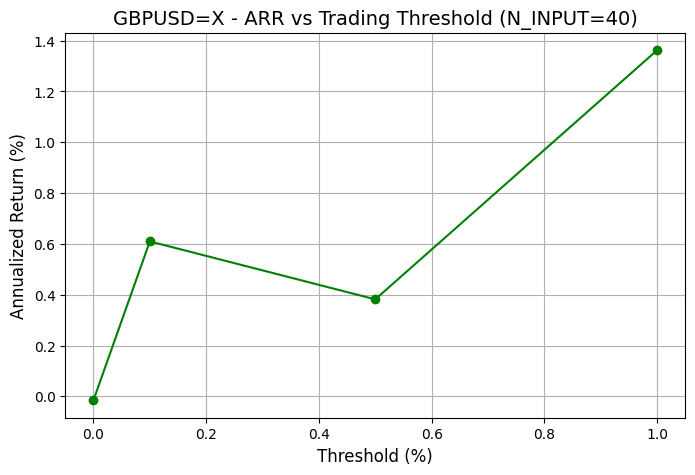

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: GBPUSD=X (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for GBPUSD=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for GBPUSD=X...
⚖️ Scaler

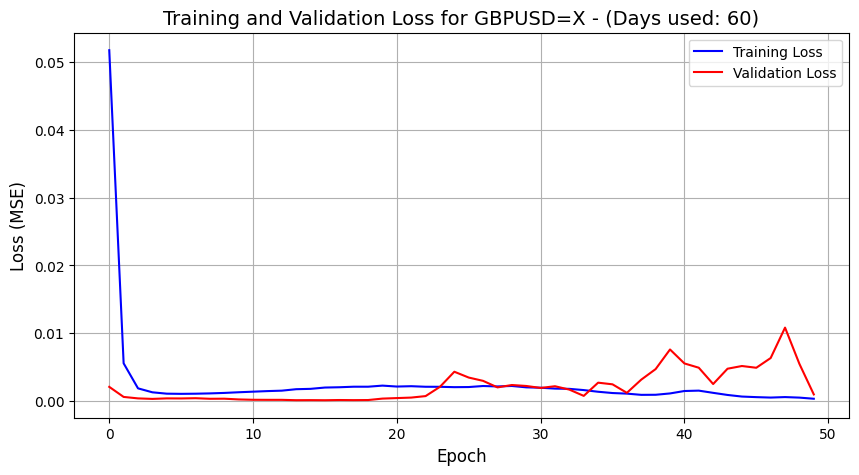

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: GBPUSD=X
     📏 MAE:  0.0168
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  0.000410
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 0.0202
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 1.30%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


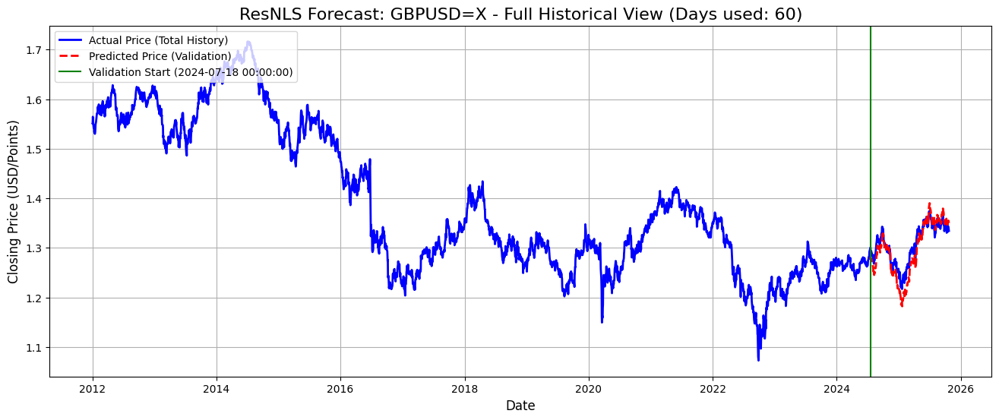

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


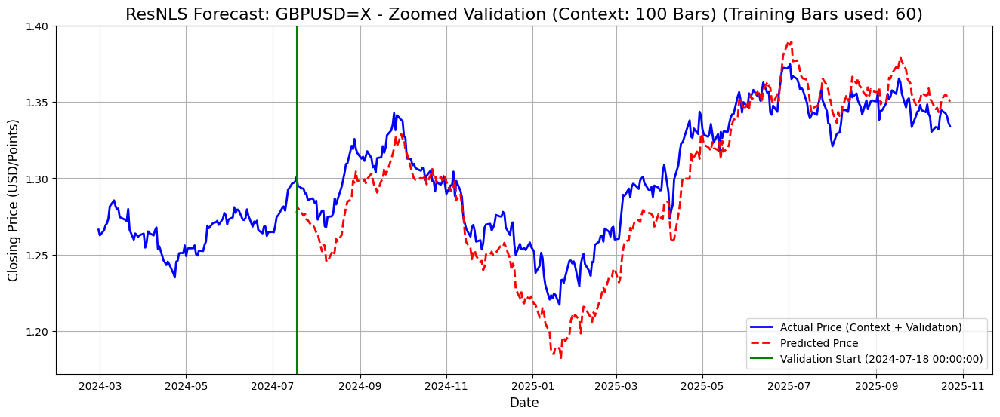

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 2.15% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-10-21 00:00: BUY @ 1.31 (Pred. Ret: 0.07%)
👋 2024-11-05 00:00: SELL @ 1.30 (Pred. Ret: -0.01%)
🛒 2025-05-30 00:00: BUY @ 1.35 (Pred. Ret: 0.15%)
👋 2025-06-02 00:00: SELL @ 1.35 (Pred. Ret: -0.09%)
🛒 2025-06-10 00:00: BUY @ 1.36 (Pred. Ret: 0.05%)
👋 2025-06-12 00:00: SELL @ 1.36 (Pred. Ret: -0.08%)
🛒 2025-06-13 00:00: BUY @ 1.36 (Pred. Ret: 0.11%)
🔚 Last Bar: Close Out @ 1.33
✅ Threshold None (0.00%) → ARR: -2.28%, Total Return: -2.96%, Buys: 4
🚀 Running backtest for threshold = 0.10%
🛒 2024-10-23 00:00: BUY @ 1.30 (Pred. Ret: 0.22%)
👋 2024-11-07 00:00: SELL @ 1.29 (Pred. Ret: -0.44%)
🛒 2025-05-30 00:00: BUY @ 1.35 (Pred. Ret: 0.15%)
👋 2025-06-03 00:00: SELL @ 1.36 (Pred. Ret: -0.10%)
🛒 2025-06-13 00:00: BUY @ 1.36 (Pred. Ret: 0.11%)
🔚 Last Bar: Close Out @ 1.33
✅ Threshold 0.10% → ARR: -

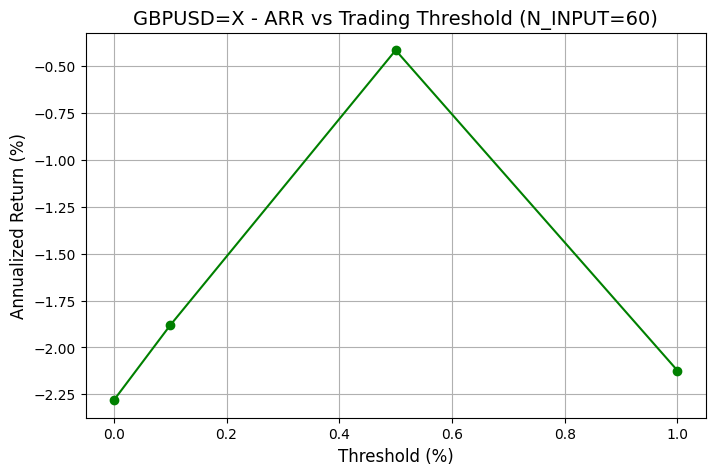

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for GBPUSD=X.


In [17]:
TICKER = 'GBPUSD=X'
all_n_forecasts(TICKER)

# USDJPY

🔥 Starting all N-input forecast experiments for Ticker: USDJPY=X...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler f

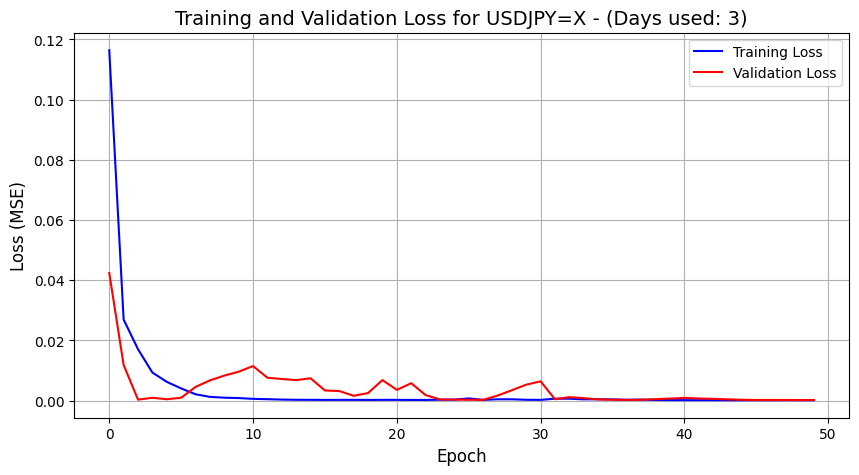

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  0.9379
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  1.411870
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 1.1882
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.63%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


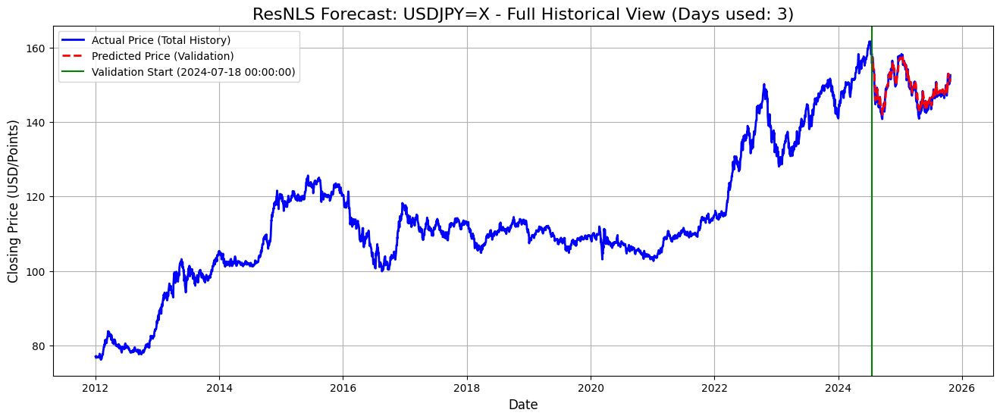

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


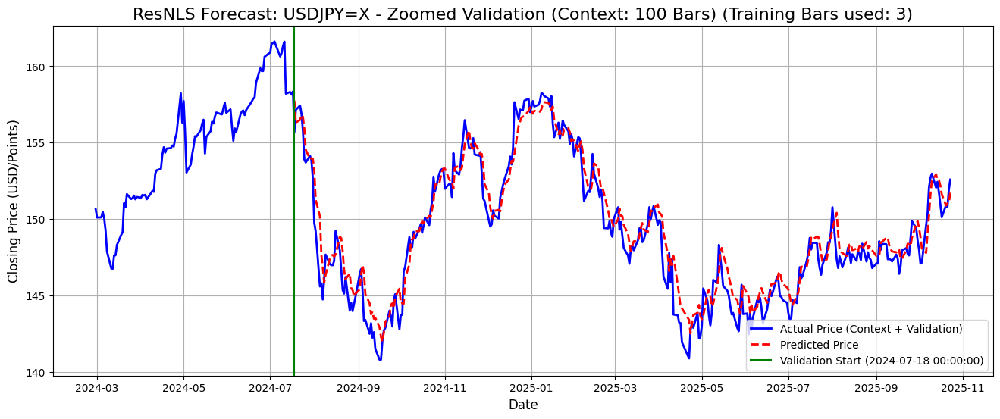

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.81% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-19 00:00: BUY @ 157.15 (Pred. Ret: 0.40%)
👋 2024-07-22 00:00: SELL @ 157.42 (Pred. Ret: -0.42%)
🛒 2024-07-25 00:00: BUY @ 153.89 (Pred. Ret: 0.11%)
👋 2024-07-30 00:00: SELL @ 153.83 (Pred. Ret: -0.10%)
🛒 2024-07-31 00:00: BUY @ 152.67 (Pred. Ret: 0.06%)
👋 2024-08-12 00:00: SELL @ 147.04 (Pred. Ret: -0.17%)
🛒 2024-08-13 00:00: BUY @ 146.98 (Pred. Ret: 0.40%)
👋 2024-08-19 00:00: SELL @ 147.96 (Pred. Ret: -0.25%)
🛒 2024-08-20 00:00: BUY @ 146.70 (Pred. Ret: 0.53%)
👋 2024-09-03 00:00: SELL @ 146.72 (Pred. Ret: -0.01%)
🛒 2024-09-04 00:00: BUY @ 145.35 (Pred. Ret: 0.17%)
👋 2024-10-04 00:00: SELL @ 146.84 (Pred. Ret: -0.32%)
🛒 2024-10-07 00:00: BUY @ 148.82 (Pred. Ret: 0.11%)
👋 2024-10-08 00:00: SELL @ 148.15 (Pred. Ret: -0.24%)
🛒 2024-10-09 00:00: BUY @ 148.16 (Pred. Ret: 0.36%)
👋 2024-10-

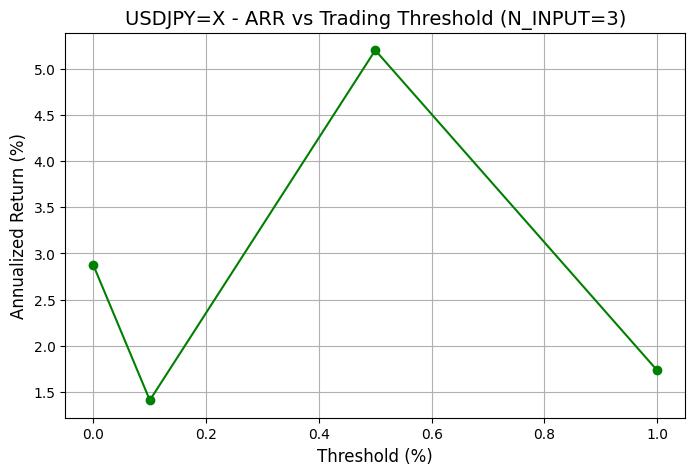

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler fit

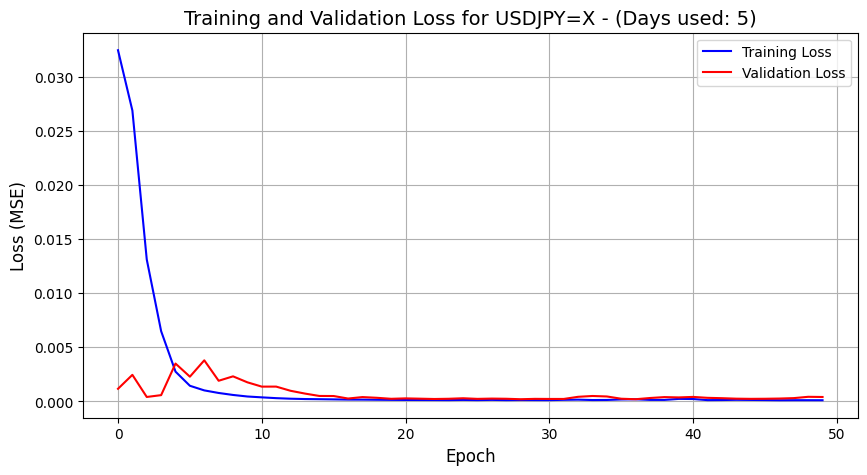

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  1.4026
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  2.979365
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 1.7261
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 0.95%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


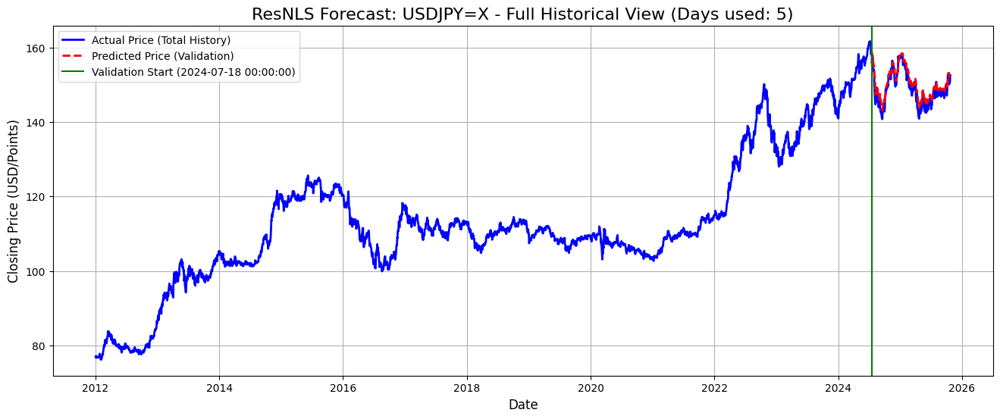

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


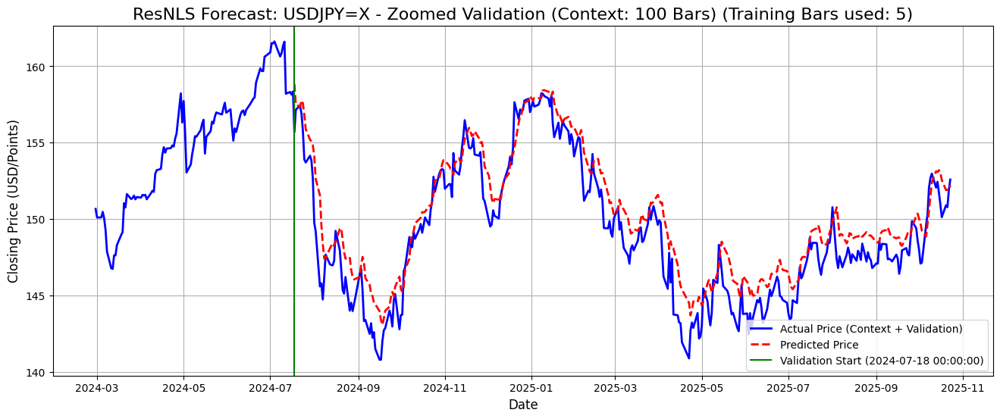

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.81% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 155.69 (Pred. Ret: 0.31%)
👋 2024-10-08 00:00: SELL @ 148.15 (Pred. Ret: -0.20%)
🛒 2024-10-09 00:00: BUY @ 148.16 (Pred. Ret: 0.57%)
👋 2024-10-25 00:00: SELL @ 151.78 (Pred. Ret: -0.16%)
🛒 2024-10-28 00:00: BUY @ 152.95 (Pred. Ret: 0.57%)
👋 2024-11-08 00:00: SELL @ 153.18 (Pred. Ret: -0.43%)
🛒 2024-11-11 00:00: BUY @ 152.90 (Pred. Ret: 0.53%)
👋 2024-11-15 00:00: SELL @ 156.47 (Pred. Ret: -0.12%)
🛒 2024-11-19 00:00: BUY @ 154.62 (Pred. Ret: 0.69%)
👋 2024-12-20 00:00: SELL @ 157.64 (Pred. Ret: -0.02%)
🛒 2024-12-24 00:00: BUY @ 157.16 (Pred. Ret: 0.13%)
👋 2024-12-25 00:00: SELL @ 157.11 (Pred. Ret: -0.18%)
🛒 2024-12-26 00:00: BUY @ 157.13 (Pred. Ret: 0.13%)
👋 2025-02-14 00:00: SELL @ 152.99 (Pred. Ret: -0.26%)
🛒 2025-02-17 00:00: BUY @ 152.02 (Pred. Ret: 0.61%)
👋 2025-05-

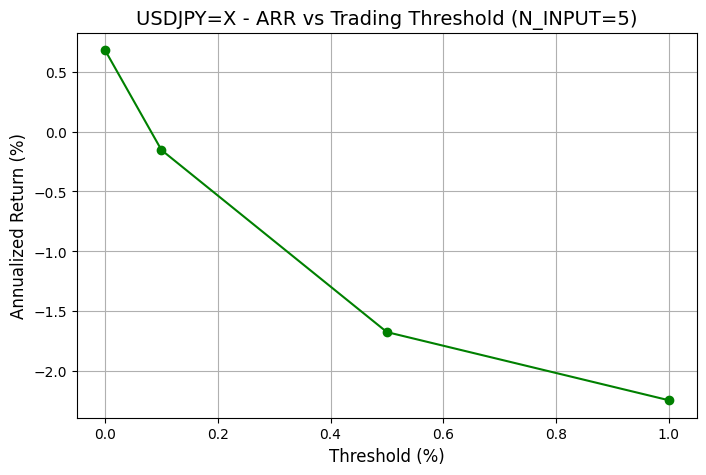

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler 

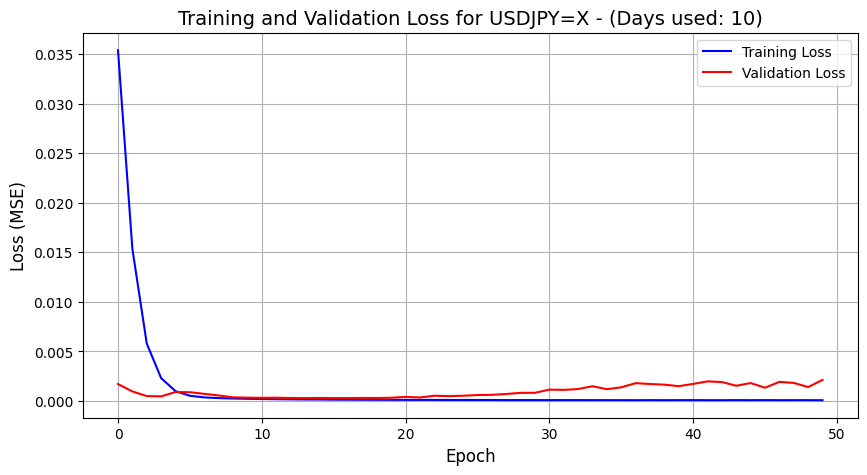

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  3.5792
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  15.589830
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 3.9484
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.38%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


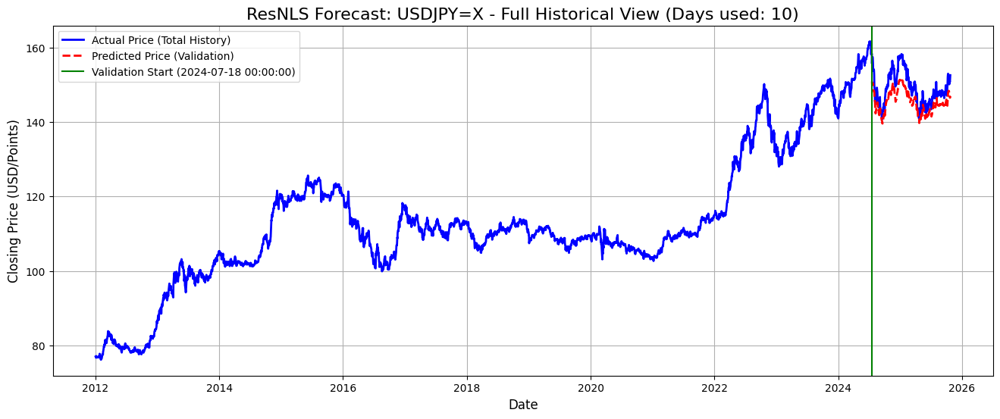

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


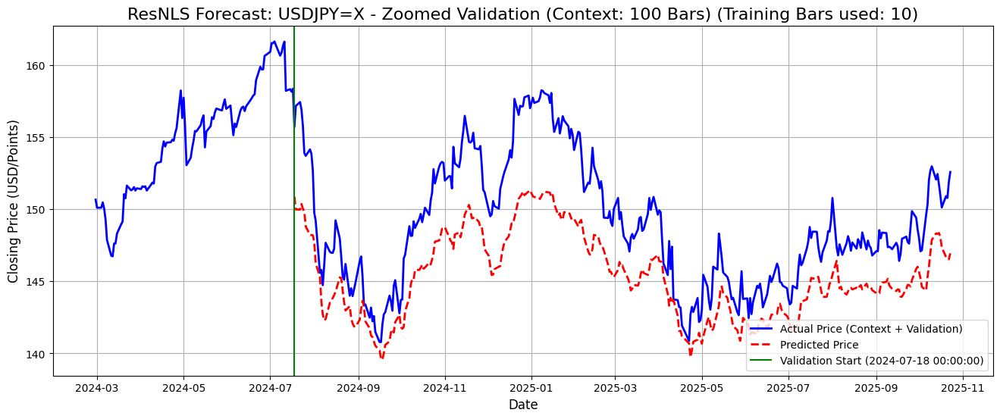

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.82% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

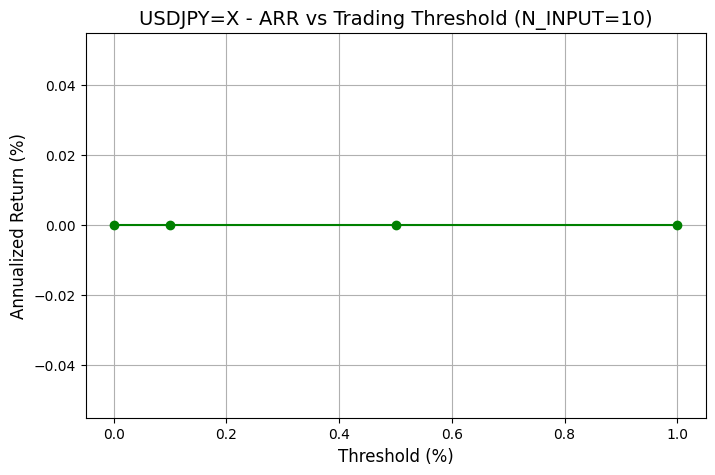

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler

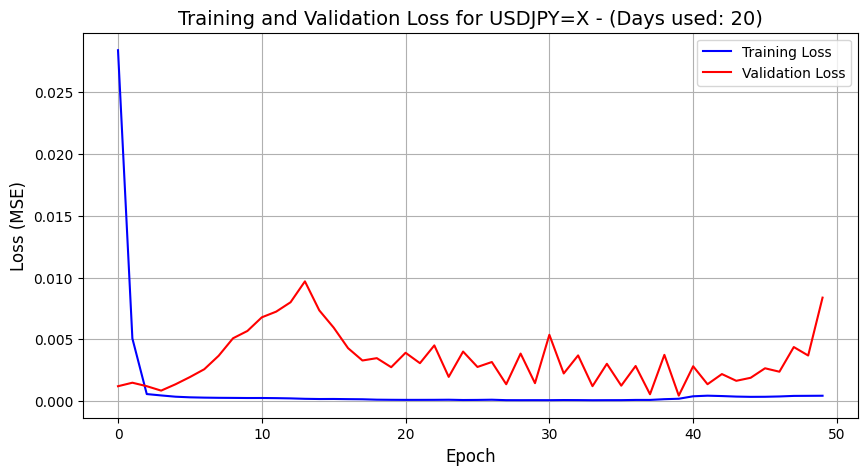

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  7.5303
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  61.146999
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 7.8197
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 5.03%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


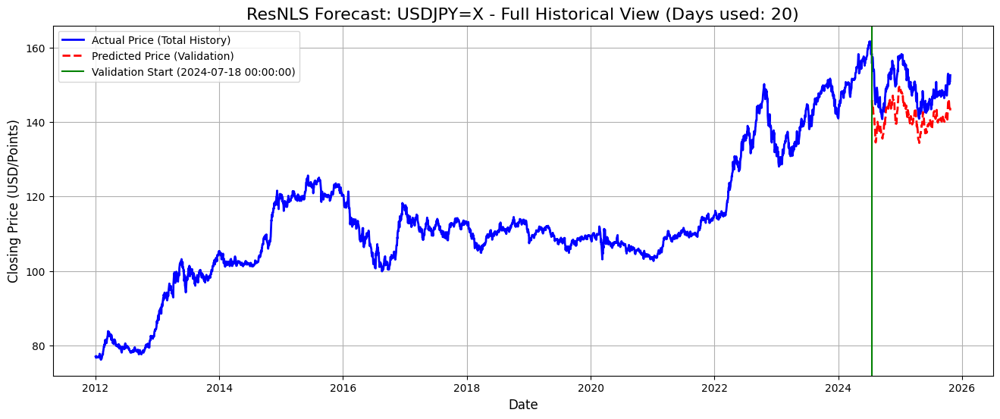

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


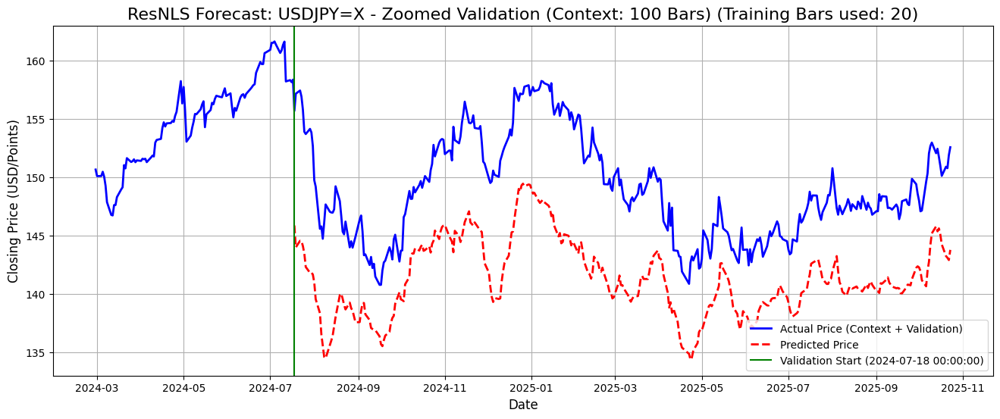

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.82% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

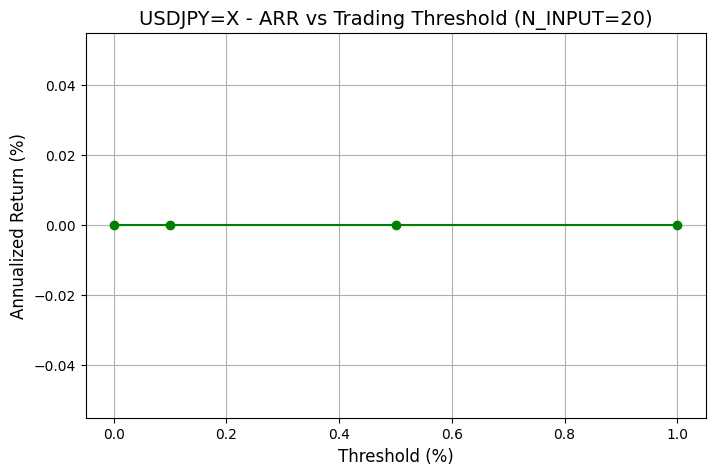

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler

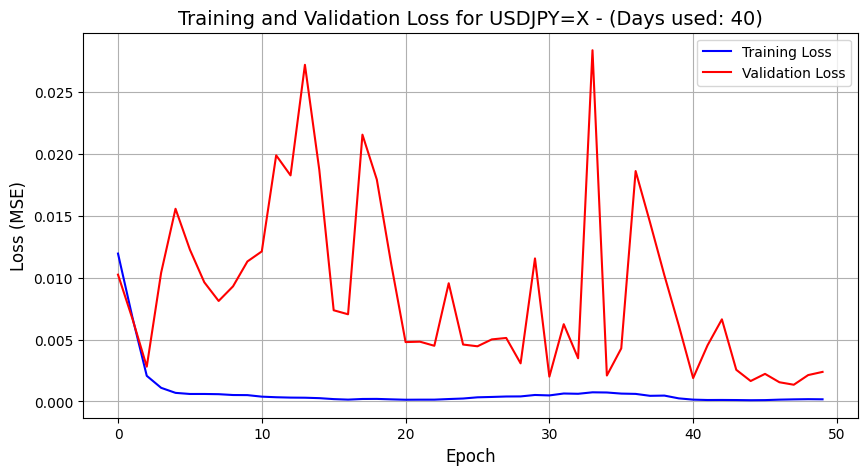

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  3.6794
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  17.416696
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 4.1733
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.44%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


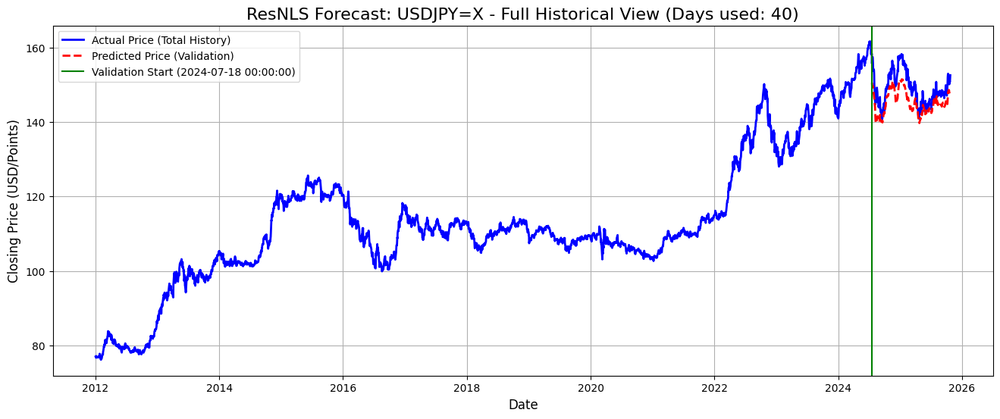

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


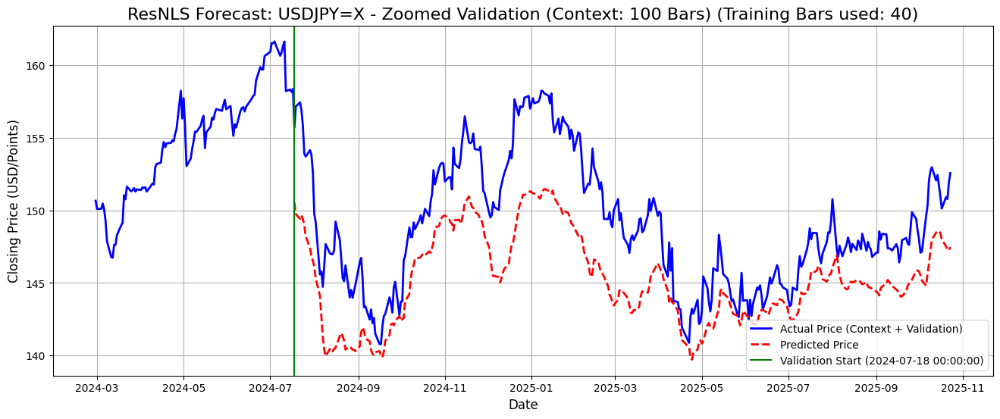

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.82% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-06-04 00:00: BUY @ 143.84 (Pred. Ret: 0.01%)
👋 2025-06-05 00:00: SELL @ 142.73 (Pred. Ret: -1.02%)
✅ Threshold None (0.00%) → ARR: -0.59%, Total Return: -0.77%, Buys: 1
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    1         -0.77               -0.59     
0.10           0         0.00                0.00  

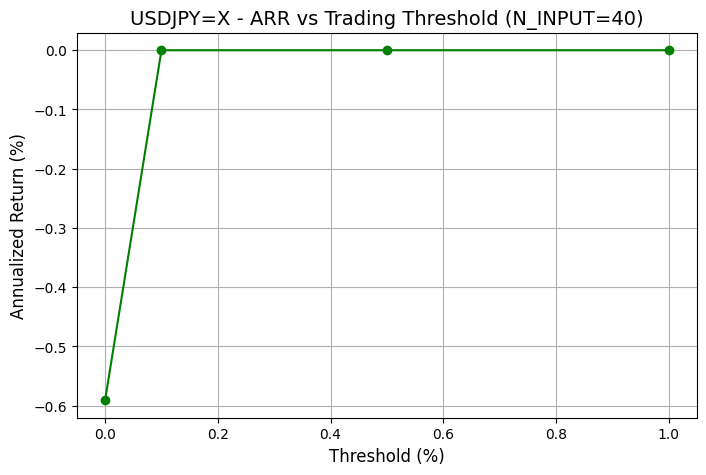

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: USDJPY=X (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for USDJPY=X (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for USDJPY=X...
⚖️ Scaler

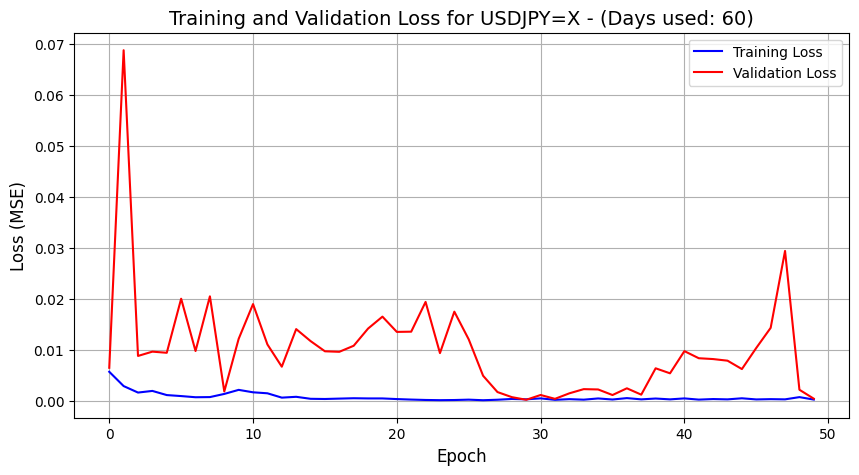

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: USDJPY=X
     📏 MAE:  1.4807
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  3.546903
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 1.8833
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 1.00%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

💎 Excellent! Predictions are extremely close — less than 1% average error.

🖼️ 1/2: Generating Full Historical Plot...


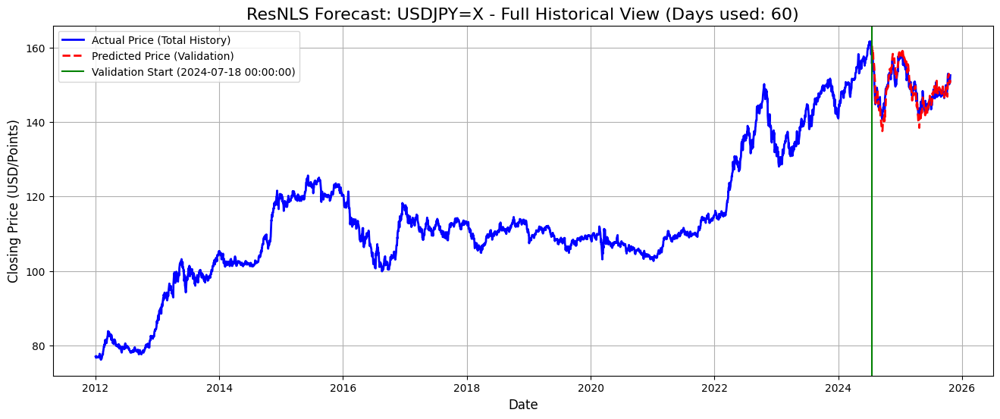

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


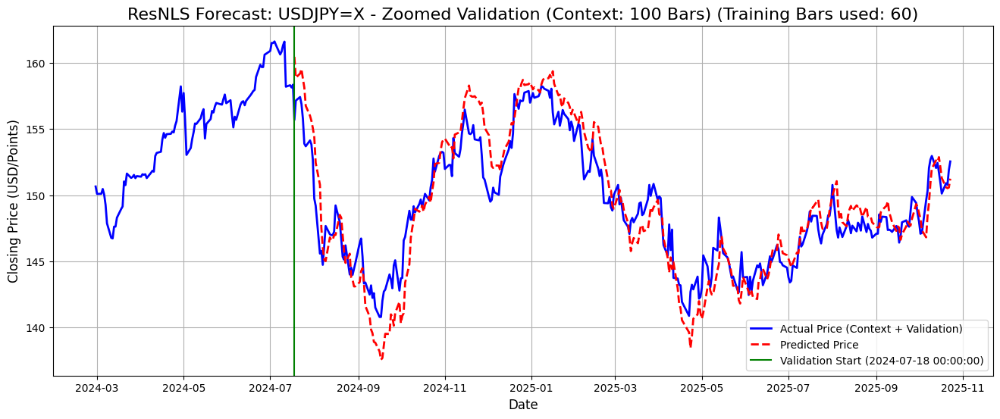

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): -2.83% over 328 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-07-18 00:00: BUY @ 155.69 (Pred. Ret: 1.33%)
👋 2024-08-09 00:00: SELL @ 147.67 (Pred. Ret: -0.76%)
🛒 2024-08-15 00:00: BUY @ 147.25 (Pred. Ret: 0.00%)
👋 2024-08-16 00:00: SELL @ 149.22 (Pred. Ret: -0.18%)
🛒 2024-08-20 00:00: BUY @ 146.70 (Pred. Ret: 0.23%)
👋 2024-08-23 00:00: SELL @ 146.20 (Pred. Ret: -0.16%)
🛒 2024-10-14 00:00: BUY @ 149.33 (Pred. Ret: 0.03%)
👋 2024-10-15 00:00: SELL @ 149.67 (Pred. Ret: -0.31%)
🛒 2024-10-28 00:00: BUY @ 152.95 (Pred. Ret: 0.44%)
👋 2025-03-03 00:00: SELL @ 150.77 (Pred. Ret: -0.03%)
🛒 2025-03-05 00:00: BUY @ 149.80 (Pred. Ret: 0.13%)
👋 2025-03-06 00:00: SELL @ 148.90 (Pred. Ret: -0.12%)
🛒 2025-03-07 00:00: BUY @ 148.11 (Pred. Ret: 0.00%)
👋 2025-03-10 00:00: SELL @ 147.61 (Pred. Ret: -0.14%)
🛒 2025-06-13 00:00: BUY @ 143.19 (Pred. Ret: 0.16%)
👋 2025-06-

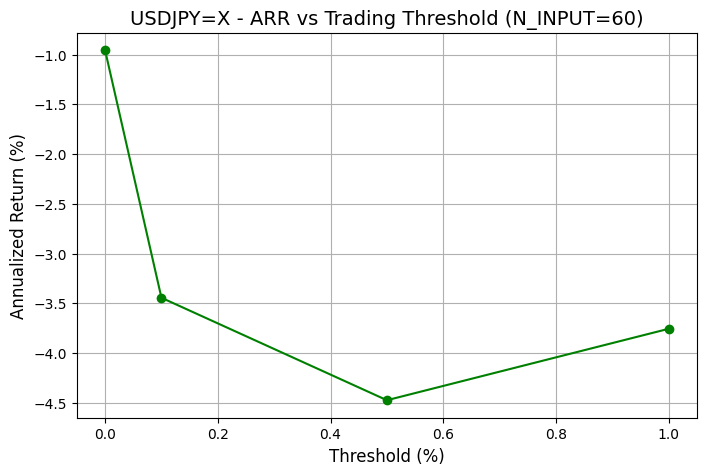

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for USDJPY=X.


In [18]:
TICKER = 'USDJPY=X'
all_n_forecasts(TICKER)

# BTC-USD

🔥 Starting all N-input forecast experiments for Ticker: BTC-USD...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fitte

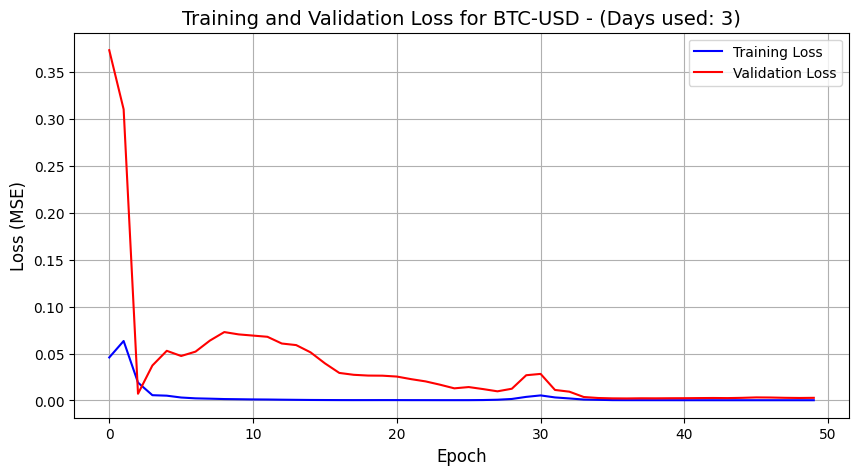

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  3001.1409
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  14690885.705684
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 3832.8691
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 3.16%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


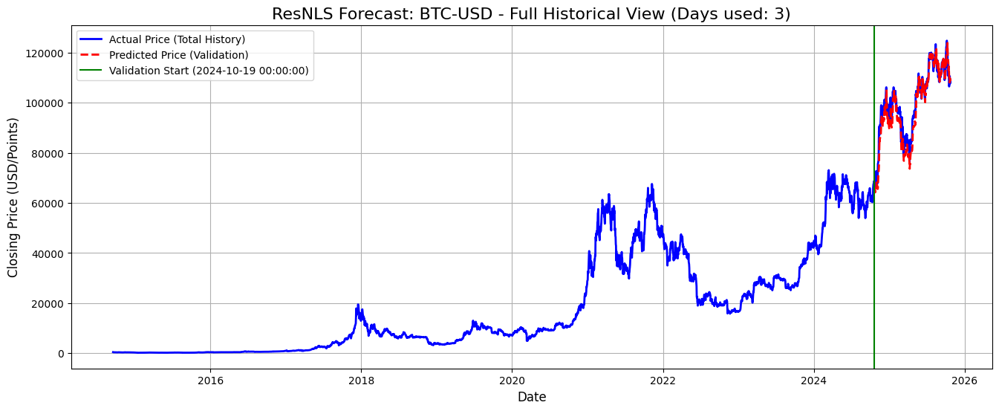

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


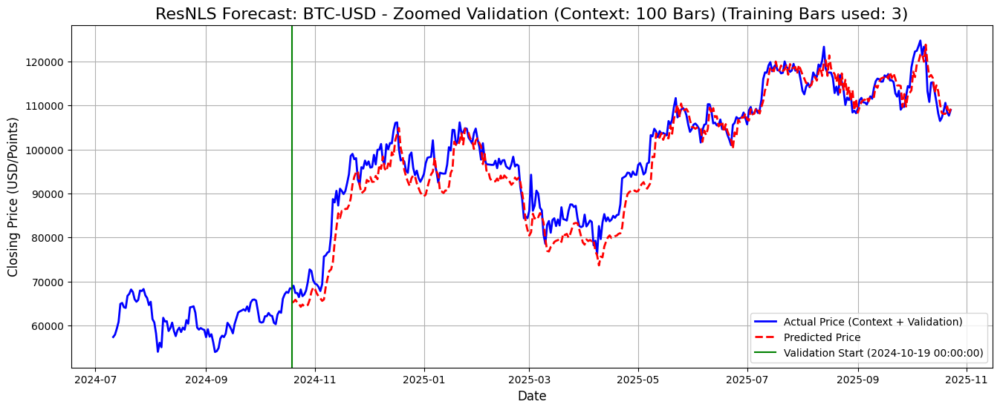

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.32% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-12-19 00:00: BUY @ 100070.69 (Pred. Ret: 0.26%)
👋 2024-12-21 00:00: SELL @ 97756.20 (Pred. Ret: -2.49%)
🛒 2025-01-24 00:00: BUY @ 103965.67 (Pred. Ret: 0.74%)
👋 2025-01-25 00:00: SELL @ 104824.03 (Pred. Ret: -0.82%)
🛒 2025-02-02 00:00: BUY @ 100661.54 (Pred. Ret: 0.04%)
👋 2025-02-03 00:00: SELL @ 97681.10 (Pred. Ret: -1.06%)
🛒 2025-05-21 00:00: BUY @ 106791.31 (Pred. Ret: 0.13%)
👋 2025-05-22 00:00: SELL @ 109673.49 (Pred. Ret: -0.96%)
🛒 2025-05-25 00:00: BUY @ 107802.27 (Pred. Ret: 2.45%)
👋 2025-05-26 00:00: SELL @ 109023.78 (Pred. Ret: -0.27%)
🛒 2025-05-28 00:00: BUY @ 108992.17 (Pred. Ret: 0.20%)
👋 2025-06-02 00:00: SELL @ 105649.81 (Pred. Ret: -0.90%)
🛒 2025-06-05 00:00: BUY @ 104750.78 (Pred. Ret: 0.02%)
👋 2025-06-07 00:00: SELL @ 104390.65 (Pred. Ret: -0.10%)
🛒 2025-06-12 00:00: BU

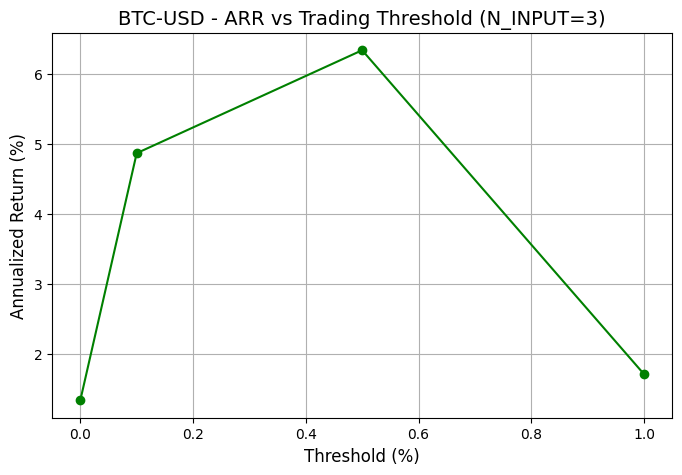

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fitted

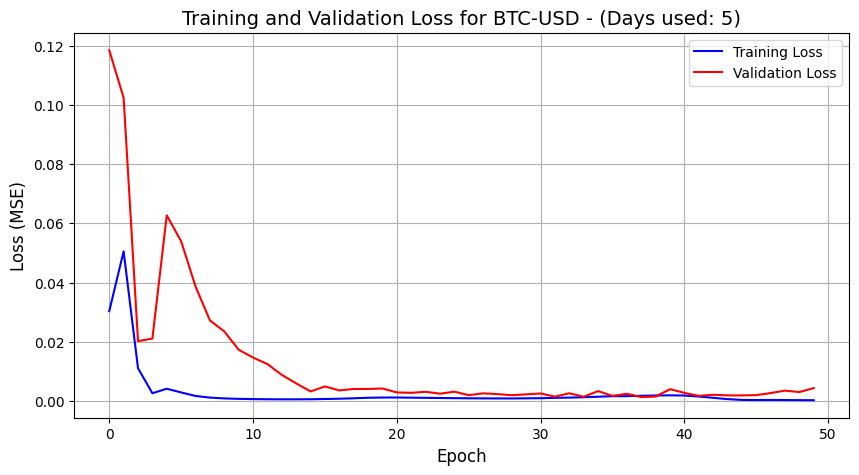

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  4253.7773
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  23232473.659052
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 4820.0076
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 4.23%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

⚠️ Decent — still usable, but some forecasts may deviate noticeably.

🖼️ 1/2: Generating Full Historical Plot...


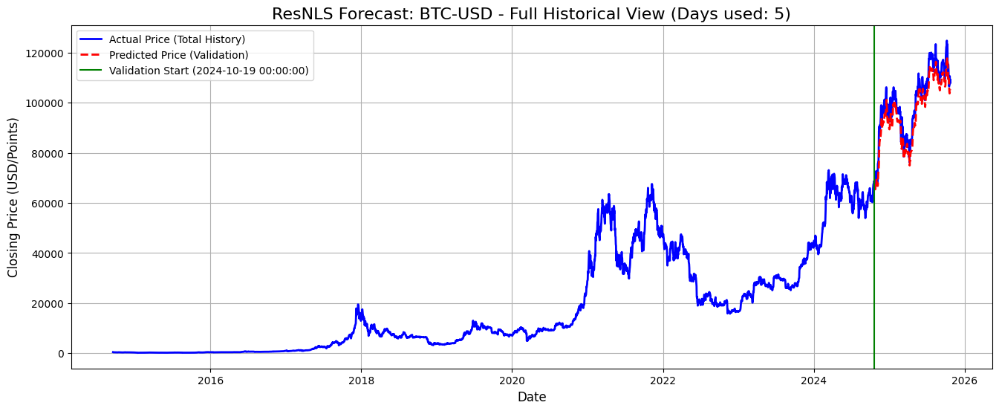

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


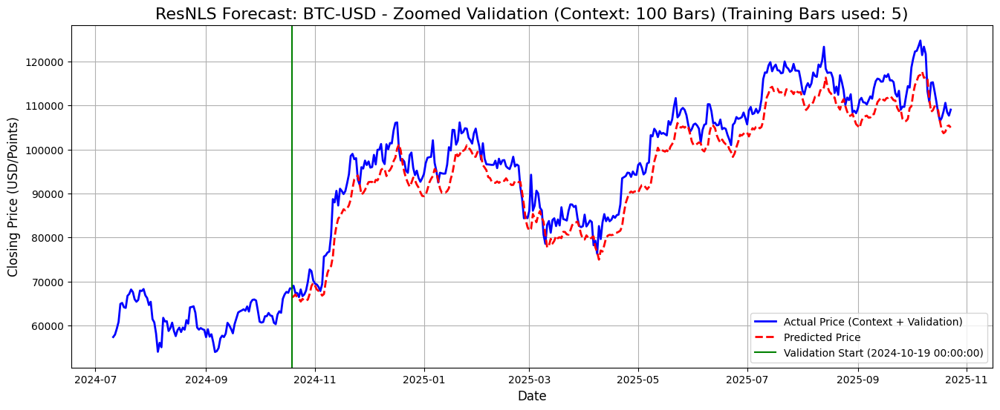

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.37% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-03-10 00:00: BUY @ 80597.15 (Pred. Ret: 0.07%)
👋 2025-03-11 00:00: SELL @ 78523.88 (Pred. Ret: -1.05%)
✅ Threshold None (0.00%) → ARR: -1.76%, Total Return: -2.57%, Buys: 1
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    1         -2.57               -1.76     
0.10           0         0.00                0.

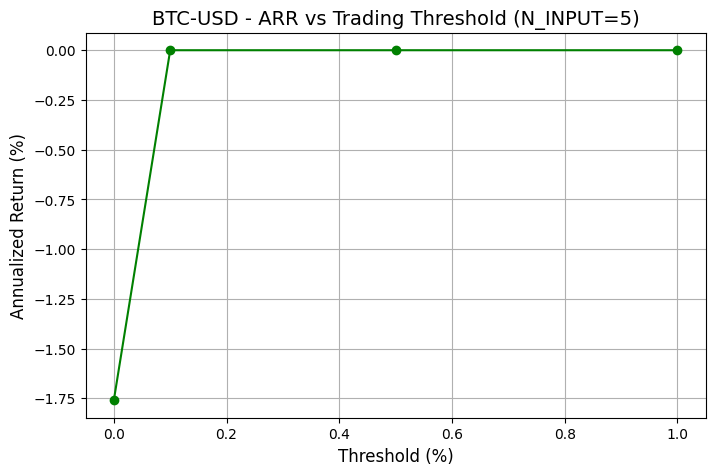

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fit

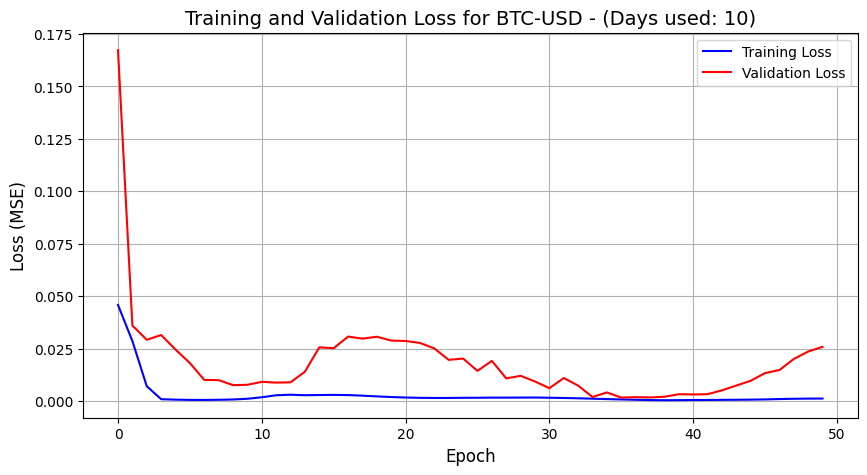

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  10688.7983
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  137247520.166246
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 11715.2687
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 10.24%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


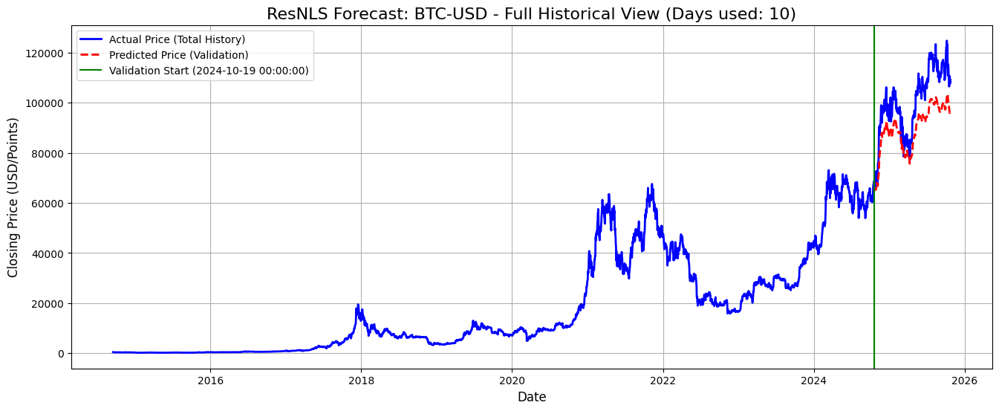

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


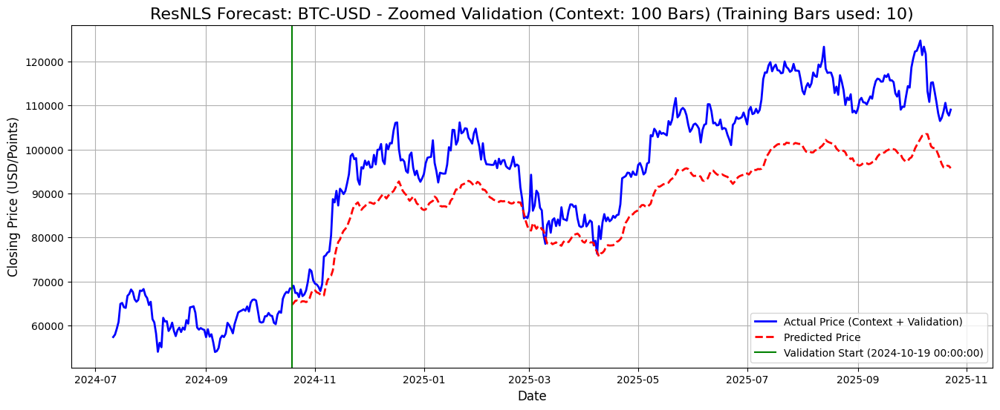

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.37% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-03-11 00:00: BUY @ 78523.88 (Pred. Ret: 0.13%)
👋 2025-03-12 00:00: SELL @ 82857.38 (Pred. Ret: -5.10%)
✅ Threshold None (0.00%) → ARR: 3.73%, Total Return: 5.52%, Buys: 1
🚀 Running backtest for threshold = 0.10%
🛒 2025-03-11 00:00: BUY @ 78523.88 (Pred. Ret: 0.13%)
👋 2025-03-12 00:00: SELL @ 82857.38 (Pred. Ret: -5.10%)
✅ Threshold 0.10% → ARR: 3.73%, Total Return: 5.52%, Buys: 1
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
--------------------------------------------------------

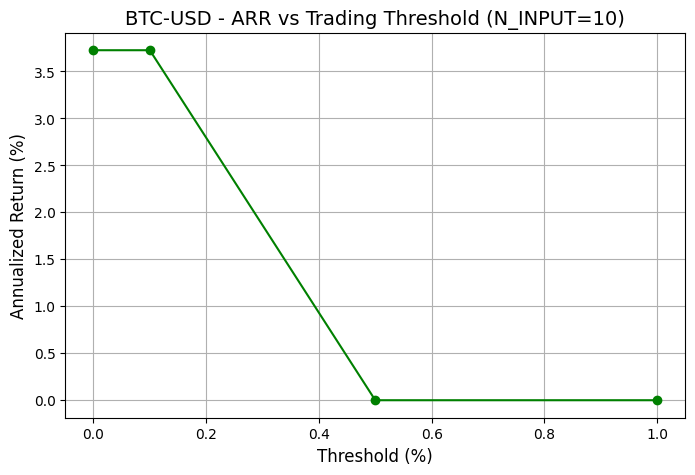

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fi

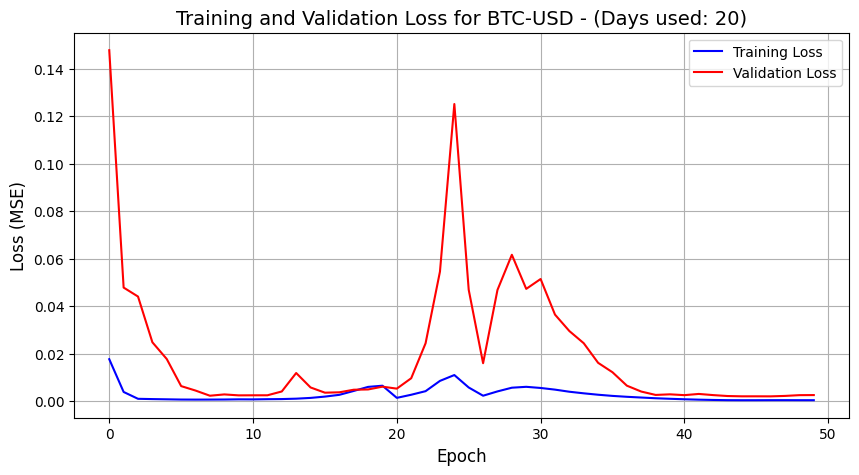

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  2864.9614
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  13278876.117572
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 3644.0192
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 2.78%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

✅ Very good — the model is quite reliable for short-term forecasts.

🖼️ 1/2: Generating Full Historical Plot...


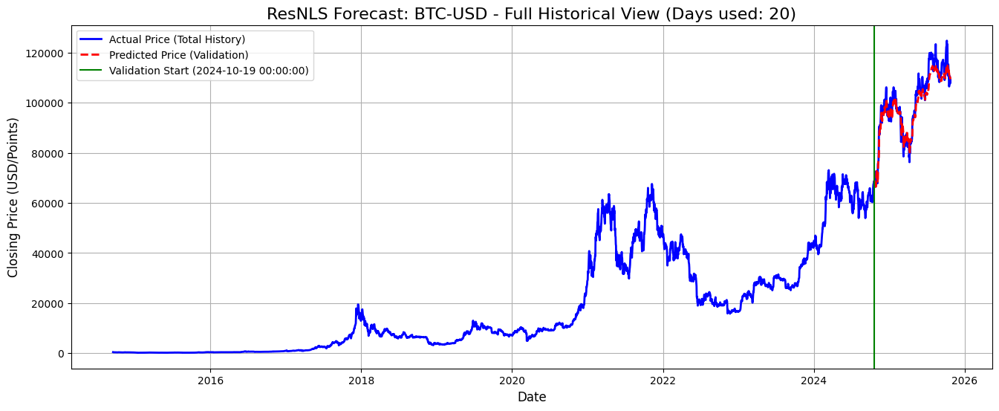

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


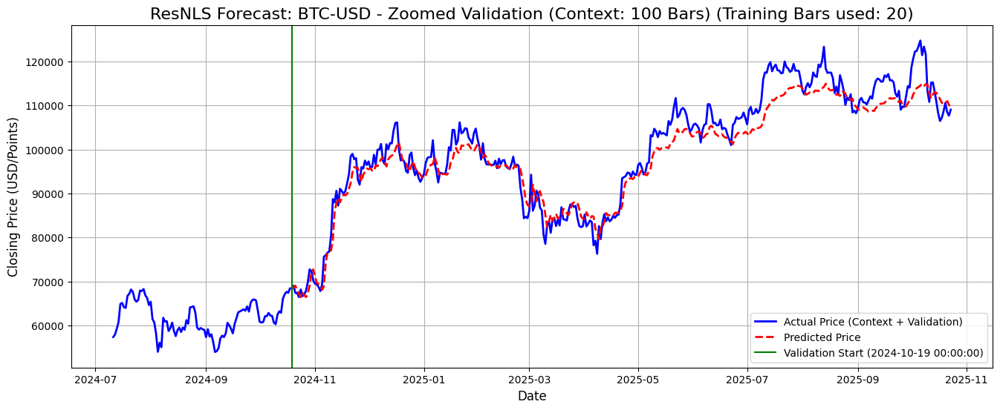

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.37% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2024-10-20 00:00: BUY @ 68364.18 (Pred. Ret: 0.37%)
👋 2024-10-23 00:00: SELL @ 67362.38 (Pred. Ret: -0.25%)
🛒 2024-10-26 00:00: BUY @ 66628.73 (Pred. Ret: 0.26%)
👋 2024-10-27 00:00: SELL @ 67023.48 (Pred. Ret: -0.89%)
🛒 2024-10-31 00:00: BUY @ 72335.05 (Pred. Ret: 0.54%)
👋 2024-11-06 00:00: SELL @ 69358.50 (Pred. Ret: -0.58%)
🛒 2024-11-08 00:00: BUY @ 75902.84 (Pred. Ret: 0.84%)
👋 2024-11-11 00:00: SELL @ 80471.41 (Pred. Ret: -1.06%)
🛒 2024-11-15 00:00: BUY @ 87284.18 (Pred. Ret: 0.81%)
👋 2024-11-16 00:00: SELL @ 91064.37 (Pred. Ret: -2.28%)
🛒 2024-11-26 00:00: BUY @ 93087.28 (Pred. Ret: 1.06%)
👋 2024-11-28 00:00: SELL @ 95954.95 (Pred. Ret: -1.81%)
🛒 2024-12-20 00:00: BUY @ 97484.70 (Pred. Ret: 0.07%)
👋 2024-12-21 00:00: SELL @ 97756.20 (Pred. Ret: -0.70%)
🛒 2024-12-23 00:00: BUY @ 95099.39

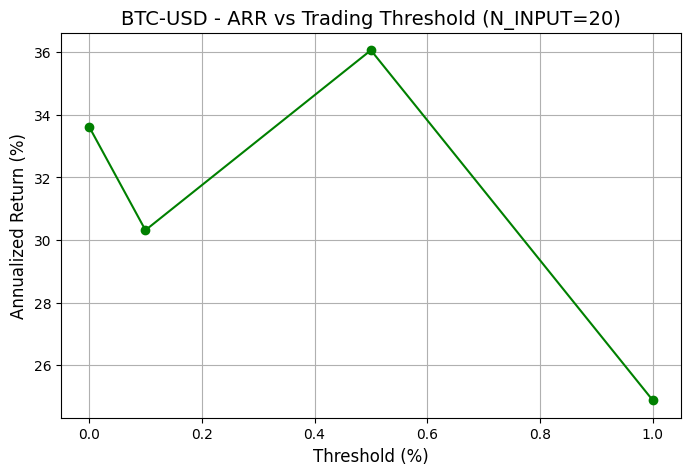

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fi

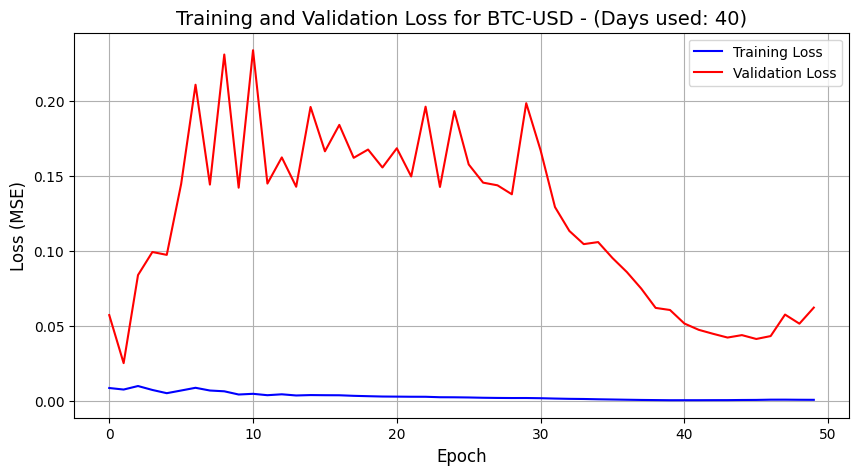

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  16363.5546
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  330748726.453029
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 18186.4985
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 15.65%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


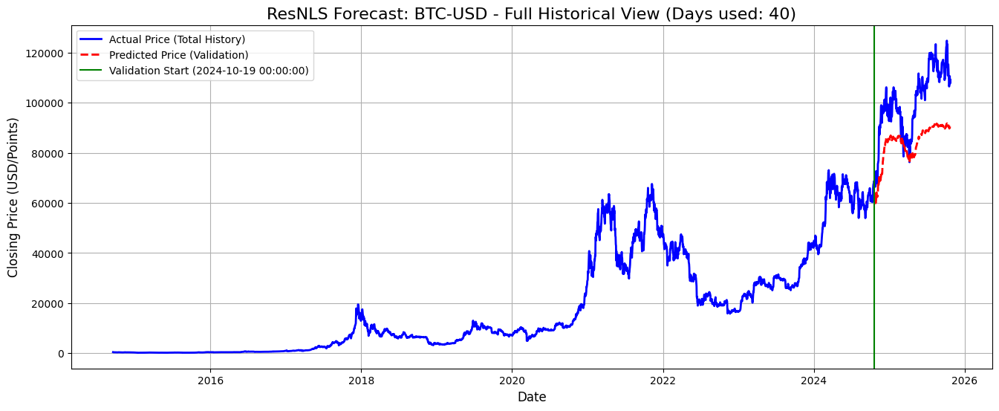

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


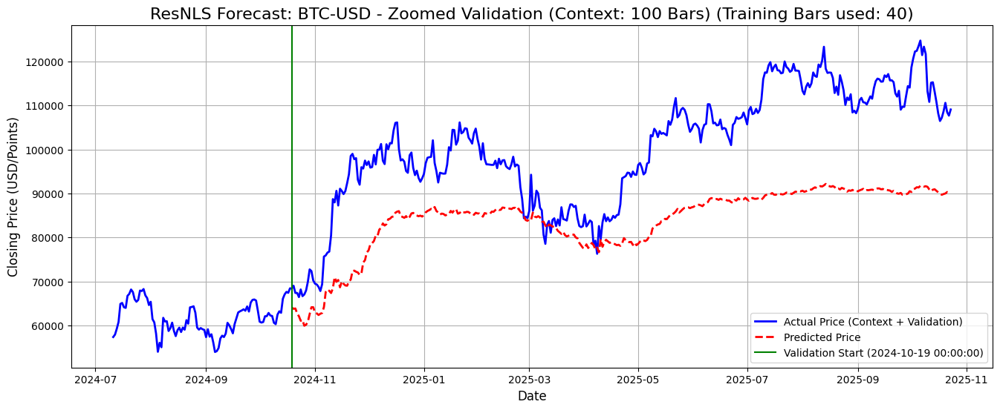

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.39% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-03-10 00:00: BUY @ 80597.15 (Pred. Ret: 2.63%)
👋 2025-03-13 00:00: SELL @ 83724.92 (Pred. Ret: -1.16%)
🛒 2025-03-14 00:00: BUY @ 81066.99 (Pred. Ret: 1.74%)
👋 2025-03-15 00:00: SELL @ 83968.41 (Pred. Ret: -1.87%)
🛒 2025-04-09 00:00: BUY @ 76273.56 (Pred. Ret: 0.49%)
👋 2025-04-10 00:00: SELL @ 82565.98 (Pred. Ret: -3.60%)
✅ Threshold None (0.00%) → ARR: 10.95%, Total Return: 16.48%, Buys: 3
🚀 Running backtest for threshold = 0.10%
🛒 2025-03-10 00:00: BUY @ 80597.15 (Pred. Ret: 2.63%)
👋 2025-03-13 00:00: SELL @ 83724.92 (Pred. Ret: -1.16%)
🛒 2025-03-14 00:00: BUY @ 81066.99 (Pred. Ret: 1.74%)
👋 2025-03-15 00:00: SELL @ 83968.41 (Pred. Ret: -1.87%)
🛒 2025-04-09 00:00: BUY @ 76273.56 (Pred. Ret: 0.49%)
👋 2025-04-10 00:00: SELL @ 82565.98 (Pred. Ret: -3.60%)
✅ Threshold 0.10% → ARR: 10.95%, 

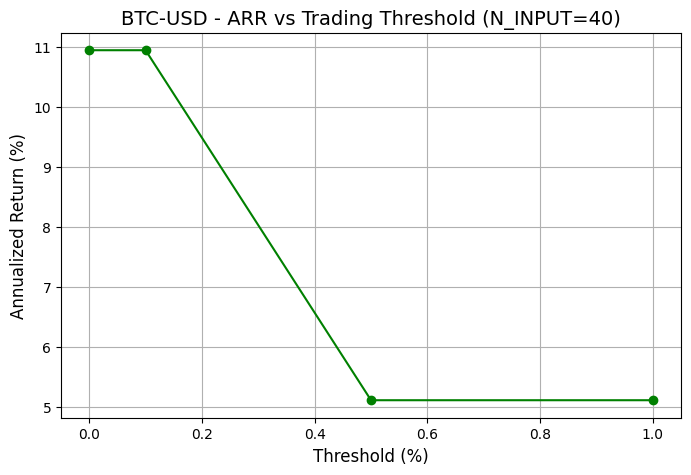

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: BTC-USD (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for BTC-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for BTC-USD...
⚖️ Scaler fi

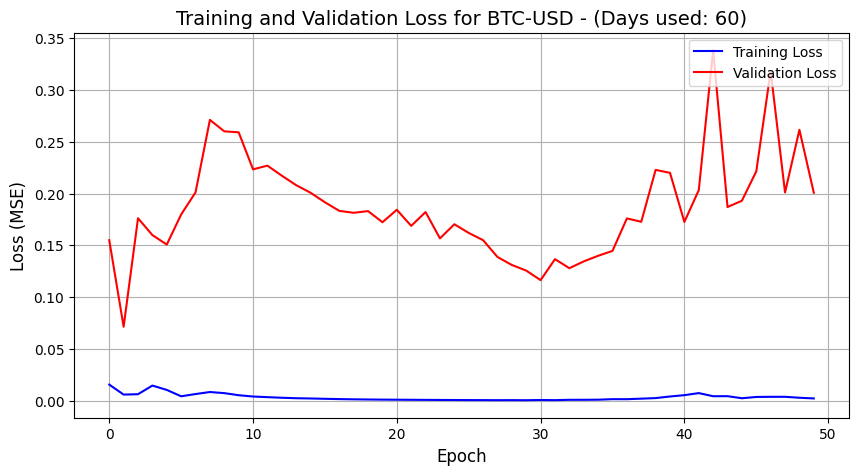

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: BTC-USD
     📏 MAE:  30611.3741
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  1066973936.699008
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 32664.5670
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 30.30%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


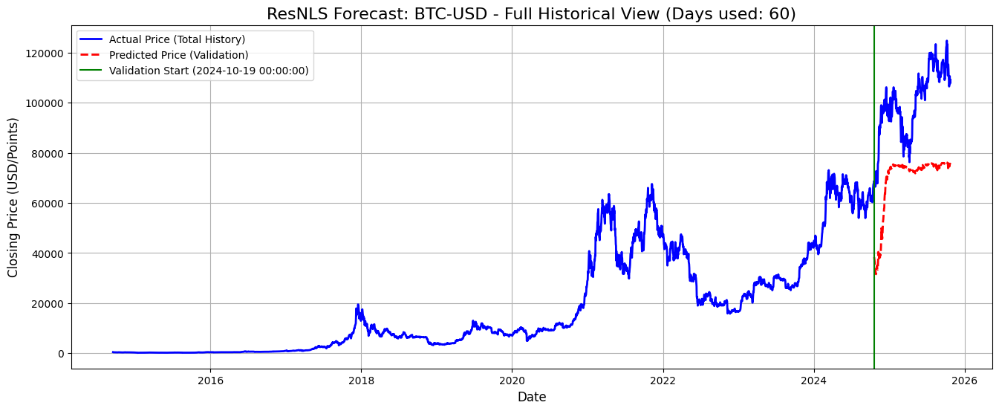

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


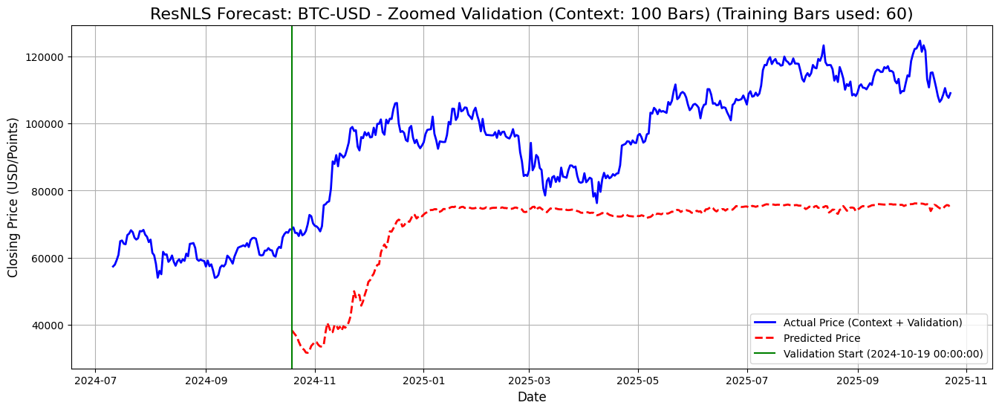

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 37.39% over 370 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

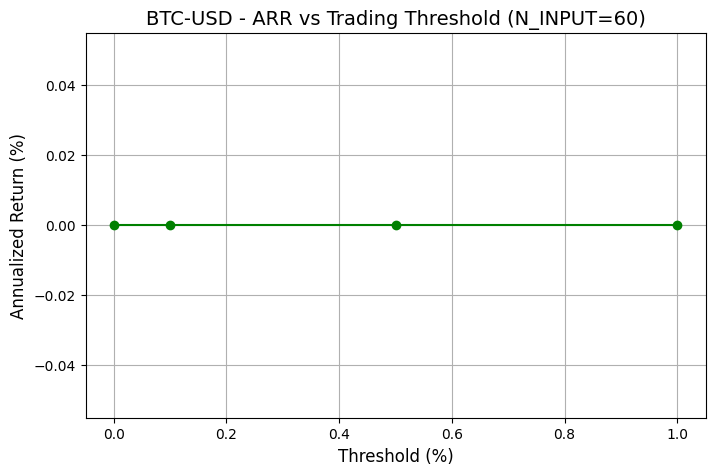

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for BTC-USD.


In [19]:
TICKER = 'BTC-USD'
all_n_forecasts(TICKER)

# ETH USD

🔥 Starting all N-input forecast experiments for Ticker: ETH-USD...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fitte

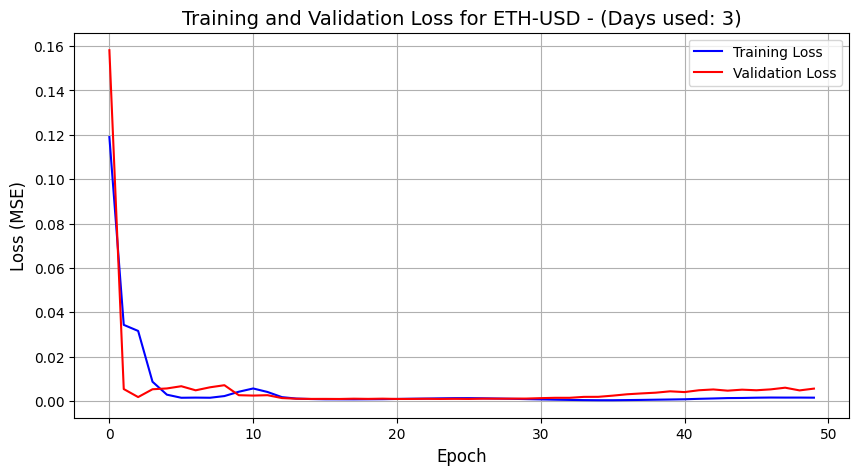

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  242.5769
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  125986.813140
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 354.9462
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 6.59%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


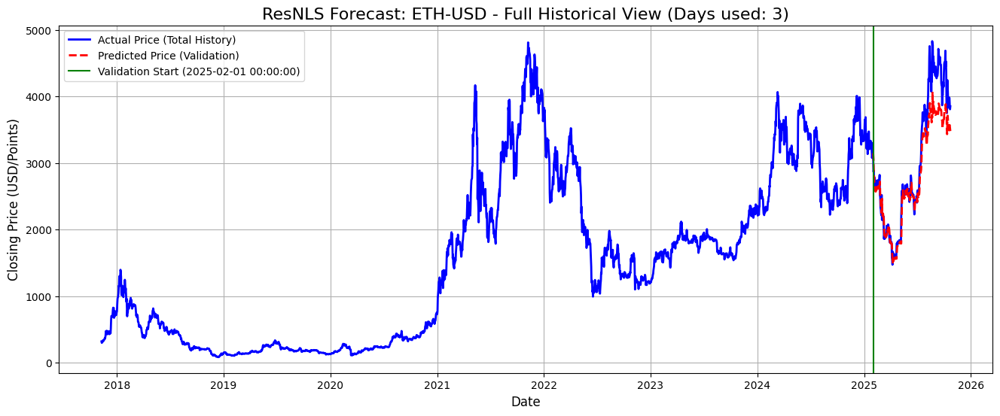

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


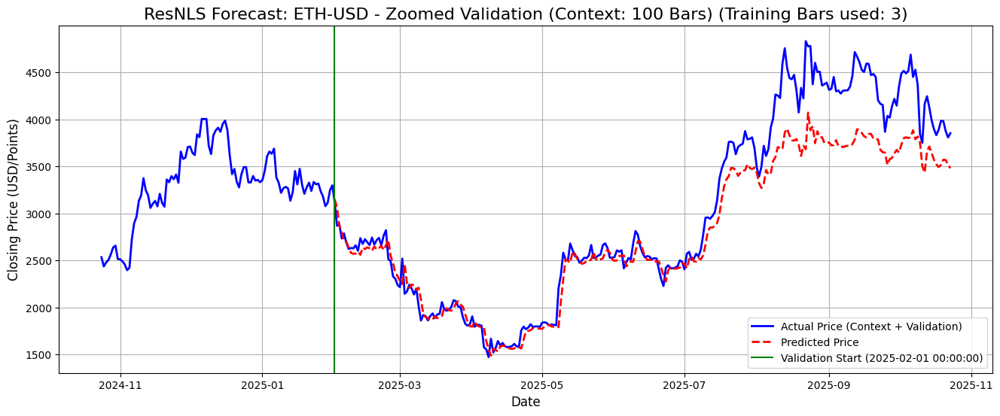

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.91% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-03 00:00: BUY @ 2868.08 (Pred. Ret: 0.03%)
👋 2025-02-04 00:00: SELL @ 2883.82 (Pred. Ret: -2.87%)
🛒 2025-02-25 00:00: BUY @ 2514.21 (Pred. Ret: 1.34%)
👋 2025-02-26 00:00: SELL @ 2493.38 (Pred. Ret: -0.78%)
🛒 2025-02-27 00:00: BUY @ 2331.51 (Pred. Ret: 1.75%)
👋 2025-03-03 00:00: SELL @ 2519.53 (Pred. Ret: -2.24%)
🛒 2025-03-04 00:00: BUY @ 2145.65 (Pred. Ret: 5.21%)
👋 2025-03-12 00:00: SELL @ 1919.66 (Pred. Ret: -1.22%)
🛒 2025-03-14 00:00: BUY @ 1863.00 (Pred. Ret: 0.04%)
👋 2025-03-15 00:00: SELL @ 1909.53 (Pred. Ret: -1.66%)
🛒 2025-03-21 00:00: BUY @ 1981.85 (Pred. Ret: 0.41%)
👋 2025-03-23 00:00: SELL @ 1979.98 (Pred. Ret: -0.69%)
🛒 2025-03-27 00:00: BUY @ 2008.94 (Pred. Ret: 1.11%)
👋 2025-03-31 00:00: SELL @ 1806.32 (Pred. Ret: -0.29%)
🛒 2025-04-03 00:00: BUY @ 1794.98 (Pred. Ret: 0.

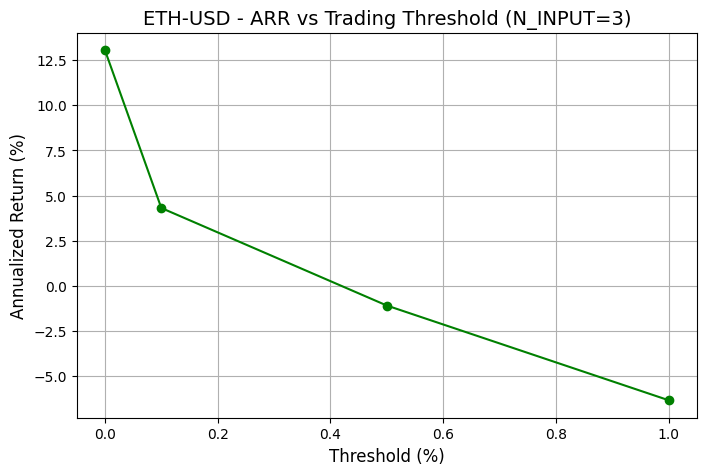

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fitted

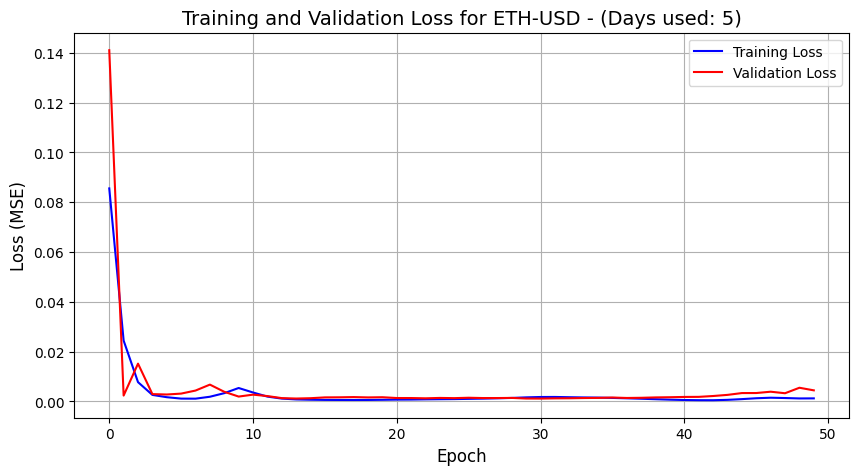

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  228.4603
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  99575.262329
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 315.5555
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 6.85%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


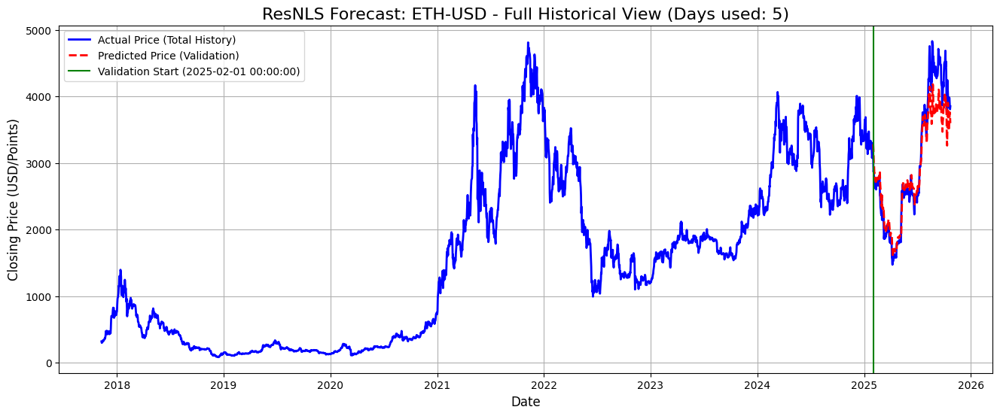

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


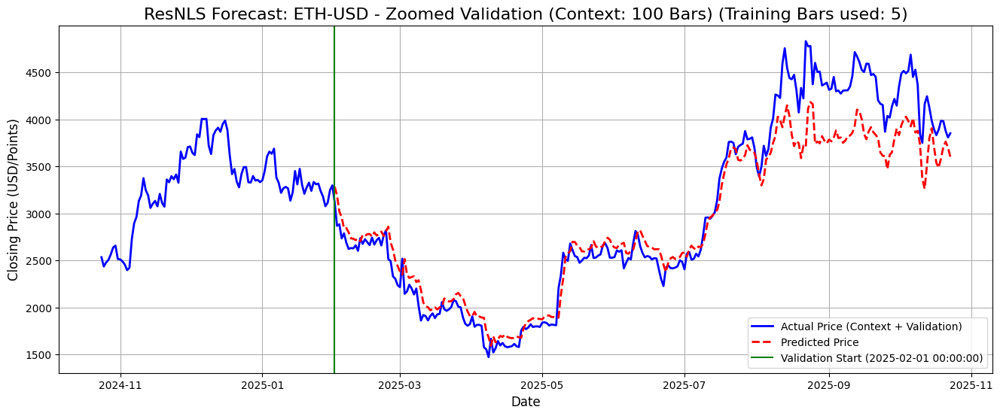

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.91% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-02 00:00: BUY @ 3118.61 (Pred. Ret: 2.40%)
👋 2025-03-03 00:00: SELL @ 2519.53 (Pred. Ret: -0.24%)
🛒 2025-03-04 00:00: BUY @ 2145.65 (Pred. Ret: 9.59%)
👋 2025-05-09 00:00: SELL @ 2206.13 (Pred. Ret: -3.18%)
🛒 2025-05-12 00:00: BUY @ 2510.29 (Pred. Ret: 2.51%)
👋 2025-06-11 00:00: SELL @ 2813.74 (Pred. Ret: -0.10%)
🛒 2025-06-12 00:00: BUY @ 2773.60 (Pred. Ret: 1.70%)
👋 2025-07-11 00:00: SELL @ 2954.83 (Pred. Ret: -1.35%)
🛒 2025-07-13 00:00: BUY @ 2942.85 (Pred. Ret: 1.10%)
👋 2025-07-16 00:00: SELL @ 3139.89 (Pred. Ret: -0.46%)
✅ Threshold None (0.00%) → ARR: 5.54%, Total Return: 5.83%, Buys: 5
🚀 Running backtest for threshold = 0.10%
🛒 2025-02-02 00:00: BUY @ 3118.61 (Pred. Ret: 2.40%)
👋 2025-03-03 00:00: SELL @ 2519.53 (Pred. Ret: -0.24%)
🛒 2025-03-04 00:00: BUY @ 2145.65 (Pred. Ret: 9

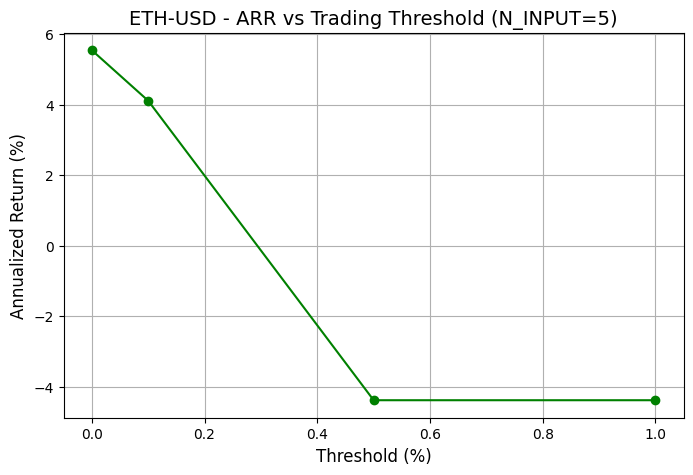

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fit

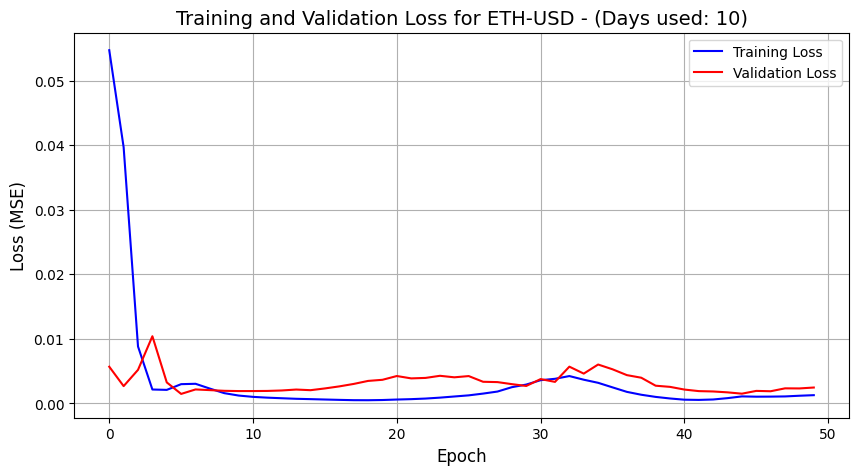

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  192.1285
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  55015.653820
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 234.5542
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 6.75%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


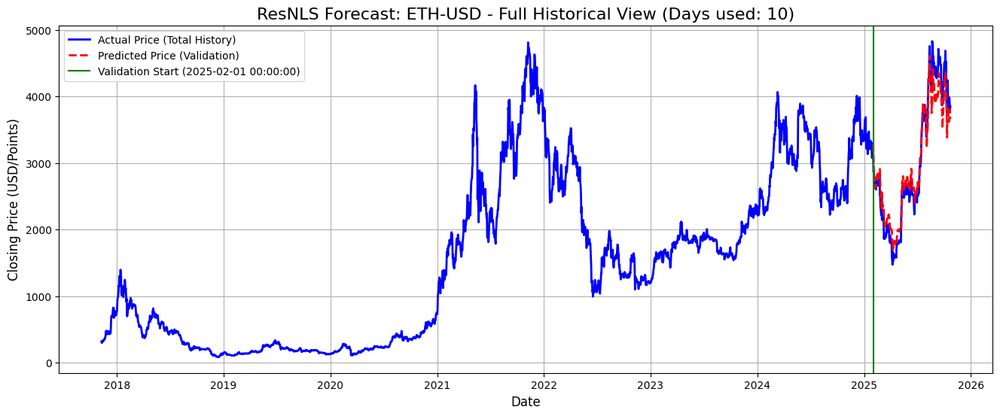

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


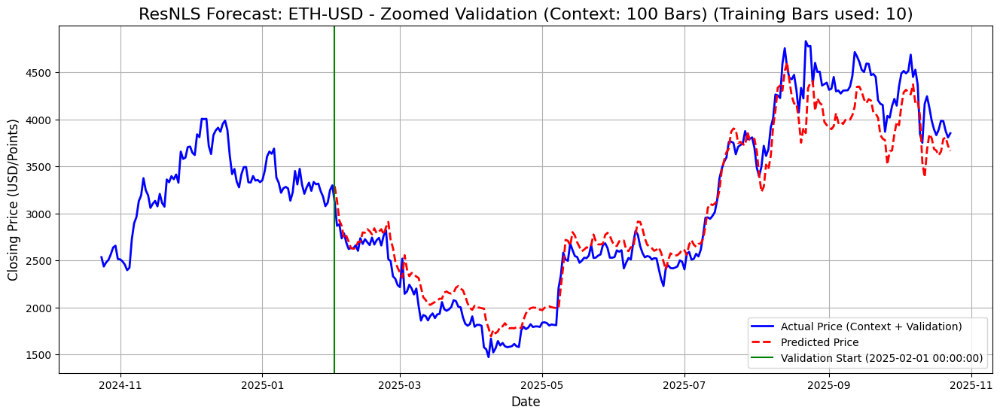

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.91% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-02 00:00: BUY @ 3118.61 (Pred. Ret: 0.55%)
👋 2025-02-04 00:00: SELL @ 2883.82 (Pred. Ret: -0.53%)
🛒 2025-02-07 00:00: BUY @ 2688.90 (Pred. Ret: 0.38%)
👋 2025-02-09 00:00: SELL @ 2632.58 (Pred. Ret: -0.23%)
🛒 2025-02-10 00:00: BUY @ 2628.65 (Pred. Ret: 0.02%)
👋 2025-07-27 00:00: SELL @ 3741.26 (Pred. Ret: -0.42%)
🛒 2025-07-30 00:00: BUY @ 3793.58 (Pred. Ret: 0.00%)
👋 2025-07-31 00:00: SELL @ 3808.25 (Pred. Ret: -0.41%)
🛒 2025-08-08 00:00: BUY @ 3914.11 (Pred. Ret: 0.11%)
👋 2025-08-13 00:00: SELL @ 4590.66 (Pred. Ret: -1.68%)
✅ Threshold None (0.00%) → ARR: 48.64%, Total Return: 51.71%, Buys: 5
🚀 Running backtest for threshold = 0.10%
🛒 2025-02-02 00:00: BUY @ 3118.61 (Pred. Ret: 0.55%)
👋 2025-02-04 00:00: SELL @ 2883.82 (Pred. Ret: -0.53%)
🛒 2025-02-07 00:00: BUY @ 2688.90 (Pred. Ret:

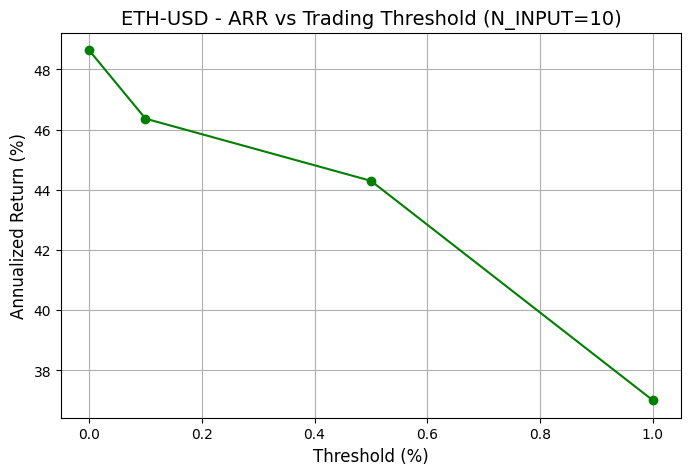

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fi

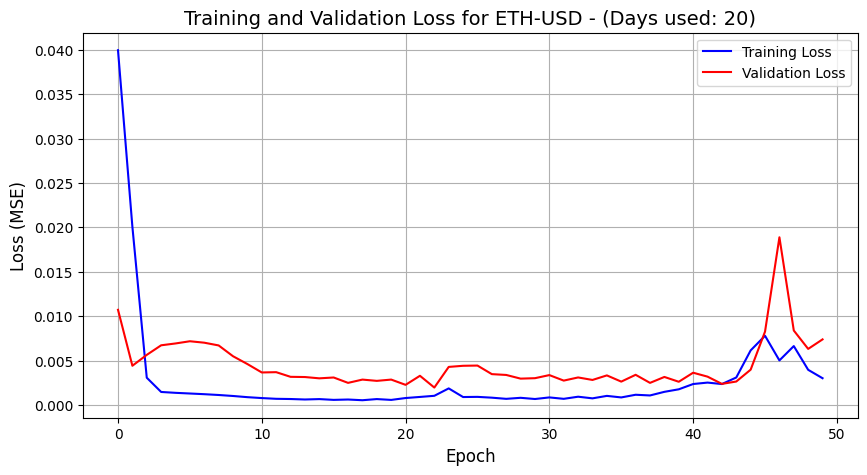

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  301.4469
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  165053.211462
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 406.2674
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 8.62%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


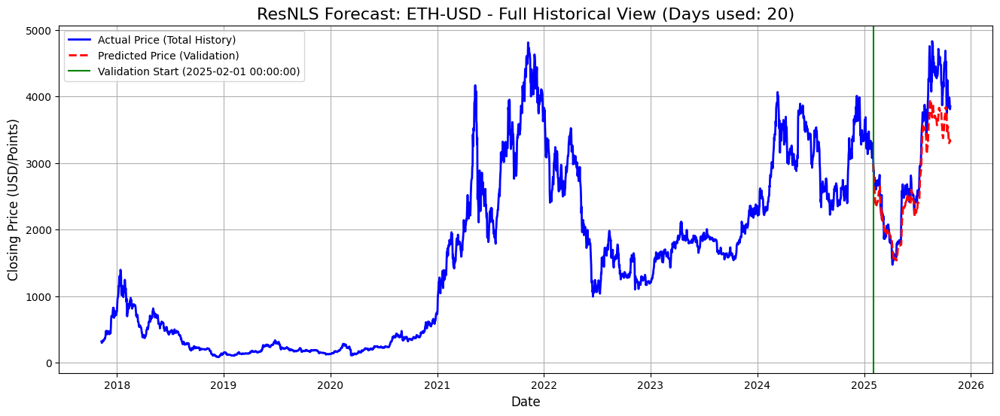

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


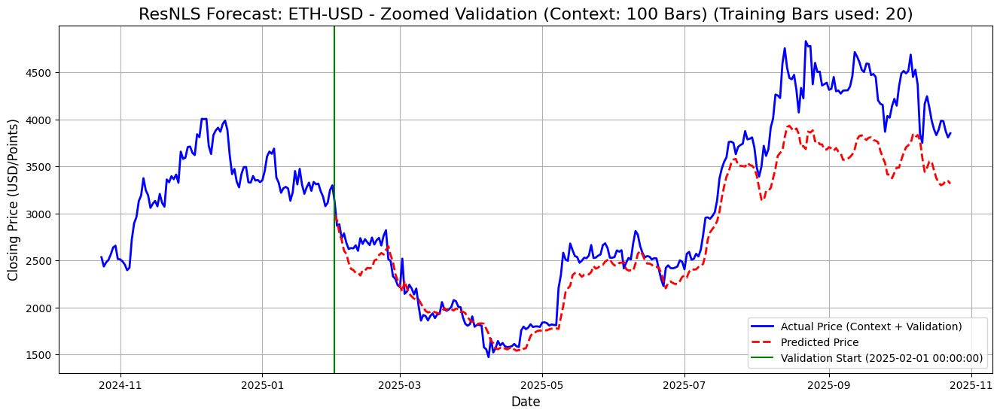

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.91% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-25 00:00: BUY @ 2514.21 (Pred. Ret: 1.63%)
👋 2025-02-26 00:00: SELL @ 2493.38 (Pred. Ret: -0.34%)
🛒 2025-02-27 00:00: BUY @ 2331.51 (Pred. Ret: 1.06%)
👋 2025-02-28 00:00: SELL @ 2305.56 (Pred. Ret: -0.73%)
🛒 2025-03-04 00:00: BUY @ 2145.65 (Pred. Ret: 2.77%)
👋 2025-03-05 00:00: SELL @ 2169.99 (Pred. Ret: -1.12%)
🛒 2025-03-10 00:00: BUY @ 2015.43 (Pred. Ret: 1.35%)
👋 2025-03-20 00:00: SELL @ 2057.95 (Pred. Ret: -3.06%)
🛒 2025-03-22 00:00: BUY @ 1964.94 (Pred. Ret: 1.16%)
👋 2025-03-24 00:00: SELL @ 2005.72 (Pred. Ret: -1.85%)
🛒 2025-03-29 00:00: BUY @ 1895.55 (Pred. Ret: 2.36%)
👋 2025-04-02 00:00: SELL @ 1905.48 (Pred. Ret: -3.09%)
🛒 2025-04-03 00:00: BUY @ 1794.98 (Pred. Ret: 1.52%)
👋 2025-04-10 00:00: SELL @ 1668.20 (Pred. Ret: -2.74%)
🛒 2025-04-11 00:00: BUY @ 1522.47 (Pred. Ret: 2.

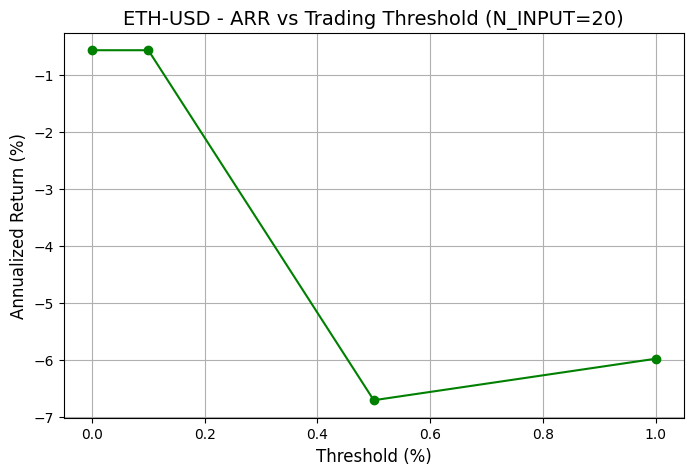

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fi

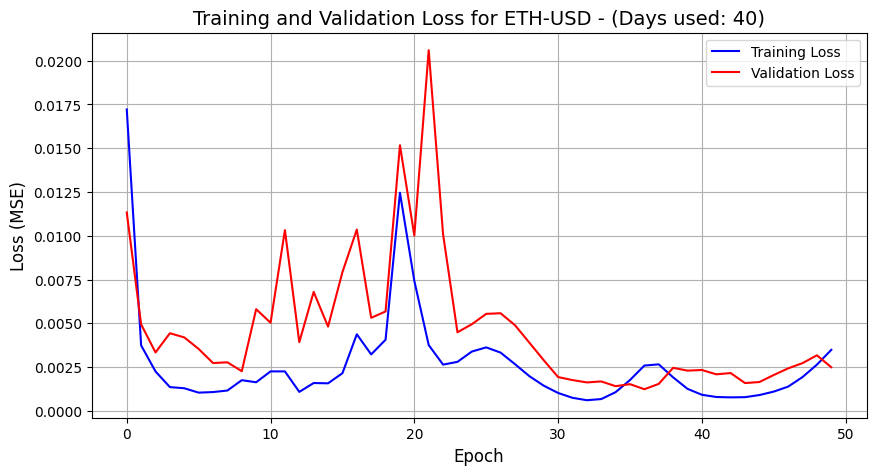

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  186.5213
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  55745.266228
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 236.1044
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 7.37%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


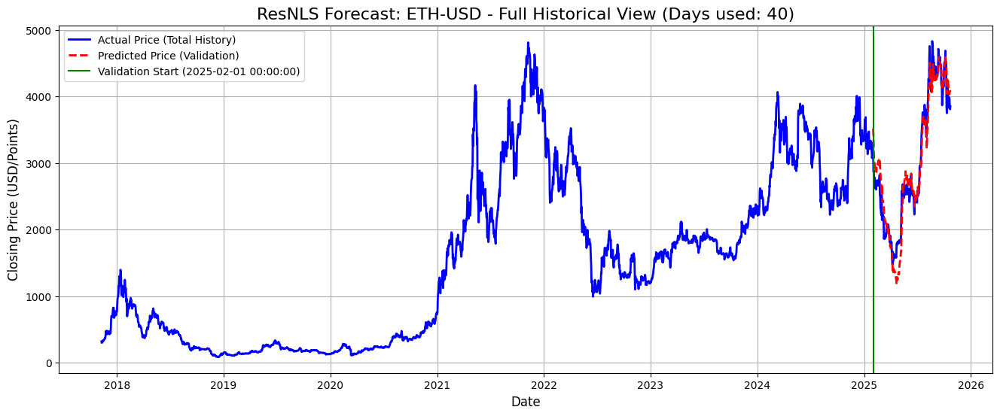

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


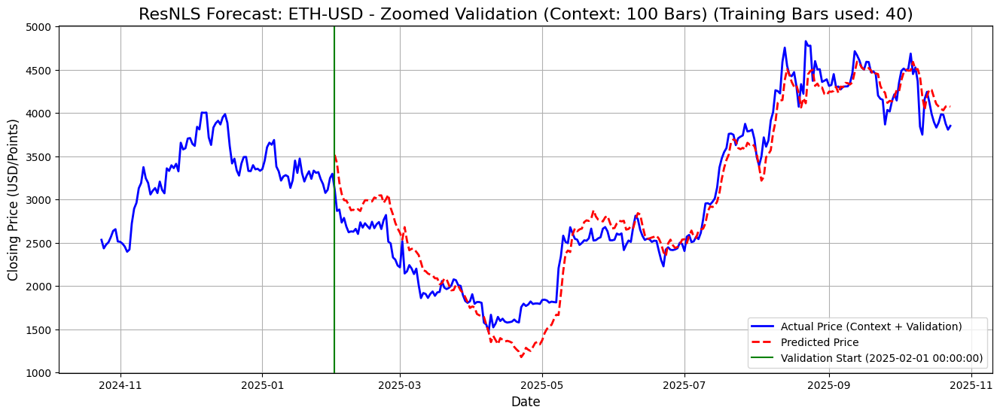

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.91% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-01 00:00: BUY @ 3298.82 (Pred. Ret: 6.61%)
👋 2025-03-23 00:00: SELL @ 1979.98 (Pred. Ret: -1.49%)
🛒 2025-05-15 00:00: BUY @ 2610.03 (Pred. Ret: 2.14%)
👋 2025-07-10 00:00: SELL @ 2770.74 (Pred. Ret: -1.61%)
🛒 2025-09-07 00:00: BUY @ 4274.17 (Pred. Ret: 0.58%)
👋 2025-09-13 00:00: SELL @ 4714.70 (Pred. Ret: -2.56%)
🛒 2025-09-23 00:00: BUY @ 4203.02 (Pred. Ret: 2.66%)
👋 2025-10-03 00:00: SELL @ 4486.93 (Pred. Ret: -0.41%)
🛒 2025-10-05 00:00: BUY @ 4489.05 (Pred. Ret: 0.02%)
👋 2025-10-06 00:00: SELL @ 4515.30 (Pred. Ret: -0.53%)
🛒 2025-10-08 00:00: BUY @ 4451.11 (Pred. Ret: 1.20%)
👋 2025-10-09 00:00: SELL @ 4526.96 (Pred. Ret: -0.41%)
🛒 2025-10-10 00:00: BUY @ 4369.07 (Pred. Ret: 1.22%)
🔚 Last Bar: Close Out @ 3852.35
✅ Threshold None (0.00%) → ARR: -31.01%, Total Return: -32.32%, Buys: 7

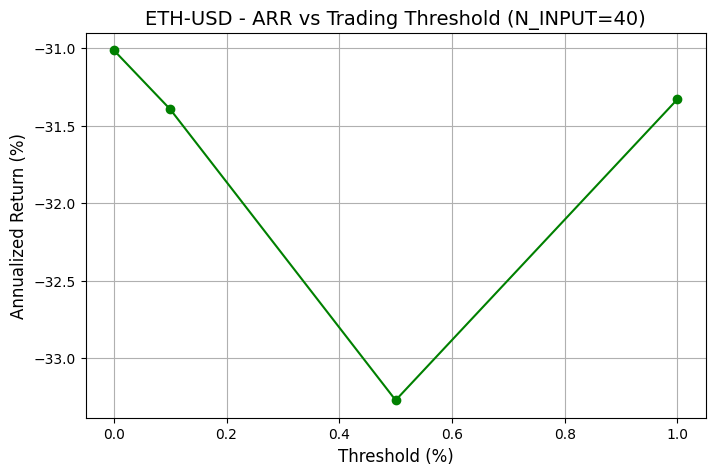

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: ETH-USD (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for ETH-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for ETH-USD...
⚖️ Scaler fi

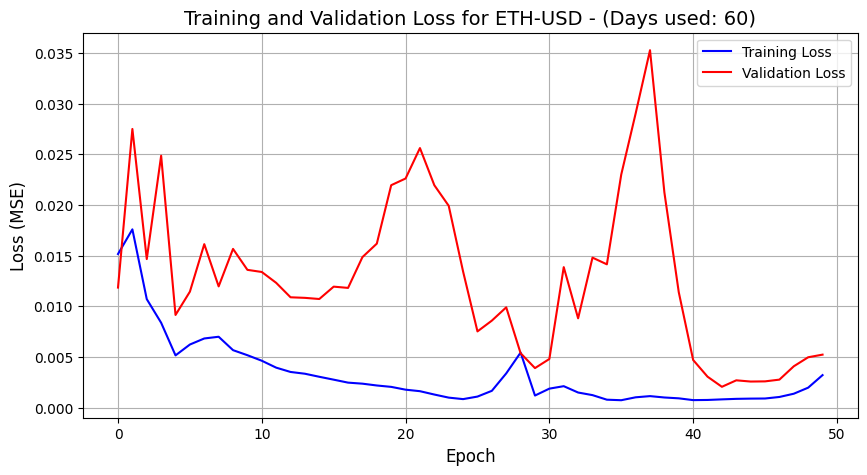

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: ETH-USD
     📏 MAE:  289.1374
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  116941.103785
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 341.9665
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 10.78%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


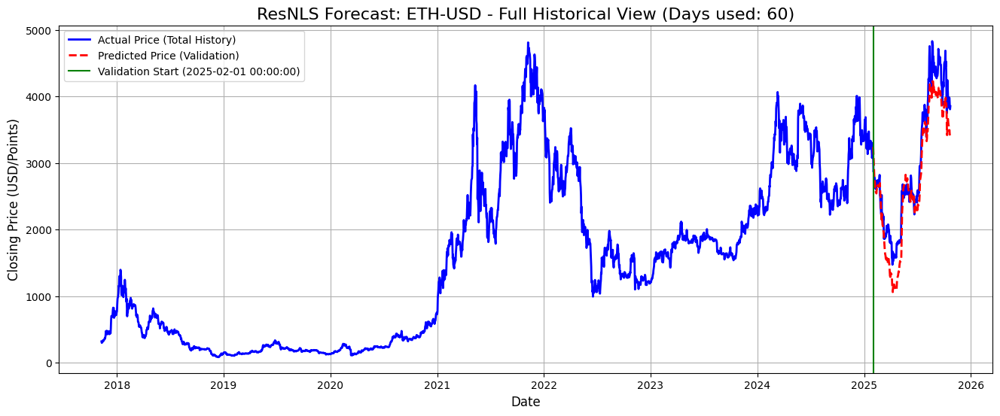

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


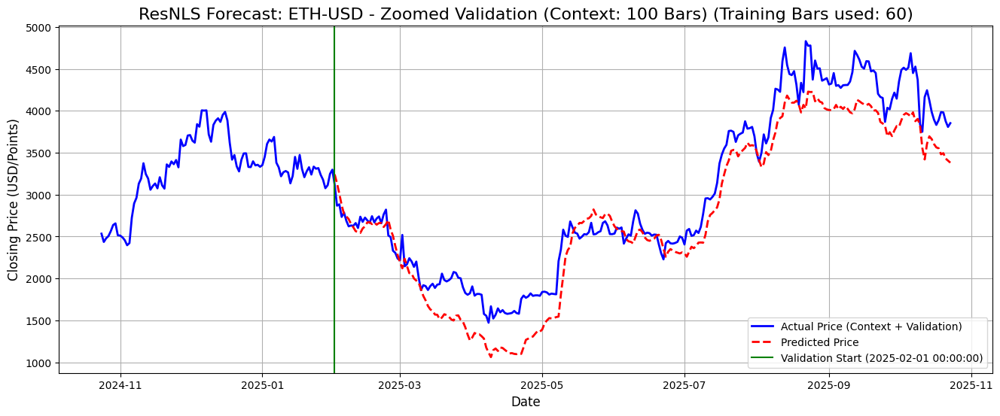

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 15.94% over 265 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-02-02 00:00: BUY @ 3118.61 (Pred. Ret: 0.55%)
👋 2025-02-04 00:00: SELL @ 2883.82 (Pred. Ret: -0.33%)
🛒 2025-02-05 00:00: BUY @ 2735.23 (Pred. Ret: 1.26%)
👋 2025-02-06 00:00: SELL @ 2787.66 (Pred. Ret: -1.70%)
🛒 2025-02-07 00:00: BUY @ 2688.90 (Pred. Ret: 0.77%)
👋 2025-02-09 00:00: SELL @ 2632.58 (Pred. Ret: -0.83%)
🛒 2025-02-25 00:00: BUY @ 2514.21 (Pred. Ret: 2.80%)
👋 2025-02-28 00:00: SELL @ 2305.56 (Pred. Ret: -1.16%)
🛒 2025-03-04 00:00: BUY @ 2145.65 (Pred. Ret: 0.12%)
👋 2025-03-05 00:00: SELL @ 2169.99 (Pred. Ret: -4.89%)
🛒 2025-05-16 00:00: BUY @ 2547.06 (Pred. Ret: 3.29%)
👋 2025-06-03 00:00: SELL @ 2607.20 (Pred. Ret: -1.02%)
🛒 2025-06-06 00:00: BUY @ 2416.46 (Pred. Ret: 2.26%)
👋 2025-06-07 00:00: SELL @ 2477.18 (Pred. Ret: -1.36%)
🛒 2025-06-20 00:00: BUY @ 2521.53 (Pred. Ret: 0.

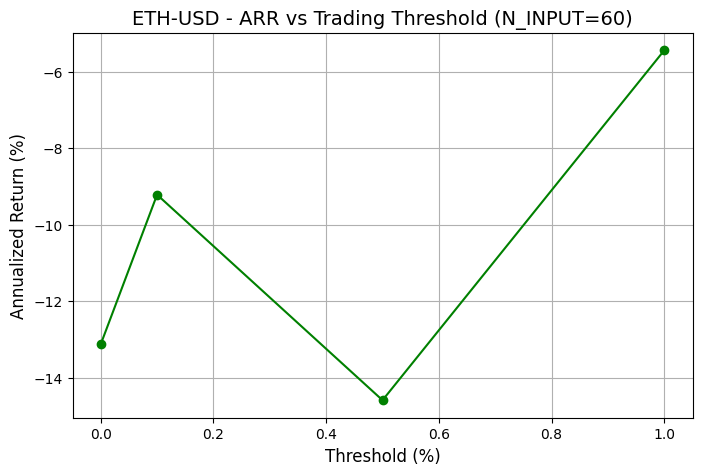

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for ETH-USD.


In [20]:
TICKER = 'ETH-USD'
all_n_forecasts(TICKER)

# SOL USD

🔥 Starting all N-input forecast experiments for Ticker: SOL-USD...
📄 Defined input lengths (N_INPUT) to iterate over: [3, 5, 10, 20, 40, 60]

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 1/6 with N_INPUT = 3
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=3).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 3

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fitte

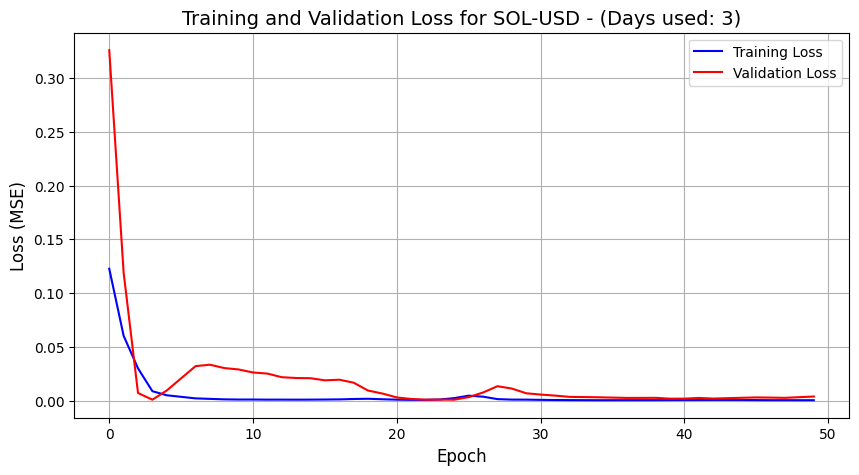

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  14.9121
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  272.599670
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 16.5106
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 8.21%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


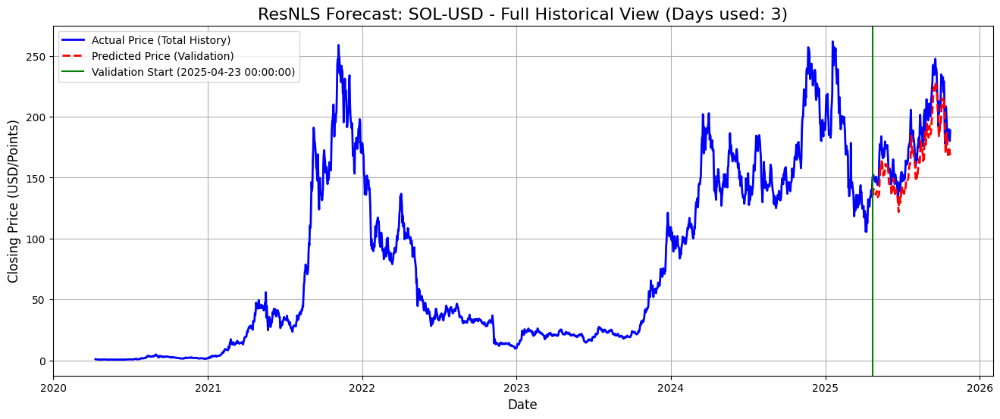

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


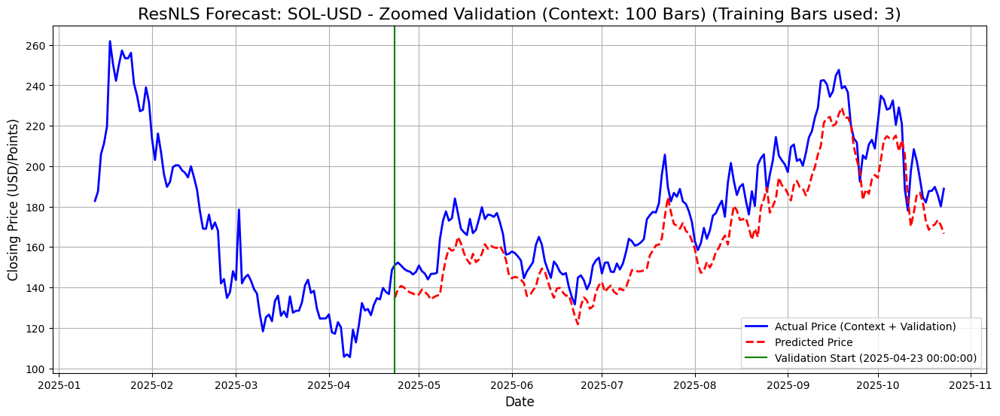

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.66% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

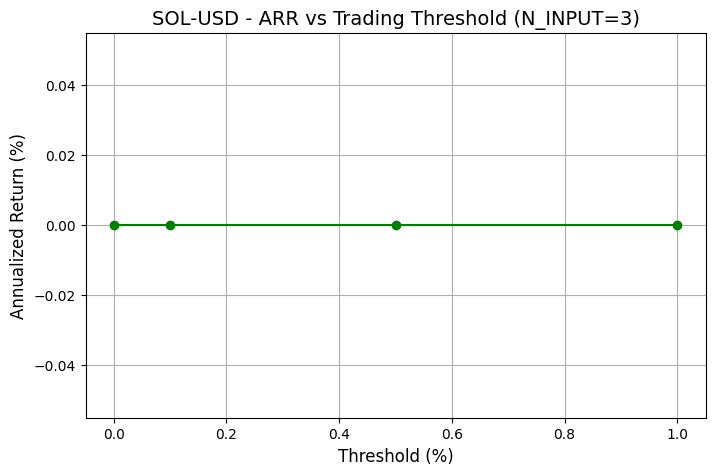

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 3.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 2/6 with N_INPUT = 5
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=5).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 5

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fitted

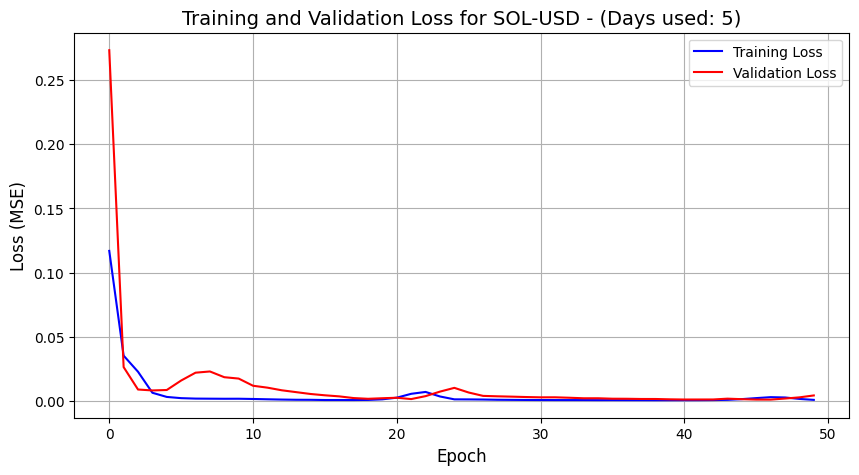

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  15.3916
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  288.229332
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 16.9773
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 8.47%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


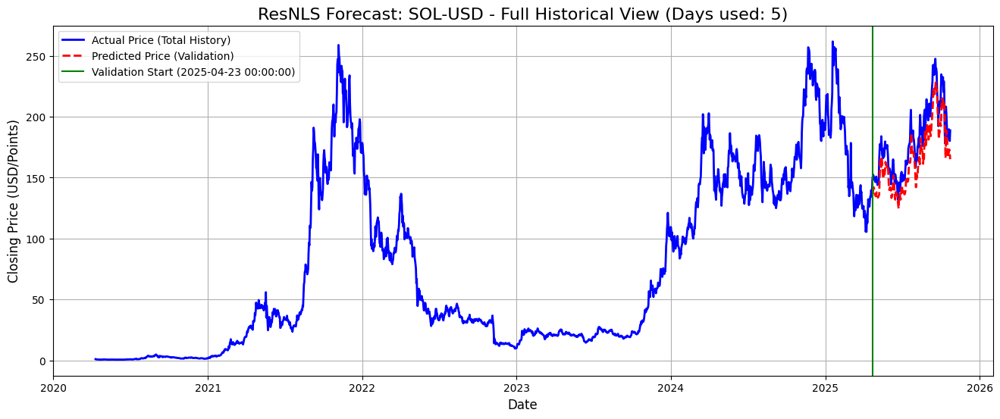

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


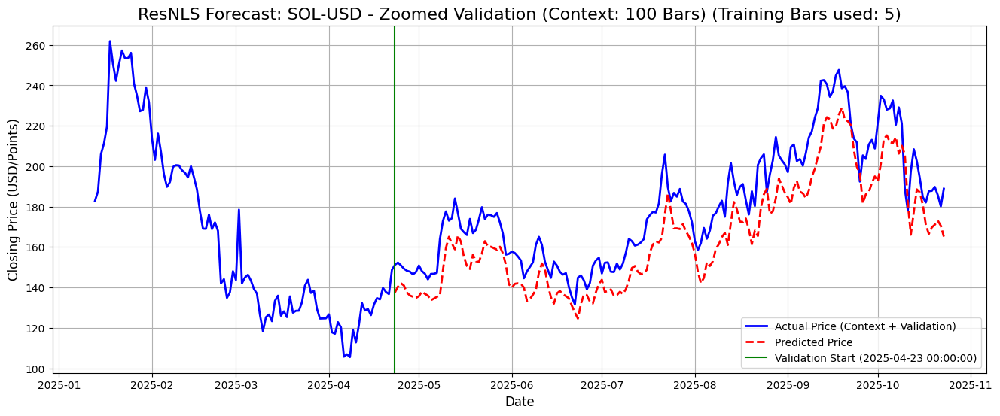

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.66% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

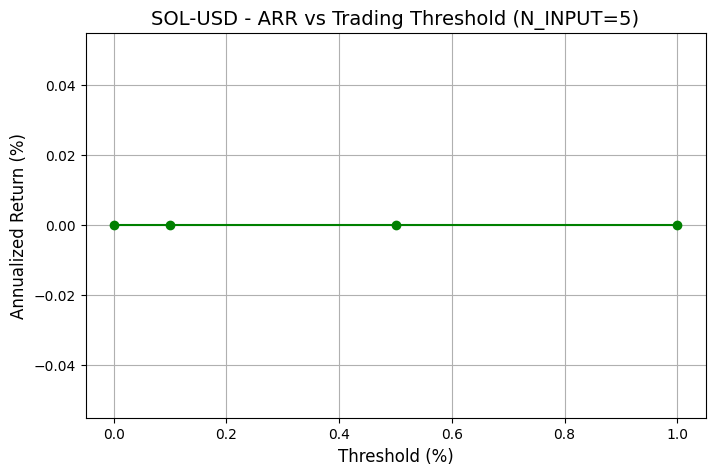

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 5.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 3/6 with N_INPUT = 10
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=10).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 10

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fit

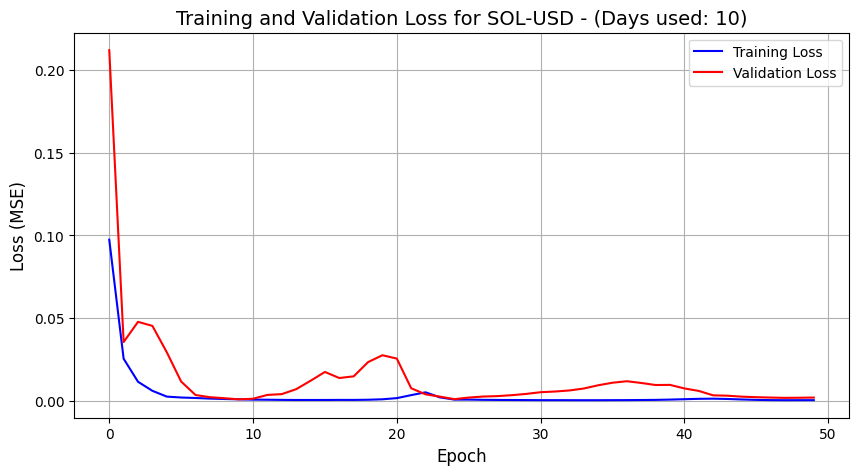

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  10.3639
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  147.269302
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 12.1355
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 6.18%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


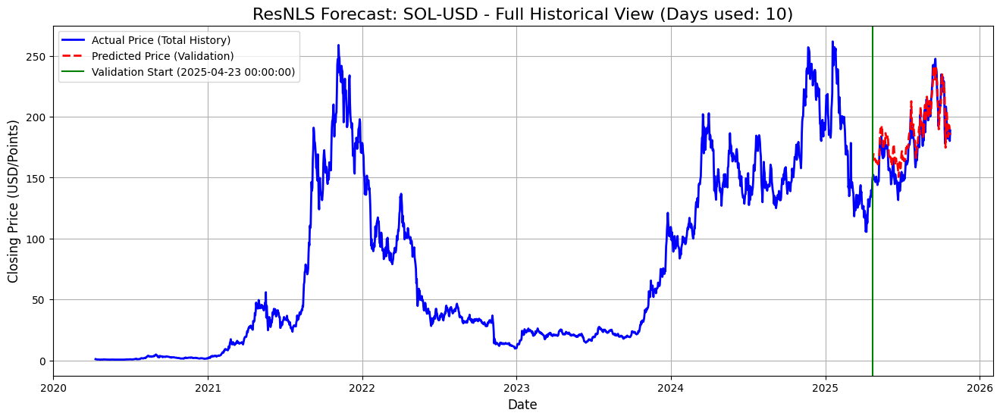

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


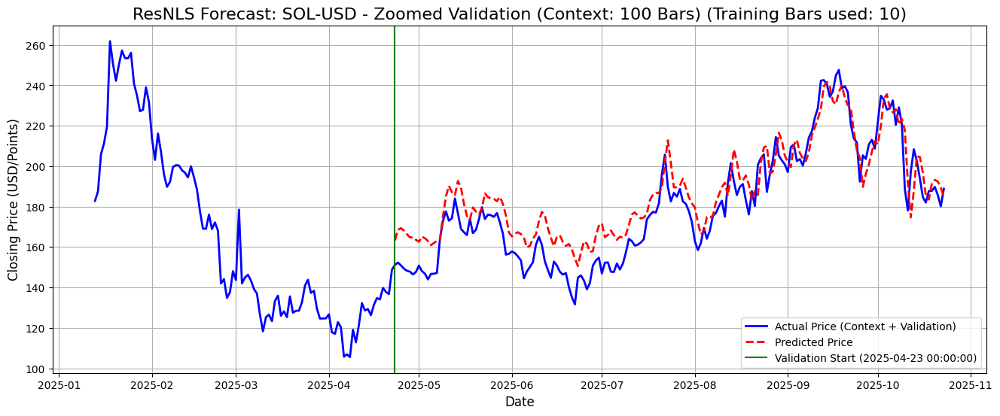

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.66% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-04-23 00:00: BUY @ 148.74 (Pred. Ret: 9.79%)
👋 2025-09-11 00:00: SELL @ 223.99 (Pred. Ret: -0.25%)
🛒 2025-10-01 00:00: BUY @ 208.74 (Pred. Ret: 1.00%)
👋 2025-10-02 00:00: SELL @ 221.69 (Pred. Ret: -0.87%)
🛒 2025-10-04 00:00: BUY @ 233.00 (Pred. Ret: 1.12%)
👋 2025-10-06 00:00: SELL @ 228.60 (Pred. Ret: -0.87%)
🛒 2025-10-08 00:00: BUY @ 220.49 (Pred. Ret: 0.08%)
👋 2025-10-09 00:00: SELL @ 229.10 (Pred. Ret: -2.49%)
🛒 2025-10-11 00:00: BUY @ 188.64 (Pred. Ret: 1.83%)
👋 2025-10-12 00:00: SELL @ 178.06 (Pred. Ret: -1.91%)
🛒 2025-10-15 00:00: BUY @ 202.46 (Pred. Ret: 1.05%)
🔚 Last Bar: Close Out @ 188.83
✅ Threshold None (0.00%) → ARR: 64.05%, Total Return: 43.54%, Buys: 6
🚀 Running backtest for threshold = 0.10%
🛒 2025-04-23 00:00: BUY @ 148.74 (Pred. Ret: 9.79%)
👋 2025-09-11 00:00: SELL @ 2

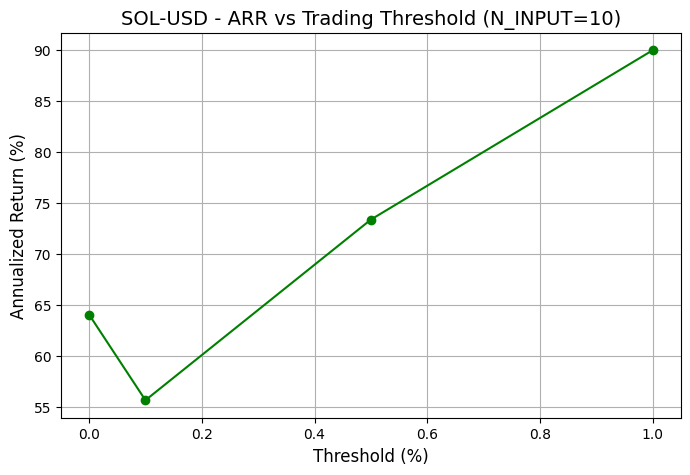

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 10.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 4/6 with N_INPUT = 20
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=20).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 20

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fi

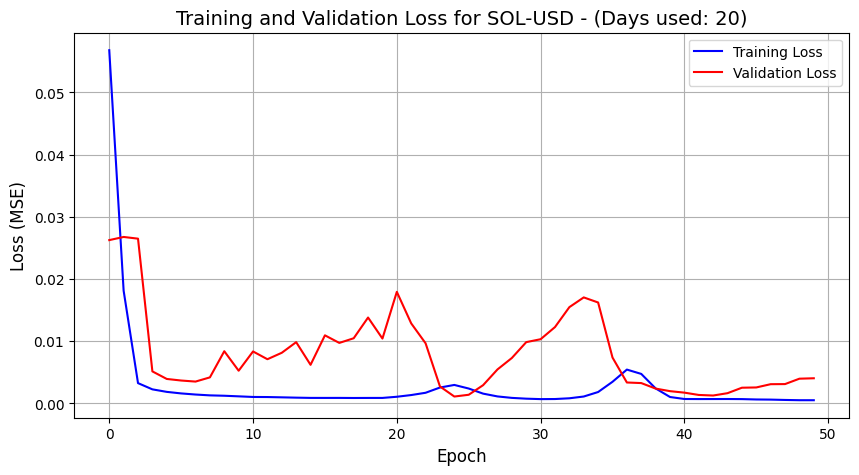

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  14.8874
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  276.144559
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 16.6176
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 8.65%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


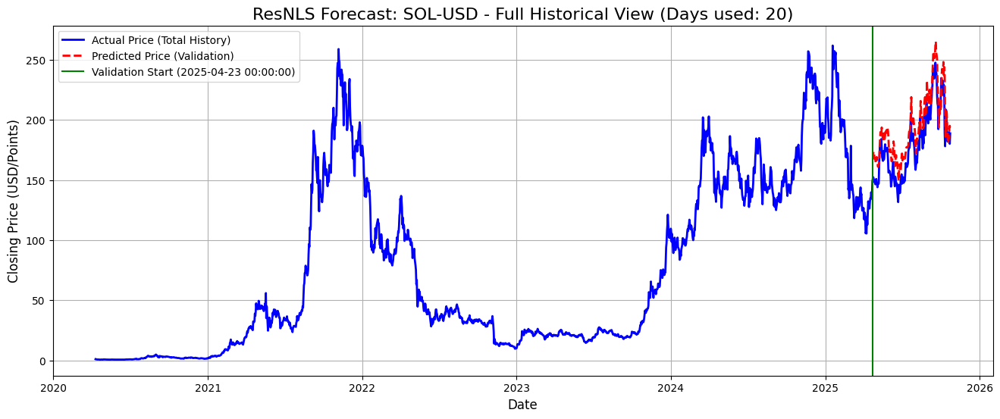

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


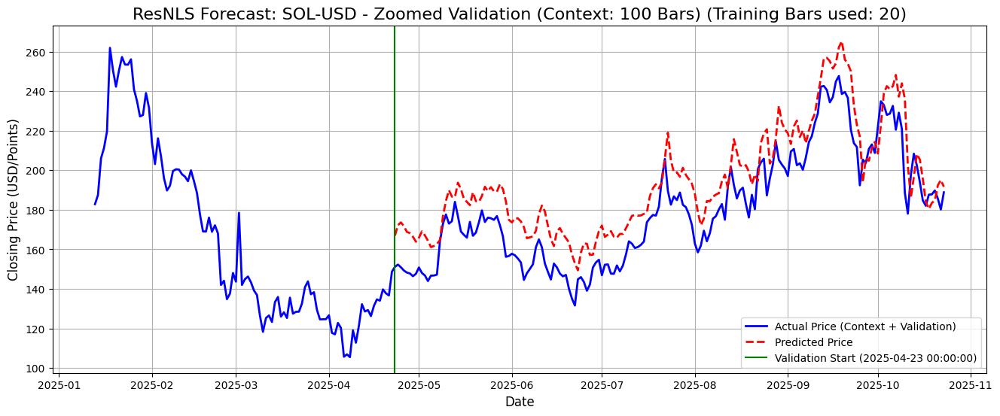

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.66% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-04-23 00:00: BUY @ 148.74 (Pred. Ret: 12.24%)
👋 2025-10-01 00:00: SELL @ 208.74 (Pred. Ret: -0.14%)
🛒 2025-10-02 00:00: BUY @ 221.69 (Pred. Ret: 0.51%)
👋 2025-10-13 00:00: SELL @ 197.51 (Pred. Ret: -0.45%)
🛒 2025-10-15 00:00: BUY @ 202.46 (Pred. Ret: 1.45%)
👋 2025-10-17 00:00: SELL @ 184.69 (Pred. Ret: -0.39%)
🛒 2025-10-21 00:00: BUY @ 189.76 (Pred. Ret: 1.37%)
🔚 Last Bar: Close Out @ 188.83
✅ Threshold None (0.00%) → ARR: 18.93%, Total Return: 13.50%, Buys: 4
🚀 Running backtest for threshold = 0.10%
🛒 2025-04-23 00:00: BUY @ 148.74 (Pred. Ret: 12.24%)
👋 2025-10-01 00:00: SELL @ 208.74 (Pred. Ret: -0.14%)
🛒 2025-10-02 00:00: BUY @ 221.69 (Pred. Ret: 0.51%)
👋 2025-10-13 00:00: SELL @ 197.51 (Pred. Ret: -0.45%)
🛒 2025-10-15 00:00: BUY @ 202.46 (Pred. Ret: 1.45%)
👋 2025-10-17 00:00: SELL @

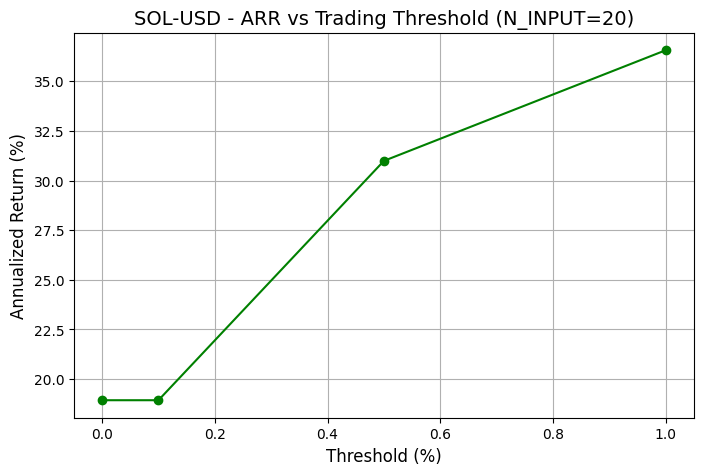

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 20.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 5/6 with N_INPUT = 40
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=40).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 40

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fi

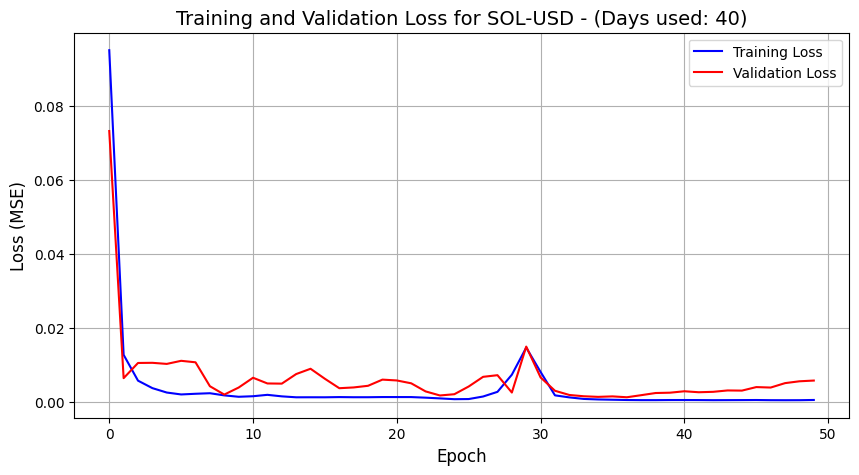

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  18.2706
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  396.970422
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 19.9241
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 10.10%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


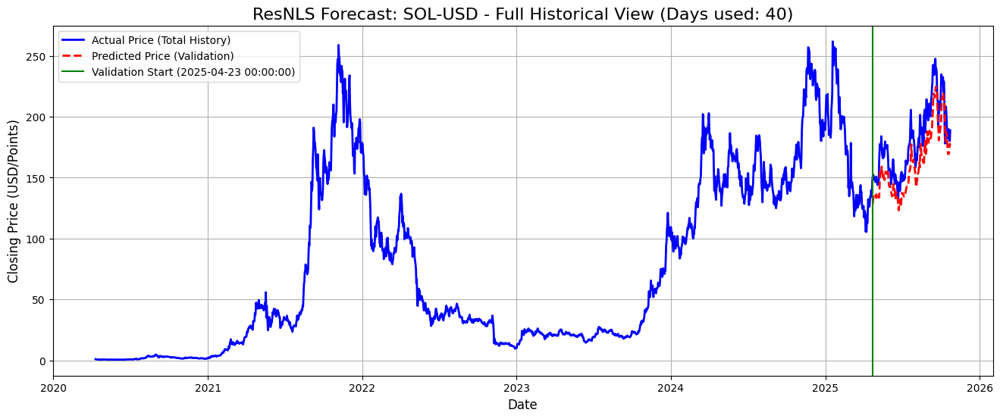

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


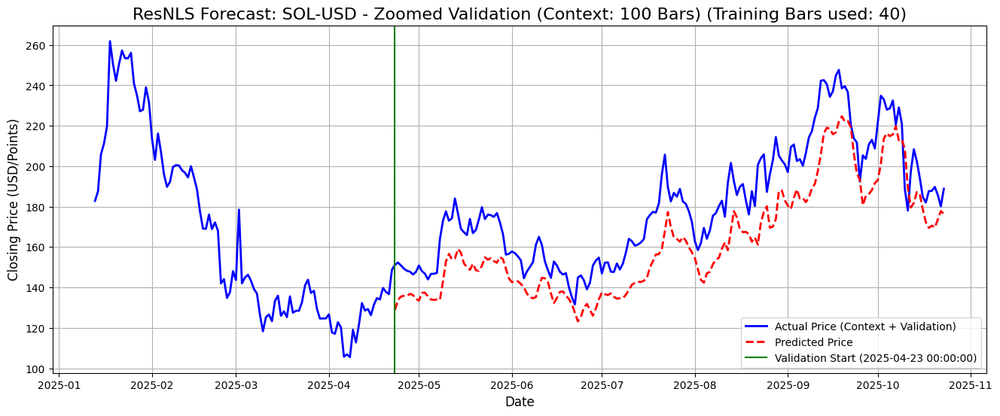

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.66% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
🛒 2025-10-11 00:00: BUY @ 188.64 (Pred. Ret: 0.33%)
👋 2025-10-13 00:00: SELL @ 197.51 (Pred. Ret: -7.94%)
✅ Threshold None (0.00%) → ARR: 6.50%, Total Return: 4.70%, Buys: 1
🚀 Running backtest for threshold = 0.10%
🛒 2025-10-11 00:00: BUY @ 188.64 (Pred. Ret: 0.33%)
👋 2025-10-13 00:00: SELL @ 197.51 (Pred. Ret: -7.94%)
✅ Threshold 0.10% → ARR: 6.50%, Total Return: 4.70%, Buys: 1
🚀 Running backtest for threshold = 0.50%
🛒 2025-10-12 00:00: BUY @ 178.06 (Pred. Ret: 0.85%)
👋 2025-10-13 00:00: SELL @ 197.51 (Pred. Ret: -7.94%)
✅ Threshold 0.50% → ARR: 15.26%, Total Return: 10.93%, Buys: 1
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%

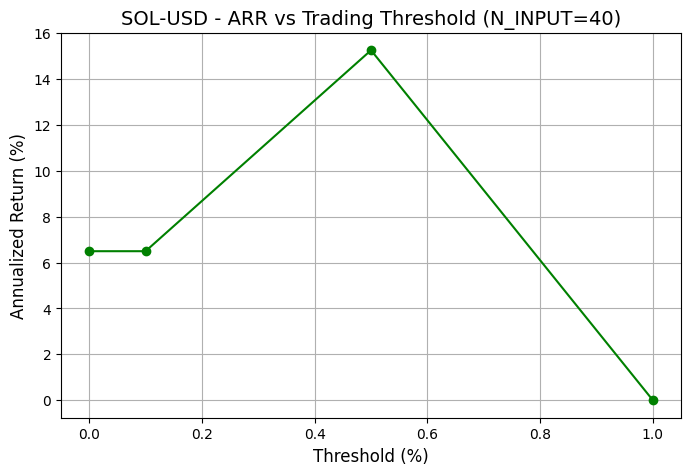

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 40.

✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🚀 Running experiment 6/6 with N_INPUT = 60
✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ ✅ 
🔥 Starting forecast run for Ticker: SOL-USD (N_INPUT=60).
   Model will test 4 trading strategies after training once.

🚀 RUN 1 of 1: Training Model Once
   Model: ResNLSForecasterWithBacktestAndResidualAddedToLSTM
   Epochs: 50, Batch: 64, Input Length: 60

✨ Initialized ResNLS Forecaster for SOL-USD (2012-01-01 to 2025-12-31).
    Backtest Thresholds: [None, 0.001, 0.005, 0.01]
The deriv setting is  False
📥 Loading data for SOL-USD...
⚖️ Scaler fi

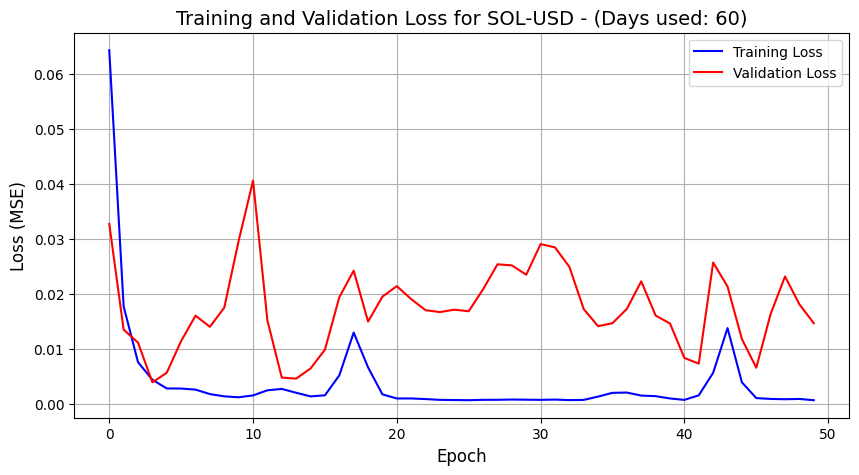

✅ Loss Plot complete.


⭐ FINAL PERFORMANCE METRICS (in original currency/points):
    📈 Ticker: SOL-USD
     📏 MAE:  30.0946
        → On average, the model misses the real price by about this much each time.
     ⚙️  MSE:  1001.607003
        → This squares big errors, so large mistakes have an extra impact here.
     📉 RMSE: 31.6482
        → Think of this as the 'typical size' of an error — it's in the same units as the price.
          The closer to 0, the better. A value of 0.5 means your predictions are usually off by 0.5 units.
     📊 MAPE: 16.63%
        → This tells you how big the average error is *in percentage terms*.
          For example, a MAPE of 2% means your predicted prices are off by ~2% on average.

🚨 High error — model might be struggling to capture short-term movements.

🖼️ 1/2: Generating Full Historical Plot...


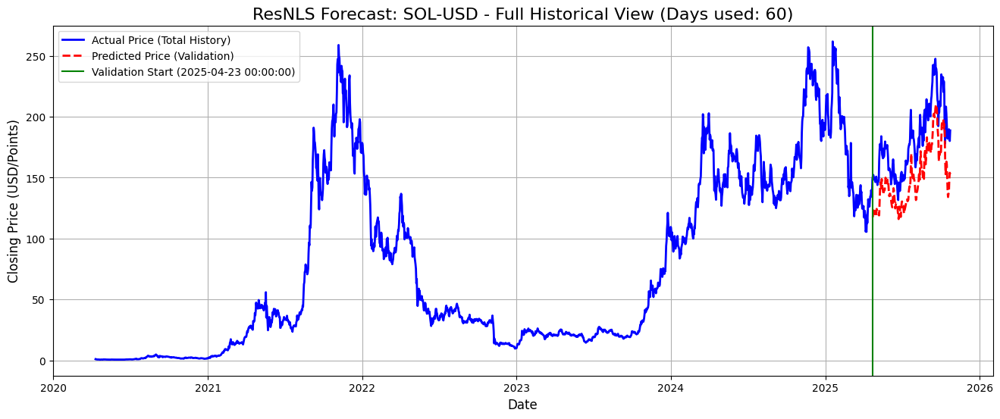

✅ Full Historical Plot complete.

🖼️ 2/2: Generating Zoomed-In Validation Plot (100 Context Points)...


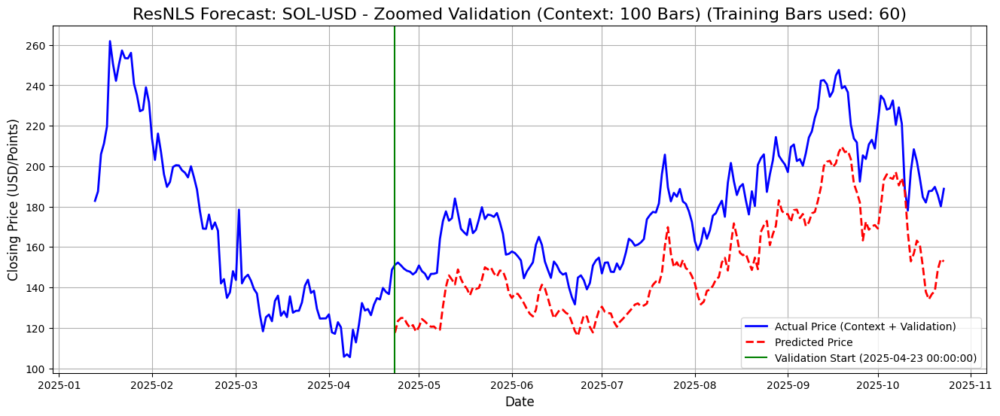

🎉 Zoomed-In Plot complete. All plots displayed.

💰 Starting Backtest for Multiple Thresholds...
📊 Benchmark ARR (Buy & Hold): 38.63% over 184 bars

🚀 Running backtest for threshold = None (0.00%)
✅ Threshold None (0.00%) → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.10%
✅ Threshold 0.10% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 0.50%
✅ Threshold 0.50% → ARR: 0.00%, Total Return: 0.00%, Buys: 0
🚀 Running backtest for threshold = 1.00%
✅ Threshold 1.00% → ARR: 0.00%, Total Return: 0.00%, Buys: 0

📈 BACKTEST SUMMARY (All Thresholds)
------------------------------------------------------------
Threshold (%)  Buys      Total Return (%)    ARR (%)   
------------------------------------------------------------
None (0.00)    0         0.00                0.00      
0.10           0         0.00                0.00      
0.50           0         0.00                0.00      
1.00           0         0.00                0.

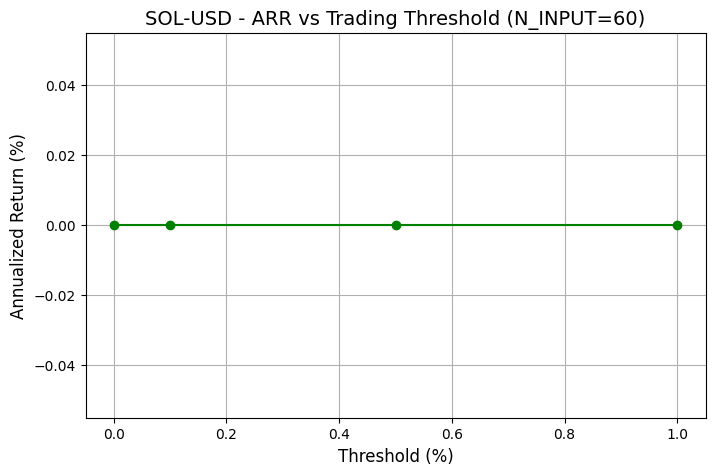

🎉 Backtest for all thresholds complete.
✅ Run completed successfully.

🎉 All stock forecast runs concluded.
✅ Finished run for N_INPUT = 60.

🎉 All N-input forecast sweeps completed for SOL-USD.


In [21]:
TICKER = 'SOL-USD'
all_n_forecasts(TICKER)

# Deriv Volatility 10 Index

In [22]:
# DERIV_SYMBOL = "R_10"         # 📈 Volatility 100 Index (VIX equivalent)
# OHLC_GRANULARITY = 60       # 📅 1 Day in seconds (to mimic daily close data)
# OHLC_COUNT = 5000              # 💾 Number of historical daily candles to fetch

# all_n_forecasts(ticker=DERIV_SYMBOL, start_date="2012-01-01", end_date="2025-12-31",threshold_list=[None, 0.001, 0.005, 0.01],deriv=True, count=OHLC_COUNT,tf=OHLC_GRANULARITY)

  

In [23]:
import zipfile
import glob
import os

def zip_pth_files(directory_to_search: str = '/kaggle/working/', output_zip_path: str = 'all_models.zip'):
    """
    Zips all .pth files found in a specified directory (and its subdirectories)
    into a single .zip archive.

    Args:
        directory_to_search (str): The directory to start the search from. 
                                   Defaults to the current directory ('.').
        output_zip_path (str): The name and path for the output .zip file.
                               Defaults to 'all_pth_files.zip'.
    """
    
    # 🔍 Use glob to find all .pth files recursively
    pth_files = glob.glob(os.path.join(directory_to_search, '**', '*.pth'), recursive=True)

    if not pth_files:
        print("⚠️ No .pth files found to zip.")
        return

    print(f"✨ Found {len(pth_files)} .pth files.")
    
    # 📦 Create the zip file
    try:
        with zipfile.ZipFile(output_zip_path, 'w', zipfile.ZIP_DEFLATED) as zipf:
            print(f"📂 Creating zip archive: {output_zip_path}")
            for file_path in pth_files:
                # 📝 Get the base filename or a relative path for the archive
                # Using os.path.basename keeps the archive structure simple,
                # otherwise you can use os.path.relpath(file_path, directory_to_search) 
                # to maintain the folder structure within the zip.
                arcname = os.path.basename(file_path) 
                
                # 🛠️ Write the file to the zip
                zipf.write(file_path, arcname=arcname)
                print(f"➡️ Added {arcname}")
                
        print(f"✅ Successfully created {output_zip_path} with {len(pth_files)} files.")

    except Exception as e:
        print(f"❌ An error occurred during zipping: {e}")


print("--- Starting Zipping in Current Directory ---")
zip_pth_files()

print("--- All models have been saved!")

--- Starting Zipping in Current Directory ---
✨ Found 60 .pth files.
📂 Creating zip archive: all_models.zip
➡️ Added ETH-USD_model_days-60.pth
➡️ Added USDJPY=X_model_days-40.pth
➡️ Added ETH-USD_model_days-3.pth
➡️ Added MSFT_model_days-40.pth
➡️ Added BTC-USD_model_days-3.pth
➡️ Added BTC-USD_model_days-20.pth
➡️ Added EURUSD=X_model_days-10.pth
➡️ Added AAPL_model_days-5.pth
➡️ Added USDJPY=X_model_days-20.pth
➡️ Added MSFT_model_days-10.pth
➡️ Added AMZN_model_days-3.pth
➡️ Added AAPL_model_days-10.pth
➡️ Added GBPUSD=X_model_days-5.pth
➡️ Added AAPL_model_days-3.pth
➡️ Added SOL-USD_model_days-60.pth
➡️ Added GOOGL_model_days-60.pth
➡️ Added SOL-USD_model_days-5.pth
➡️ Added AMZN_model_days-10.pth
➡️ Added AMZN_model_days-60.pth
➡️ Added AAPL_model_days-20.pth
➡️ Added EURUSD=X_model_days-3.pth
➡️ Added MSFT_model_days-60.pth
➡️ Added GBPUSD=X_model_days-3.pth
➡️ Added BTC-USD_model_days-5.pth
➡️ Added BTC-USD_model_days-10.pth
➡️ Added SOL-USD_model_days-40.pth
➡️ Added EURUSD=X_